In [26]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold, train_test_split
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
import lightgbm
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.preprocessing import OneHotEncoder

import matplotlib.pyplot as plt
import seaborn as sns

import optuna

import random

import warnings

warnings.filterwarnings('ignore')

<h2 style="background-color:azure; text-align:center; font-size:300%">XGBOOST</h2>

In [ ]:
train1=pd.read_csv('../input/training-apr/train.csv')
test1=pd.read_csv('../input/training-apr/test.csv')

train2=train1.copy()
test2=test1.copy()

train1.drop(columns=['PassengerId','Name','Cabin','Ticket','SibSp','Parch','Age_log','Fare','Fare_cat','SibSp_log','Parch_log','related','related_cat'], inplace=True)
test1.drop(columns=['PassengerId','Name','Cabin','Ticket','SibSp','Parch','Age_log','Fare','Fare_cat','SibSp_log','Parch_log','related','related_cat'], inplace=True)

train2.drop(columns=['PassengerId','Name','Cabin','Ticket','SibSp','Parch','Age_log','Fare','Fare_cat','SibSp_log','Parch_log','related','related_log'], inplace=True)
test2.drop(columns=['PassengerId','Name','Cabin','Ticket','SibSp','Parch','Age_log','Fare','Fare_cat','SibSp_log','Parch_log','related','related_log'], inplace=True)

print("set 1:", train1.columns, test1.columns)
print("set 2:", train2.columns, test2.columns)

In [ ]:
print("is finite set1 Train:{} Test:{}".format(np.isfinite(train1[['Age','Fare_log','related_log']]).any()[0],np.isfinite(test1[['Age','Fare_log','related_log']]).any()[0]))
print("is finite set2 Train:{} Test:{}".format(np.isfinite(train2[['Age','Fare_log']]).any()[0],np.isfinite(test2[['Age','Fare_log']]).any()[0]))

print("is nan set1 Train:{} Test:{}".format(sum(train1.isnull().sum()),sum(test1.isnull().sum())))
print("is nan set2 Train:{} Test:{}".format(sum(train2.isnull().sum()),sum(train2.isnull().sum())))

In [ ]:
score_train=pd.DataFrame(columns=['xg','rf','lg','cb']) # train data
score_test=pd.DataFrame(columns=['xg','rf','lg','cb']) # leadeboard data

In [ ]:
ohe=OneHotEncoder()
col=['Sex','Embarked']
ohe.fit(train1[col])
print(ohe.get_feature_names(col))
df1=pd.DataFrame(columns=ohe.get_feature_names(col),data=ohe.transform(train1[col]).toarray())
df2=pd.DataFrame(columns=ohe.get_feature_names(col),data=ohe.transform(test1[col]).toarray())

train1=train1.join(df1)
test1=test1.join(df2)

train1.drop(columns=['Sex','Embarked'], inplace=True)
test1.drop(columns=['Sex','Embarked'], inplace=True)


In [ ]:
train1.head()

In [ ]:
test1.head()

<h2 style="background-color:azure; text-align:center; font-size:300%">Level1 Classification</h2>

<h2 style="background-color:azure; text-align:center; font-size:200%">XGBOOST set1</h2>

In [ ]:
folds=5
SEED=random.randint(937,8641)

kf=StratifiedKFold(n_splits=folds, random_state=SEED, shuffle=True)

features=train1.columns[1:]
X = train1[features]
y = train1['Survived']


imbalanced_ratio=(train1[train1['Survived']==0]['Survived'].count()/train1[train1['Survived']==1]['Survived'].count()).round(2)
print("Imbalnce ratio: {:}".format(imbalanced_ratio))
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=SEED)

print("Distribution of train and test:", len(x_train), len(y_train), len(x_test), len(x_test))

In [ ]:
Trial=0
def objective(trial, x=x_train, y=y_train):
    global Trial
    
    para={
        'verbosity': 1,
        'objective': 'binary:logistic',
        'random_state': SEED,
        'seed': SEED,
        'tree_method':'hist',
        'scale_pos_weight': imbalanced_ratio,
        'lambda': trial.suggest_loguniform('lambda', 1e-3, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-3, 10.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 1e-1),
        'n_estimators': trial.suggest_int('n_estimators',500, 20000),
        'max_depth': trial.suggest_int('max_depth', 1, 31),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 1000)
    }
    
    print("--------------------> Trial {} <--------------------".format(Trial))
    Trial=Trial + 1
    xgboost_train_preds = np.zeros(len(y),)
    for fold, (train_ind, val_ind) in enumerate(kf.split(x, y)):
        print("--> Fold {}".format(fold + 1))
        xtrain, xval = x.iloc[train_ind], x.iloc[val_ind]
        ytrain, yval = y.iloc[train_ind], y.iloc[val_ind]
        xgboost = XGBClassifier(**para)
        
        model =  xgboost.fit(xtrain, ytrain, eval_set=[(xtrain,ytrain), (xval,yval)], 
                             eval_metric=["error", "logloss"],verbose=0, early_stopping_rounds=50)
        pred_train = model.predict(xtrain)
        pred_val = model.predict(xval)
        xgboost_train_preds[val_ind]=pred_val
        score1 = accuracy_score(ytrain, pred_train)
        score2 = accuracy_score(yval, pred_val)
        print('Fold {} ACCURACY Train: {} Validation: {}'.format(fold+1, score1, score2))
        
        results = model.evals_result()
        df=pd.DataFrame({
                        "validation_train_ll":results["validation_0"]["logloss"],
                        "validation_test_ll":results["validation_1"]["logloss"],
                        "validation_train_acc":results["validation_0"]["error"],
                        "validation_test_acc":results["validation_1"]["error"],
                        
        })
        df['validation_train_acc']=(1-df['validation_train_acc'])*100.0
        df['validation_test_acc']=(1-df['validation_test_acc'])*100.0
#         print(df.head())
        
        fig, ax = plt.subplots(ncols=2, figsize=(12,6))
        sns.lineplot(data=df, x=df.index, y="validation_train_ll", ax=ax[0], label="Train loss")
        sns.lineplot(data=df, x=df.index, y="validation_test_ll", ax=ax[0], label="Test loss")
        sns.lineplot(data=df, x=df.index, y="validation_train_acc", ax=ax[1], label="Train acc.")
        sns.lineplot(data=df, x=df.index, y="validation_test_acc", ax=ax[1], label="Test acc.")
        ax[0].set_title("Loss curve")
        ax[1].set_title("Accuracy curve")
        ax[0].set_ylabel("Loss")
        ax[0].set_xlabel("Itertation")
        ax[1].set_ylabel("Accuracy")
        ax[1].set_xlabel("Itertation")
        fig.suptitle("XGBoost Loss/Accuracy.")
        plt.show()
    acc=accuracy_score(y, xgboost_train_preds)
    print('OOF ACCURACY: {}'.format(acc))
    return acc

In [ ]:
study=optuna.create_study(study_name="XGBoost set 1 Optimization", direction='maximize')
study.optimize(objective, n_trials=25)

trial = study.best_trial
print('Accuracy: {}'.format(trial.value))

print("Best hyperparameters: {}".format(trial.params))

In [ ]:
#Tuning keeping the N-estimator same as the above best parameter
Trial=0
def objective(trial, x=x_train, y=y_train):
    global Trial
    
    para={
        'verbosity': 1,
        'objective': 'binary:logistic',
        'random_state': SEED,
        'seed': SEED,
        'tree_method':'hist',
        'scale_pos_weight': imbalanced_ratio,
        'n_estimators': 7657,
        'lambda': trial.suggest_loguniform('lambda', 1e-3, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-3, 10.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 1e-1),
        'max_depth': trial.suggest_int('max_depth', 1, 31),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 1000)
    }
    
    print("--------------------> Trial {} <--------------------".format(Trial))
    Trial=Trial + 1
    xgboost_train_preds = np.zeros(len(y),)
    for fold, (train_ind, val_ind) in enumerate(kf.split(x, y)):
        print("--> Fold {}".format(fold + 1))
        xtrain, xval = x.iloc[train_ind], x.iloc[val_ind]
        ytrain, yval = y.iloc[train_ind], y.iloc[val_ind]
        xgboost = XGBClassifier(**para)
        
        model =  xgboost.fit(xtrain, ytrain, eval_set=[(xtrain,ytrain), (xval,yval)], 
                             eval_metric=["error", "logloss"],verbose=0, early_stopping_rounds=50)
        pred_train = model.predict(xtrain)
        pred_val = model.predict(xval)
        xgboost_train_preds[val_ind]=pred_val
        score1 = accuracy_score(ytrain, pred_train)
        score2 = accuracy_score(yval, pred_val)
        print('Fold {} ACCURACY Train: {} Validation: {}'.format(fold+1, score1, score2))
        
        results = model.evals_result()
        df=pd.DataFrame({
                        "validation_train_ll":results["validation_0"]["logloss"],
                        "validation_test_ll":results["validation_1"]["logloss"],
                        "validation_train_acc":results["validation_0"]["error"],
                        "validation_test_acc":results["validation_1"]["error"],
                        
        })
        df['validation_train_acc']=(1-df['validation_train_acc'])*100.0
        df['validation_test_acc']=(1-df['validation_test_acc'])*100.0
#         print(df.head())
        
        fig, ax = plt.subplots(ncols=2, figsize=(12,6))
        sns.lineplot(data=df, x=df.index, y="validation_train_ll", ax=ax[0], label="Train loss")
        sns.lineplot(data=df, x=df.index, y="validation_test_ll", ax=ax[0], label="Test loss")
        sns.lineplot(data=df, x=df.index, y="validation_train_acc", ax=ax[1], label="Train acc.")
        sns.lineplot(data=df, x=df.index, y="validation_test_acc", ax=ax[1], label="Test acc.")
        ax[0].set_title("Loss curve")
        ax[1].set_title("Accuracy curve")
        ax[0].set_ylabel("Loss")
        ax[0].set_xlabel("Itertation")
        ax[1].set_ylabel("Accuracy")
        ax[1].set_xlabel("Itertation")
        fig.suptitle("XGBoost Loss/Accuracy.")
        plt.show()
    acc=accuracy_score(y, xgboost_train_preds)
    print('OOF ACCURACY: {}'.format(acc))
    return acc

In [ ]:
study=optuna.create_study(study_name="XGBoost Optimization", direction='maximize')
study.optimize(objective, n_trials=15)

trial = study.best_trial
print('Accuracy: {}'.format(trial.value))

print("Best hyperparameters: {}".format(trial.params))

<h2 style="background-color:azure; text-align:center; font-size:200%">XGBOOST tuned model set1</h2>

In [ ]:
para = {
       'verbosity': 1,
       'objective': 'binary:logistic',
       'random_state': SEED,
       'seed': SEED,
       'tree_method':'hist',
       'scale_pos_weight': imbalanced_ratio,
       'lambda': 0.040336438299178316, 
       'alpha': 1.6115451006296893, 
       'colsample_bytree': 0.6421153349186888, 
       'subsample': 0.9948174596370332, 
       'learning_rate': 0.08617507766633564, 
       'n_estimators': 7657, 
       'max_depth': 18, 
       'min_child_weight': 114
       }

In [ ]:
xg_train_preds = np.zeros(len(y_train),)
xg_test_preds = np.zeros(len(y_test),)
xg_test = np.zeros(len(test1),)
for fold, (train_ind, val_ind) in enumerate(kf.split(x_train, y_train)):
    print("--> Fold {}".format(fold + 1))
    
    xtrain, xval = x_train.iloc[train_ind], x_train.iloc[val_ind]
    ytrain, yval = y_train.iloc[train_ind], y_train.iloc[val_ind]
    
    xgboost = XGBClassifier(**para)

    model = xgboost.fit(xtrain, ytrain, eval_set=[(xtrain,ytrain), (xval,yval)], 
                         eval_metric=["error", "logloss"], verbose=0, early_stopping_rounds=50)
    pred_train = model.predict_proba(xtrain)[:,1]
    pred_val = model.predict_proba(xval)[:,1]
    xg_train_preds[val_ind] = pred_val
    xg_test_preds += (model.predict_proba(x_test)[:,1])/folds
    xg_test += (model.predict_proba(test1)[:,1])/folds
    score1 = accuracy_score(ytrain, np.where(pred_train<=0.5, 0, 1))
    score2 = accuracy_score(yval, np.where(pred_val<=0.5, 0, 1))
    print('Fold {} ACCURACY Train: {} Validation: {}'.format(fold+1, score1, score2))

    results = model.evals_result()
    df=pd.DataFrame({
                    "validation_train_ll":results["validation_0"]["logloss"],
                    "validation_test_ll":results["validation_1"]["logloss"],
                    "validation_train_acc":results["validation_0"]["error"],
                    "validation_test_acc":results["validation_1"]["error"],

    })
    df['validation_train_acc']=(1-df['validation_train_acc'])*100.0
    df['validation_test_acc']=(1-df['validation_test_acc'])*100.0
    #         print(df.head())

    fig, ax = plt.subplots(ncols=2, figsize=(12,6))
    sns.lineplot(data=df, x=df.index, y="validation_train_ll", ax=ax[0], label="Train loss")
    sns.lineplot(data=df, x=df.index, y="validation_test_ll", ax=ax[0], label="Test loss")
    sns.lineplot(data=df, x=df.index, y="validation_train_acc", ax=ax[1], label="Train acc.")
    sns.lineplot(data=df, x=df.index, y="validation_test_acc", ax=ax[1], label="Test acc.")
    ax[0].set_title("Loss curve")
    ax[1].set_title("Accuracy curve")
    ax[0].set_ylabel("Loss")
    ax[0].set_xlabel("Itertation")
    ax[1].set_ylabel("Accuracy")
    ax[1].set_xlabel("Itertation")
    fig.suptitle("XGBoost Loss/Accuracy.")
    plt.show()
    
acc1 = accuracy_score(y_train, np.where(xg_train_preds<=0.5, 0, 1))
acc2 = accuracy_score(y_test, np.where(xg_test_preds<=0.5, 0, 1))
print('OOF ACCURACY Train: {} Test: {}'.format(acc1, acc2))

score_train['xg']=np.concatenate([xg_train_preds,xg_test_preds])
score_test['xg']=xg_test

In [ ]:
score_train.head()

In [ ]:
score_test.head()

In [ ]:
score_train.to_csv('./score_train.csv',index=False)
score_test.to_csv('./score_test.csv',index=False)

In [ ]:
test_=pd.read_csv('../input/tabular-playground-series-apr-2021/test.csv')
df=pd.DataFrame()
df['PassengerId']=test_['PassengerId'].values
df['Survived']=score_test['xg']
df['Survived']=df['Survived'].apply(lambda x:0 if x<=0.5 else 1)
df.to_csv('./xg_tuned.csv',index=False)

<h2 style="background-color:azure; text-align:center; font-size:200%">XGBOOST set2</h2>

In [ ]:
ohe=OneHotEncoder()
col=['Sex','Embarked']
ohe.fit(train2[col])
print(ohe.get_feature_names(col))
df1=pd.DataFrame(columns=ohe.get_feature_names(col),data=ohe.transform(train2[col]).toarray())
df2=pd.DataFrame(columns=ohe.get_feature_names(col),data=ohe.transform(test2[col]).toarray())

train2=train2.join(df1)
test2=test2.join(df2)

train2['related_cat'] = train2['related_cat'].apply(lambda x:1 if x in ['low'] else 2)
test2['related_cat'] = test2['related_cat'].apply(lambda x:1 if x in ['low'] else 2)

train2.drop(columns=['Sex','Embarked'], inplace=True)
test2.drop(columns=['Sex','Embarked'], inplace=True)


In [ ]:
train2.head()

In [ ]:
test2.head()

In [ ]:
folds=5
SEED=random.randint(937,8641)

kf=StratifiedKFold(n_splits=folds, random_state=SEED, shuffle=True)

features=train2.columns[1:]
X = train2[features]
y = train2['Survived']


imbalanced_ratio=(train2[train2['Survived']==0]['Survived'].count()/train2[train2['Survived']==1]['Survived'].count()).round(2)
print("Imbalnce ratio: {:}".format(imbalanced_ratio))

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=SEED)
print("Distribution of train and test:", len(x_train), len(y_train), len(x_test), len(x_test))

In [ ]:
Trial=0
def objective(trial, x=x_train, y=y_train):
    global Trial
    
    para={
        'verbosity': 1,
        'objective': 'binary:logistic',
        'random_state': SEED,
        'seed': SEED,
        'tree_method':'hist',
        'scale_pos_weight': imbalanced_ratio,
        'lambda': trial.suggest_loguniform('lambda', 1e-3, 10.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-3, 10.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'learning_rate': trial.suggest_float('learning_rate', 1e-4, 1e-1),
        'n_estimators': trial.suggest_int('n_estimators',500, 20000),
        'max_depth': trial.suggest_int('max_depth', 1, 31),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 1000)
    }
    
    print("--------------------> Trial {} <--------------------".format(Trial))
    Trial=Trial + 1
    xgboost_train_preds = np.zeros(len(y),)
    for fold, (train_ind, val_ind) in enumerate(kf.split(x, y)):
        print("--> Fold {}".format(fold + 1))
        xtrain, xval = x.iloc[train_ind], x.iloc[val_ind]
        ytrain, yval = y.iloc[train_ind], y.iloc[val_ind]
        xgboost = XGBClassifier(**para)
        
        model =  xgboost.fit(xtrain, ytrain, eval_set=[(xtrain,ytrain), (xval,yval)], 
                             eval_metric=["error", "logloss"],verbose=0, early_stopping_rounds=50)
        pred_train = model.predict(xtrain)
        pred_val = model.predict(xval)
        xgboost_train_preds[val_ind]=pred_val
        score1 = accuracy_score(ytrain, pred_train)
        score2 = accuracy_score(yval, pred_val)
        print('Fold {} ACCURACY Train: {} Validation: {}'.format(fold+1, score1, score2))
        
        results = model.evals_result()
        df=pd.DataFrame({
                        "validation_train_ll":results["validation_0"]["logloss"],
                        "validation_test_ll":results["validation_1"]["logloss"],
                        "validation_train_acc":results["validation_0"]["error"],
                        "validation_test_acc":results["validation_1"]["error"],
                        
        })
        df['validation_train_acc']=(1-df['validation_train_acc'])*100.0
        df['validation_test_acc']=(1-df['validation_test_acc'])*100.0
#         print(df.head())
        
        fig, ax = plt.subplots(ncols=2, figsize=(12,6))
        sns.lineplot(data=df, x=df.index, y="validation_train_ll", ax=ax[0], label="Train loss")
        sns.lineplot(data=df, x=df.index, y="validation_test_ll", ax=ax[0], label="Test loss")
        sns.lineplot(data=df, x=df.index, y="validation_train_acc", ax=ax[1], label="Train acc.")
        sns.lineplot(data=df, x=df.index, y="validation_test_acc", ax=ax[1], label="Test acc.")
        ax[0].set_title("Loss curve")
        ax[1].set_title("Accuracy curve")
        ax[0].set_ylabel("Loss")
        ax[0].set_xlabel("Itertation")
        ax[1].set_ylabel("Accuracy")
        ax[1].set_xlabel("Itertation")
        fig.suptitle("XGBoost Loss/Accuracy.")
        plt.show()
    acc=accuracy_score(y, xgboost_train_preds)
    print('OOF ACCURACY: {}'.format(acc))
    return acc

In [ ]:
study=optuna.create_study(study_name="XGBoost set 2 Optimization", direction='maximize')
study.optimize(objective, n_trials=50)

trial = study.best_trial
print('Accuracy: {}'.format(trial.value))

print("Best hyperparameters: {}".format(trial.params))

<h2 style="background-color:azure; text-align:center; font-size:200%">XGBOOST set2 tuned model</h2>

In [ ]:
para = {
        'verbosity': 1,
        'objective': 'binary:logistic',
        'random_state': SEED,
        'seed': SEED,
        'tree_method':'hist',
        'scale_pos_weight': imbalanced_ratio,
        'lambda': 0.23870865587316725, 
        'alpha': 0.05851635206035666, 
        'colsample_bytree': 0.1050482977664344, 
        'subsample': 0.9719852687976757, 
        'learning_rate': 0.06744568400126143, 
        'n_estimators': 19537, 'max_depth': 3, 
        'min_child_weight': 498
}

In [ ]:
xg_train_preds = np.zeros(len(y_train),)
xg_test_preds = np.zeros(len(y_test),)
xg_test = np.zeros(len(test2),)
for fold, (train_ind, val_ind) in enumerate(kf.split(x_train, y_train)):
    print("--> Fold {}".format(fold + 1))
    
    xtrain, xval = x_train.iloc[train_ind], x_train.iloc[val_ind]
    ytrain, yval = y_train.iloc[train_ind], y_train.iloc[val_ind]
    
    xgboost = XGBClassifier(**para)

    model = xgboost.fit(xtrain, ytrain, eval_set=[(xtrain,ytrain), (xval,yval)], 
                         eval_metric=["error", "logloss"], verbose=0, early_stopping_rounds=50)
    pred_train = model.predict_proba(xtrain)[:,1]
    pred_val = model.predict_proba(xval)[:,1]
    xg_train_preds[val_ind] = pred_val
    xg_test_preds += (model.predict_proba(x_test)[:,1])/folds
    xg_test += (model.predict_proba(test2)[:,1])/folds
    score1 = accuracy_score(ytrain, np.where(pred_train<=0.5, 0, 1))
    score2 = accuracy_score(yval, np.where(pred_val<=0.5, 0, 1))
    print('Fold {} ACCURACY Train: {} Validation: {}'.format(fold+1, score1, score2))

    results = model.evals_result()
    df=pd.DataFrame({
                    "validation_train_ll":results["validation_0"]["logloss"],
                    "validation_test_ll":results["validation_1"]["logloss"],
                    "validation_train_acc":results["validation_0"]["error"],
                    "validation_test_acc":results["validation_1"]["error"],

    })
    df['validation_train_acc']=(1-df['validation_train_acc'])*100.0
    df['validation_test_acc']=(1-df['validation_test_acc'])*100.0
    #         print(df.head())

    fig, ax = plt.subplots(ncols=2, figsize=(12,6))
    sns.lineplot(data=df, x=df.index, y="validation_train_ll", ax=ax[0], label="Train loss")
    sns.lineplot(data=df, x=df.index, y="validation_test_ll", ax=ax[0], label="Test loss")
    sns.lineplot(data=df, x=df.index, y="validation_train_acc", ax=ax[1], label="Train acc.")
    sns.lineplot(data=df, x=df.index, y="validation_test_acc", ax=ax[1], label="Test acc.")
    ax[0].set_title("Loss curve")
    ax[1].set_title("Accuracy curve")
    ax[0].set_ylabel("Loss")
    ax[0].set_xlabel("Itertation")
    ax[1].set_ylabel("Accuracy")
    ax[1].set_xlabel("Itertation")
    fig.suptitle("XGBoost Loss/Accuracy.")
    plt.show()
    
acc1 = accuracy_score(y_train, np.where(xg_train_preds<=0.5, 0, 1))
acc2 = accuracy_score(y_test, np.where(xg_test_preds<=0.5, 0, 1))
print('OOF ACCURACY Train: {} Test: {}'.format(acc1, acc2))

# score_train['xg']=np.concatenate([xg_train_preds,xg_test_preds])
# score_test['xg']=xg_test

In [ ]:
test_=pd.read_csv('../input/tabular-playground-series-apr-2021/test.csv')
df=pd.DataFrame()
df['PassengerId']=test_['PassengerId'].values
df['Survived']=xg_test
df['Survived']=df['Survived'].apply(lambda x:0 if x<=0.5 else 1)
df.to_csv('./xg_tuned_set2.csv',index=False)

<span style="background-color:orange; font-size:150%">**Observation**</span>
* For XGBOOST train set 1 gave better results in public leaderboard compared to train set 2  

<h2 style="background-color:azure; text-align:center; font-size:200%">LightGBM</h2>

In [2]:
train1=pd.read_csv('../input/training-apr/train.csv')
test1=pd.read_csv('../input/training-apr/test.csv')

train2=train1.copy()
test2=test1.copy()

train1.drop(columns=['PassengerId','Name','Cabin','Ticket','SibSp','Parch','Age_log','Fare','Fare_cat','SibSp_log','Parch_log','related','related_cat'], inplace=True)
test1.drop(columns=['PassengerId','Name','Cabin','Ticket','SibSp','Parch','Age_log','Fare','Fare_cat','SibSp_log','Parch_log','related','related_cat'], inplace=True)

train2.drop(columns=['PassengerId','Name','Cabin','Ticket','SibSp','Parch','Age_log','Fare','Fare_cat','SibSp_log','Parch_log','related','related_log'], inplace=True)
test2.drop(columns=['PassengerId','Name','Cabin','Ticket','SibSp','Parch','Age_log','Fare','Fare_cat','SibSp_log','Parch_log','related','related_log'], inplace=True)

print("set 1:", train1.columns, test1.columns)
print("set 2:", train2.columns, test2.columns)

set 1: Index(['Survived', 'Pclass', 'Sex', 'Age', 'Embarked', 'Fare_log',
       'related_log'],
      dtype='object') Index(['Pclass', 'Sex', 'Age', 'Embarked', 'Fare_log', 'related_log'], dtype='object')
set 2: Index(['Survived', 'Pclass', 'Sex', 'Age', 'Embarked', 'Fare_log',
       'related_cat'],
      dtype='object') Index(['Pclass', 'Sex', 'Age', 'Embarked', 'Fare_log', 'related_cat'], dtype='object')


<span style="background-color:orange; font-size:150%">**Important Point**</span>
* The cat features of lightgbm should only be used when you have high cardinality in categorical features. 
* It is common to represent categorical features with one-hot encoding, but this approach is suboptimal for tree learners. Particularly for high-cardinality categorical features, a tree built on one-hot features tends to be unbalanced and needs to grow very deep to achieve good accuracy.Instead of one-hot encoding, the optimal solution is to split on a categorical feature by partitioning its categories into 2 subsets. If the feature has k categories, there are 2^(k-1) - 1 possible partitions. But there is an efficient solution for regression trees. It needs about O(k * log(k)) to find the optimal partition.

In [3]:
ohe=OneHotEncoder()
col=['Sex','Embarked']
ohe.fit(train1[col])
print(ohe.get_feature_names(col))
df1=pd.DataFrame(columns=ohe.get_feature_names(col),data=ohe.transform(train1[col]).toarray())
df2=pd.DataFrame(columns=ohe.get_feature_names(col),data=ohe.transform(test1[col]).toarray())

train1=train1.join(df1)
test1=test1.join(df2)

train1.drop(columns=['Sex','Embarked'], inplace=True)
test1.drop(columns=['Sex','Embarked'], inplace=True)

['Sex_female' 'Sex_male' 'Embarked_C' 'Embarked_Q' 'Embarked_S'
 'Embarked_X']


In [4]:
train1.head()

,Survived,Pclass,Age,Fare_log,related_log,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Embarked_X
0,1,3,36.00,3.337192,1.098612,0.0,1.0,0.0,0.0,1.0,0.0
1,0,1,36.00,2.663750,0.000000,0.0,1.0,0.0,0.0,1.0,0.0
2,0,1,0.33,4.280686,1.386294,0.0,1.0,0.0,0.0,1.0,0.0
3,0,1,19.00,2.641910,0.000000,0.0,1.0,0.0,0.0,1.0,0.0
4,1,1,25.00,2.170196,0.000000,0.0,1.0,0.0,0.0,1.0,0.0


In [5]:
test1.head()

,Pclass,Age,Fare_log,related_log,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Embarked_X
0,1,19.0,4.159039,0.000000,0.0,1.0,0.0,0.0,1.0,0.0
1,1,53.0,1.918392,0.000000,1.0,0.0,0.0,0.0,1.0,0.0
2,3,19.0,3.686627,0.000000,1.0,0.0,1.0,0.0,0.0,0.0
3,2,25.0,2.634045,0.000000,0.0,1.0,0.0,0.0,1.0,0.0
4,3,17.0,3.328268,1.098612,1.0,0.0,1.0,0.0,0.0,0.0


<h2 style="background-color:azure; text-align:center; font-size:200%">LightGBM set1</h2>

In [6]:
folds=5
SEED=random.randint(937,8641)

kf=StratifiedKFold(n_splits=folds, random_state=SEED, shuffle=True)

features=train1.columns[1:]
X = train1[features]
y = train1['Survived']


imbalanced_ratio=(train1[train1['Survived']==0]['Survived'].count()/train1[train1['Survived']==1]['Survived'].count()).round(2)
print("Imbalnce ratio: {:}".format(imbalanced_ratio))
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=SEED)

print("Distribution of train and test:", len(x_train), len(y_train), len(x_test), len(x_test))

Imbalnce ratio: 1.34
Distribution of train and test: 80000 80000 20000 20000


In [19]:
Trial=0

early_stopping_round = lightgbm.early_stopping(100, first_metric_only=True, verbose=True)

def objective(trial, x=x_train, y=y_train):
    global Trial
    
    para = {
              'verbosity': 1,
              'random_state': SEED,
              'n_jobs': -1,
              'is_unbalance': True,
              'bagging_seed': SEED,
              'feature_fraction_seed': SEED,
              'objective': 'binary',
              'boosting': trial.suggest_categorical('boosting', ['gbdt','rf','dart']),
              'n_estimators': trial.suggest_int('n_estimators',500, 20000),
              'learning_rate': trial.suggest_float('learning_rate', 1e-4, 1e-1),
              'max_depth': trial.suggest_int('max_depth', 6, 127),
              'num_leaves': trial.suggest_int('num_leaves', 31, 128),
              'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0),
              'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0),
              'feature_fraction': trial.suggest_float('feature_fraction', 0.2, 0.9),
              'min_child_samples': trial.suggest_int('min_child_samples', 1, 300),
              'bagging_freq': trial.suggest_int('bagging_freq', 50, 15000),
              'bagging_fraction': trial.suggest_float('bagging_fraction', 0, 0.9),
              'max_bin': trial.suggest_int('max_bin', 128, 1024)
            }
    
    print("--------------------> Trial {} <--------------------".format(Trial))
    Trial=Trial + 1
    lgbm_train_preds = np.zeros(len(y),)
    for fold, (train_ind, val_ind) in enumerate(kf.split(x, y)):
        print("--> Fold {}".format(fold + 1))
        xtrain, xval = x.iloc[train_ind], x.iloc[val_ind]
        ytrain, yval = y.iloc[train_ind], y.iloc[val_ind]
        lgbm = LGBMClassifier(**para)
        
        model =  lgbm.fit(xtrain, ytrain, eval_set=[(xtrain,ytrain), (xval,yval)], categorical_feature=None,
                             eval_metric = ['binary_logloss', 'binary_error'], verbose=-1, callbacks=[early_stopping_round])
        
        pred_train = model.predict(xtrain, num_iteration=model.best_iteration_)
        pred_val = model.predict(xval, num_iteration=model.best_iteration_)
        lgbm_train_preds[val_ind]=pred_val
        score1 = accuracy_score(ytrain, pred_train)
        score2 = accuracy_score(yval, pred_val)
        print('Fold {} ACCURACY Train: {} Validation: {}'.format(fold+1, score1, score2))
        
        results = model.evals_result_
        df=pd.DataFrame({
                        "train_ll":results["training"]["binary_logloss"],
                        "validation_ll":results["valid_1"]["binary_logloss"],
                        "train_acc":results["training"]["binary_error"],
                        "test_acc":results["valid_1"]["binary_error"],
                        
        })
        df['train_acc']=(1-df['train_acc'])*100.0
        df['test_acc']=(1-df['test_acc'])*100.0
#         print(df.head())
        
        fig, ax = plt.subplots(ncols=2, figsize=(12,6))
        sns.lineplot(data=df, x=df.index, y="train_ll", ax=ax[0], label="Train loss")
        sns.lineplot(data=df, x=df.index, y="validation_ll", ax=ax[0], label="Validation loss")
        sns.lineplot(data=df, x=df.index, y="train_acc", ax=ax[1], label="Train acc.")
        sns.lineplot(data=df, x=df.index, y="test_acc", ax=ax[1], label="Validation acc.")
        ax[0].set_title("Loss curve")
        ax[1].set_title("Accuracy curve")
        ax[0].set_ylabel("Loss")
        ax[0].set_xlabel("Itertation")
        ax[1].set_ylabel("Accuracy")
        ax[1].set_xlabel("Itertation")
        fig.suptitle("LightGBM Loss/Accuracy.")
        plt.show()
    acc=accuracy_score(y, lgbm_train_preds)
    print('OOF ACCURACY: {}'.format(acc))
    return acc

[I 2021-04-13 19:32:01,881] A new study created in memory with name: LightGBM set 1 Optimization


--------------------> Trial 0 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=

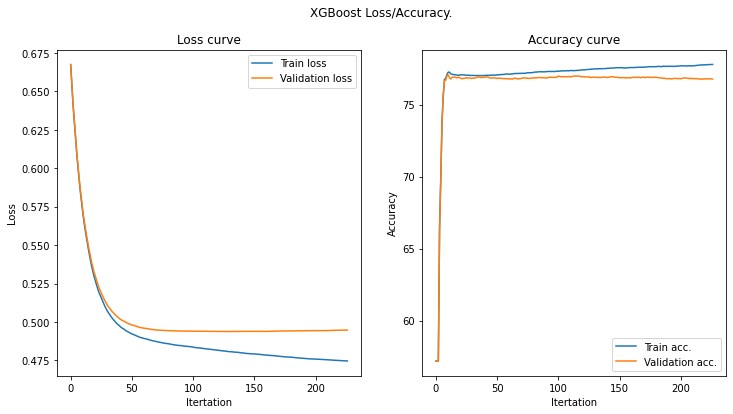

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

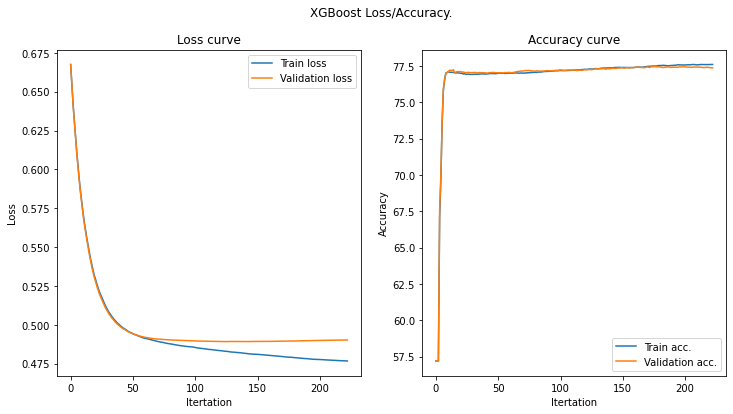

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

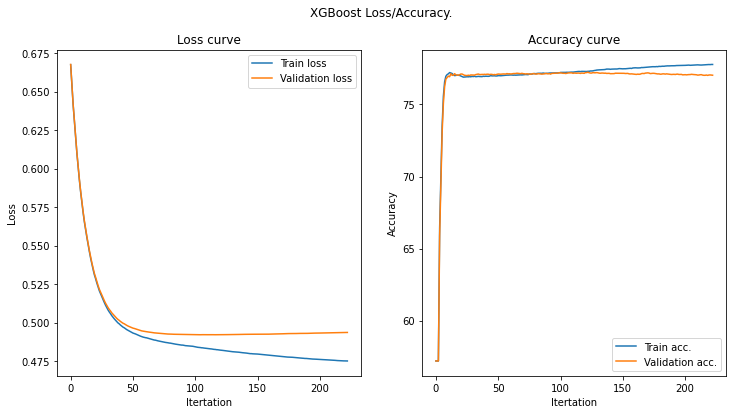

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

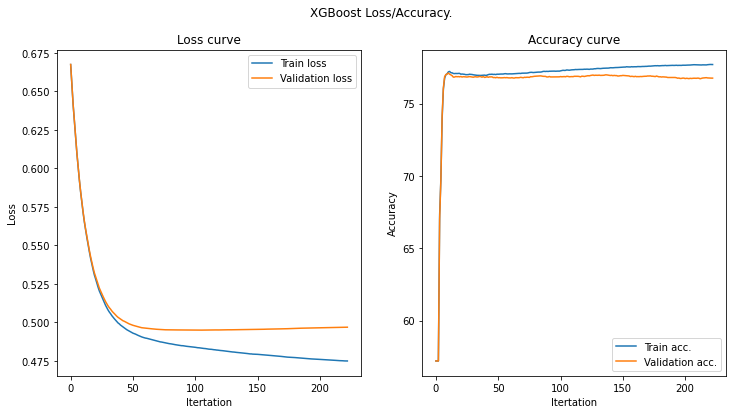

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

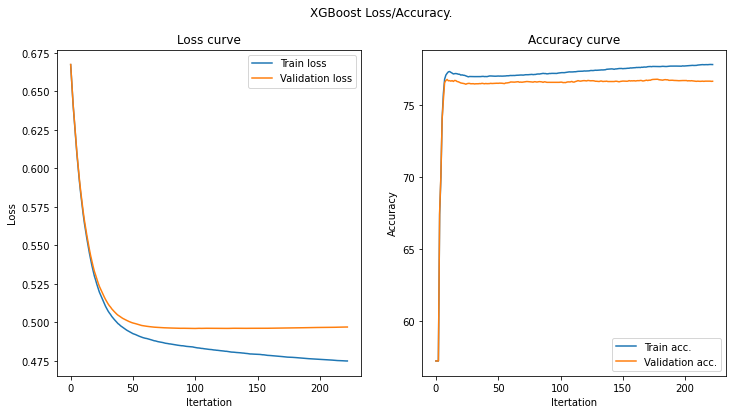

[I 2021-04-13 19:32:22,226] Trial 0 finished with value: 0.7699625 and parameters: {'boosting': 'gbdt', 'n_estimators': 9376, 'learning_rate': 0.046736354175367235, 'max_depth': 54, 'num_leaves': 106, 'reg_alpha': 3.846833481689629, 'reg_lambda': 5.814231409330497, 'feature_fraction': 0.6477546229339732, 'min_child_samples': 235, 'bagging_freq': 2622, 'bagging_fraction': 0.7721683858465518, 'max_bin': 453}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7699625
--------------------> Trial 1 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.473748524153981
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning

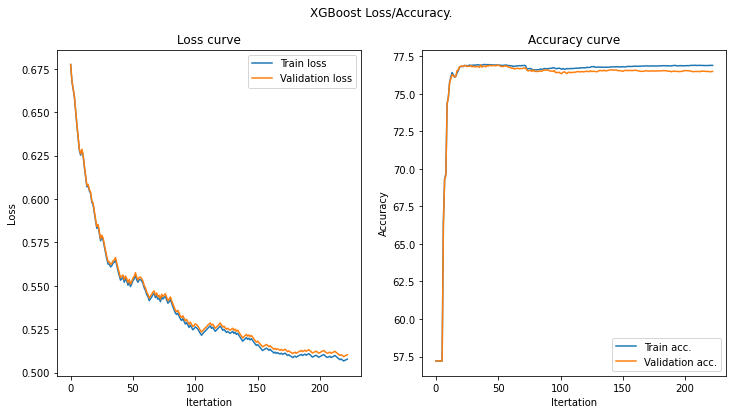

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.473748524153981
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ig

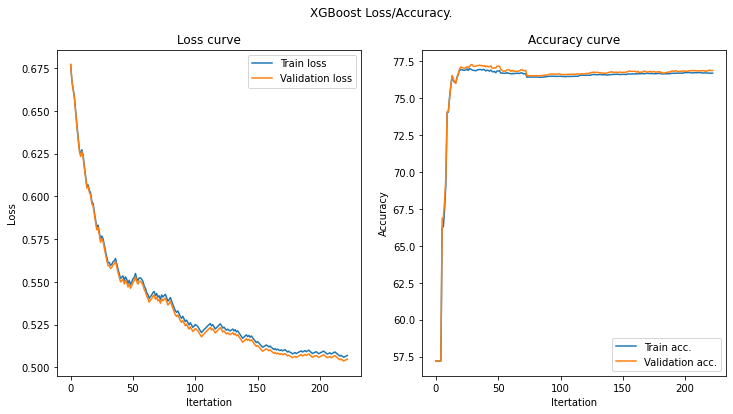

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.473748524153981
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ig

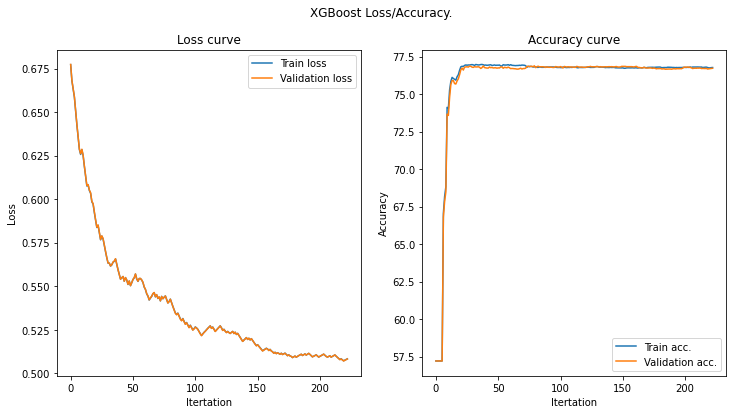

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.473748524153981
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ig

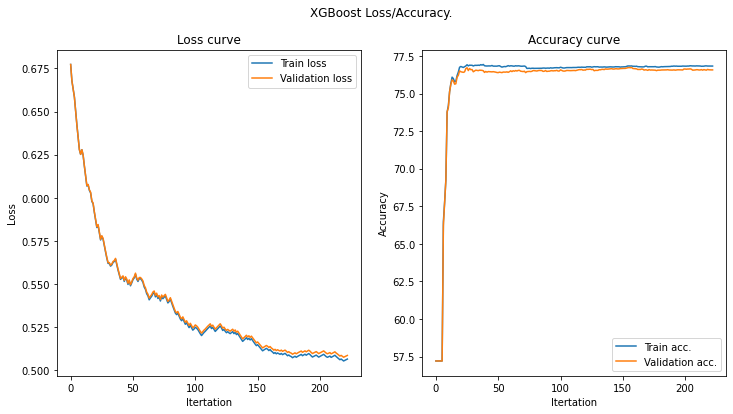

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.473748524153981
[LightGBM] [Warning] bagging_fraction is set=0.09581893275551585, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09581893275551585
[LightGBM] [Warning] bagging_freq is set=3831, subsample_freq=0 will be ignored. Current value: bagging_freq=3831
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.473748524153981, colsample_bytree=1.0 will be ig

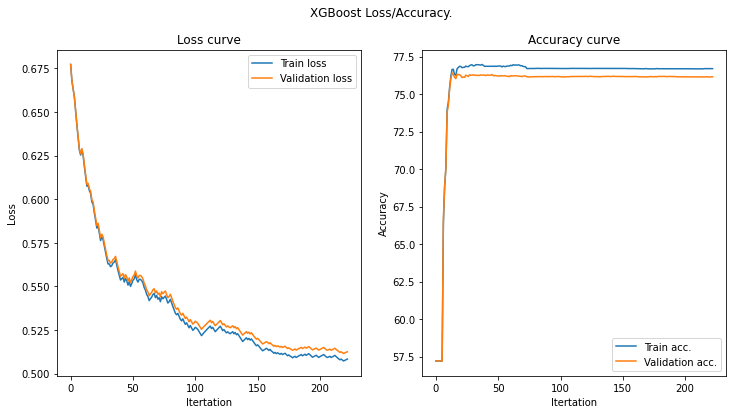

[I 2021-04-13 19:33:00,815] Trial 1 finished with value: 0.76615 and parameters: {'boosting': 'dart', 'n_estimators': 13521, 'learning_rate': 0.030328278807821712, 'max_depth': 33, 'num_leaves': 107, 'reg_alpha': 1.3764634194722325, 'reg_lambda': 5.72645726569465, 'feature_fraction': 0.473748524153981, 'min_child_samples': 104, 'bagging_freq': 3831, 'bagging_fraction': 0.09581893275551585, 'max_bin': 641}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.76615
--------------------> Trial 2 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.34572906020976113
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] 

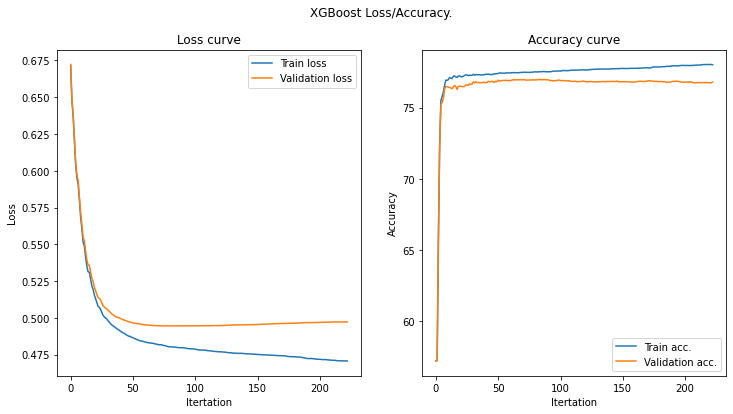

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.34572906020976113
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be 

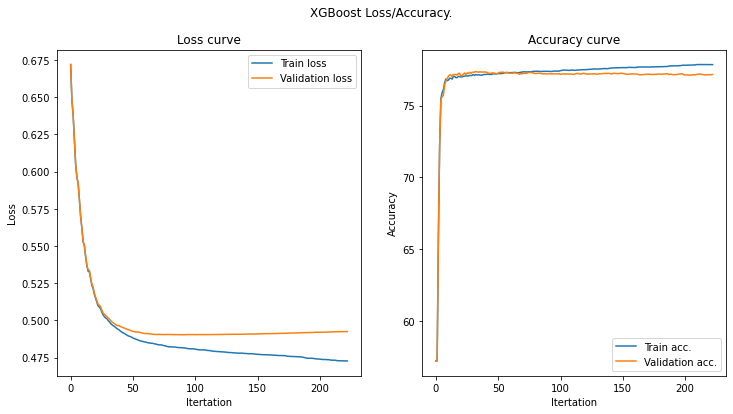

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.34572906020976113
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be 

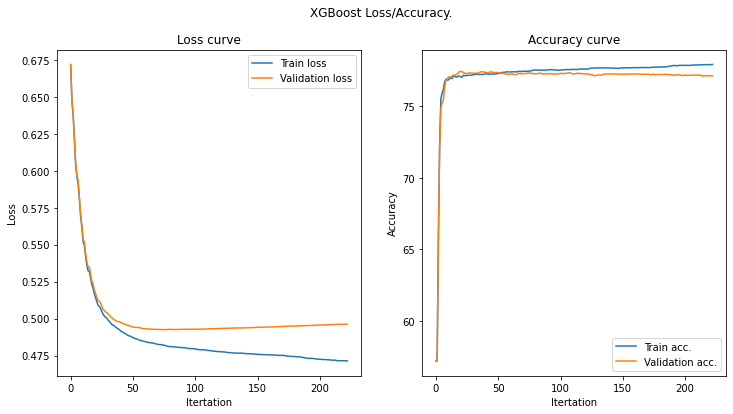

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.34572906020976113
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be 

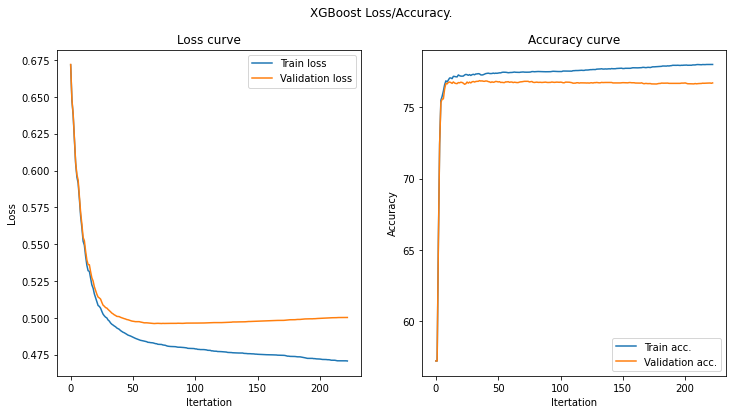

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.34572906020976113
[LightGBM] [Warning] bagging_fraction is set=0.7548401681900301, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7548401681900301
[LightGBM] [Warning] bagging_freq is set=2694, subsample_freq=0 will be ignored. Current value: bagging_freq=2694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.34572906020976113, colsample_bytree=1.0 will be 

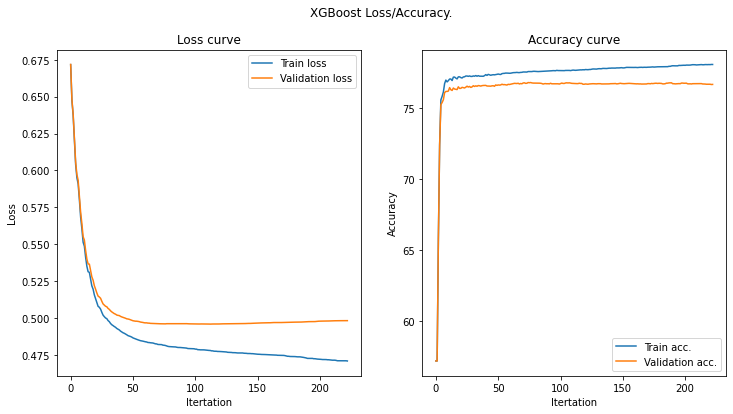

[I 2021-04-13 19:33:17,799] Trial 2 finished with value: 0.769325 and parameters: {'boosting': 'gbdt', 'n_estimators': 15380, 'learning_rate': 0.08690595243816664, 'max_depth': 45, 'num_leaves': 107, 'reg_alpha': 2.1411224591892246, 'reg_lambda': 0.5307911512078923, 'feature_fraction': 0.34572906020976113, 'min_child_samples': 112, 'bagging_freq': 2694, 'bagging_fraction': 0.7548401681900301, 'max_bin': 880}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769325
--------------------> Trial 3 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8272250703680082
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] f

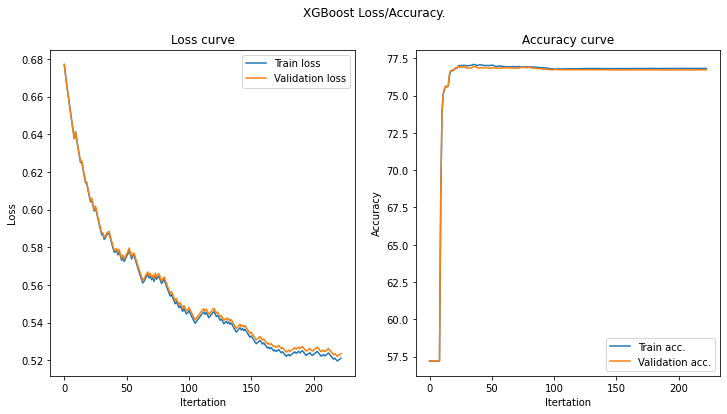

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8272250703680082
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ign

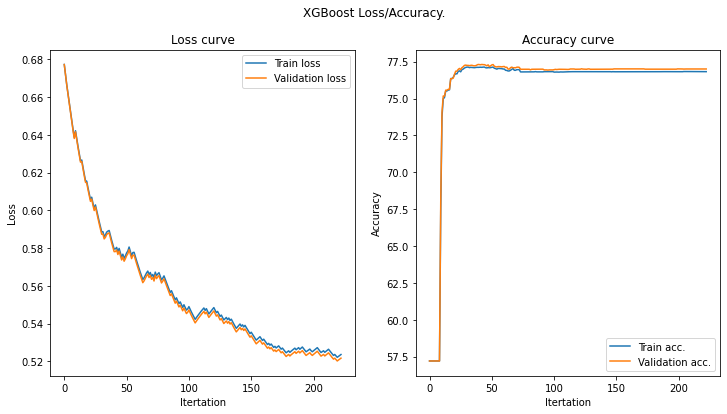

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8272250703680082
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ign

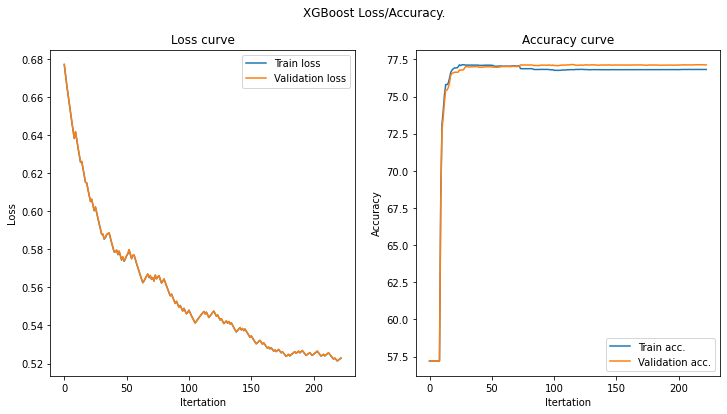

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8272250703680082
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ign

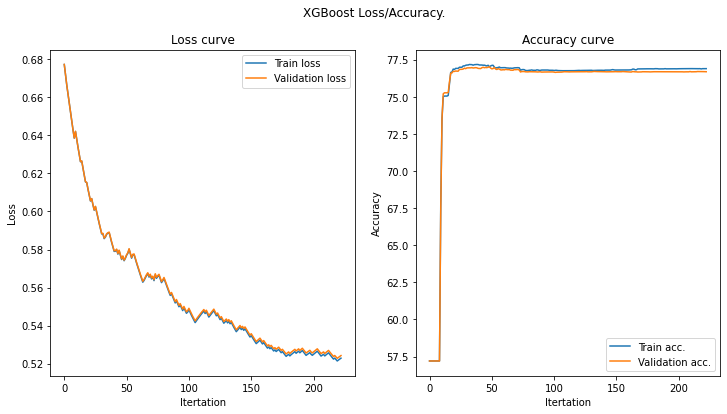

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8272250703680082
[LightGBM] [Warning] bagging_fraction is set=0.4952021952264059, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4952021952264059
[LightGBM] [Warning] bagging_freq is set=7777, subsample_freq=0 will be ignored. Current value: bagging_freq=7777
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.8272250703680082, colsample_bytree=1.0 will be ign

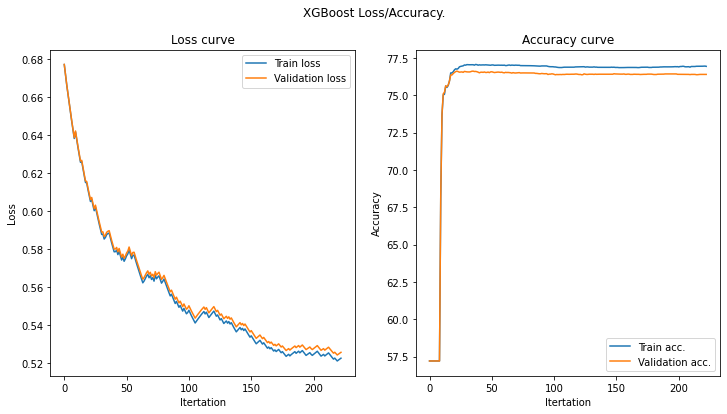

[I 2021-04-13 19:34:02,949] Trial 3 finished with value: 0.7683375 and parameters: {'boosting': 'dart', 'n_estimators': 19298, 'learning_rate': 0.016923461937842988, 'max_depth': 68, 'num_leaves': 77, 'reg_alpha': 9.309329723636944, 'reg_lambda': 4.318813148551106, 'feature_fraction': 0.8272250703680082, 'min_child_samples': 180, 'bagging_freq': 7777, 'bagging_fraction': 0.4952021952264059, 'max_bin': 850}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7683375
--------------------> Trial 4 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7523367811239019
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [W

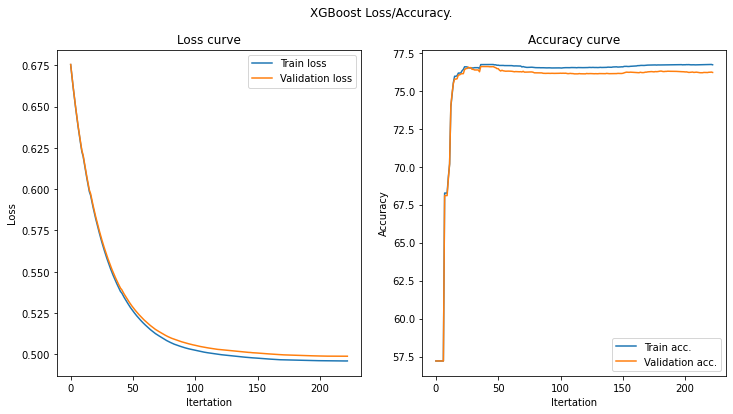

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7523367811239019
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 wil

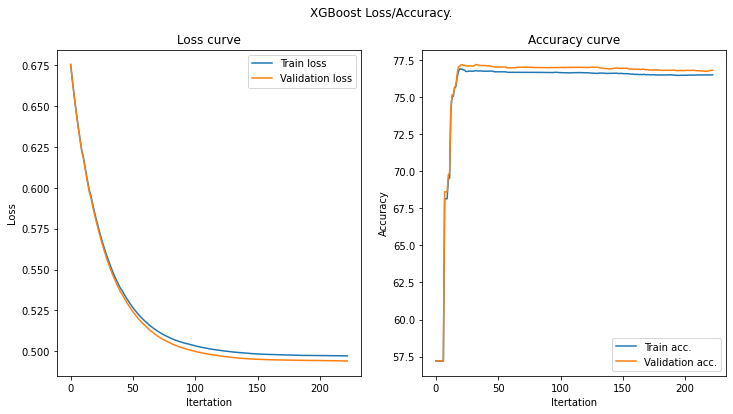

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7523367811239019
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 wil

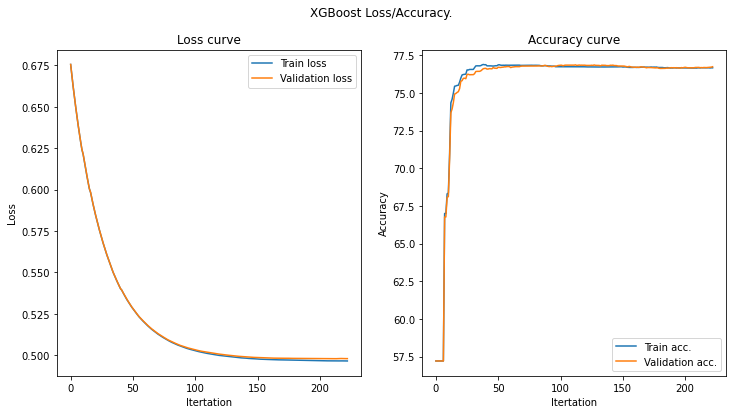

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7523367811239019
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 wil

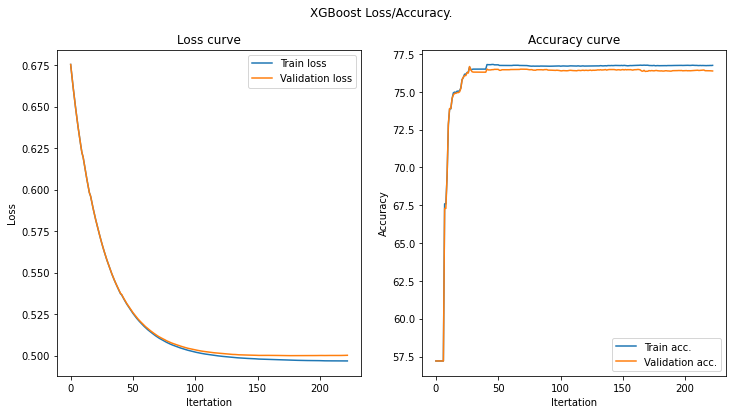

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7523367811239019
[LightGBM] [Warning] bagging_fraction is set=0.06975324383738161, subsample=1.0 will be ignored. Current value: bagging_fraction=0.06975324383738161
[LightGBM] [Warning] bagging_freq is set=14574, subsample_freq=0 will be ignored. Current value: bagging_freq=14574
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7523367811239019, colsample_bytree=1.0 wil

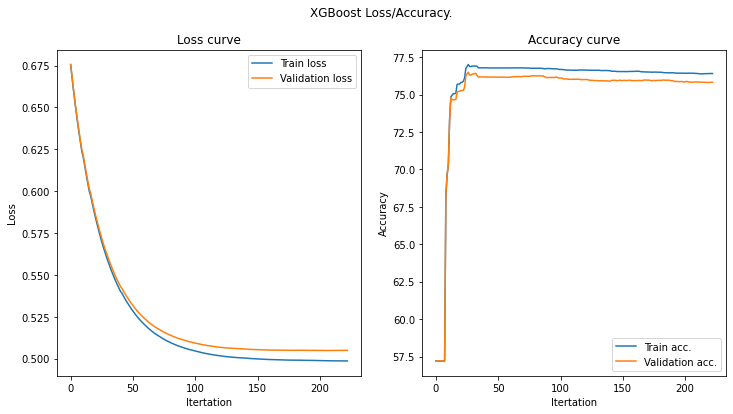

[I 2021-04-13 19:34:15,870] Trial 4 finished with value: 0.7647 and parameters: {'boosting': 'gbdt', 'n_estimators': 15162, 'learning_rate': 0.022370881820536783, 'max_depth': 65, 'num_leaves': 110, 'reg_alpha': 5.281923615806405, 'reg_lambda': 0.8404904911183266, 'feature_fraction': 0.7523367811239019, 'min_child_samples': 91, 'bagging_freq': 14574, 'bagging_fraction': 0.06975324383738161, 'max_bin': 628}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7647
--------------------> Trial 5 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7149758204651366
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] fea

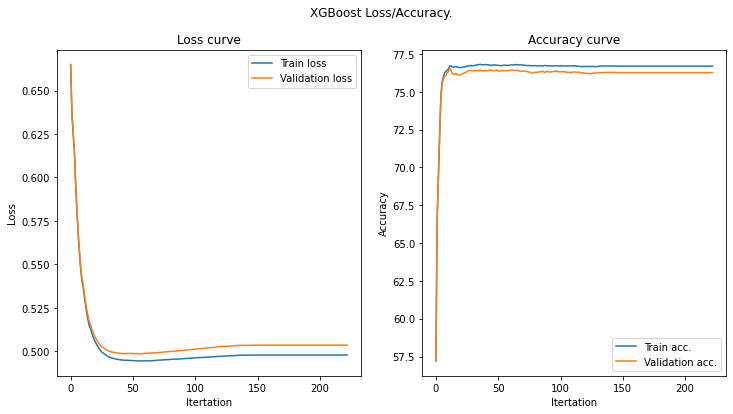

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7149758204651366
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ign

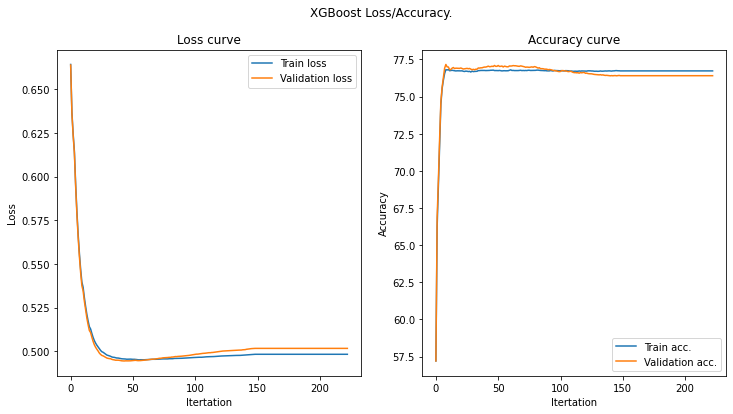

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7149758204651366
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ign

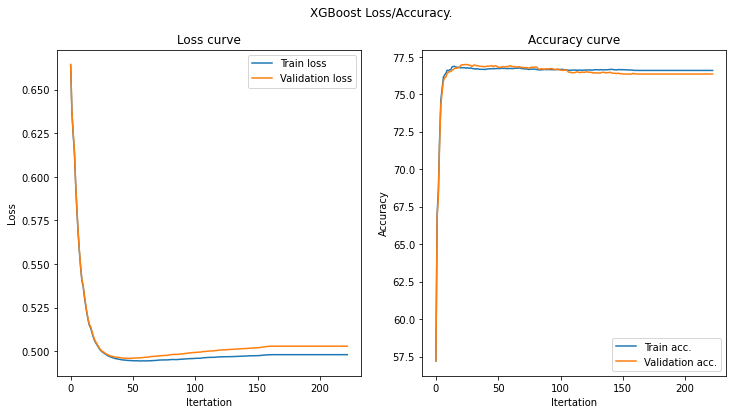

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7149758204651366
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ign

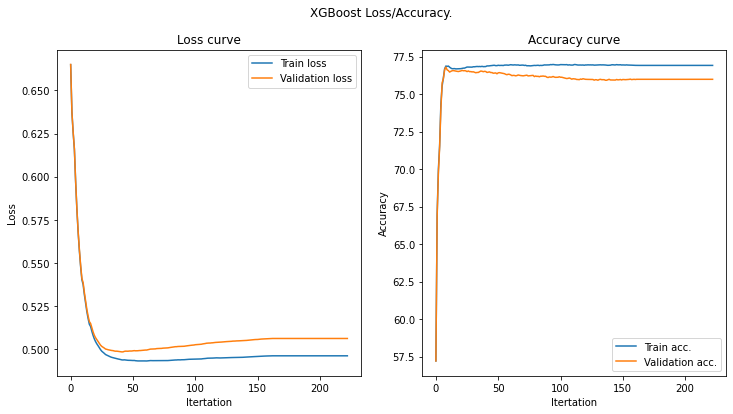

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7149758204651366
[LightGBM] [Warning] bagging_fraction is set=0.09934432390018781, subsample=1.0 will be ignored. Current value: bagging_fraction=0.09934432390018781
[LightGBM] [Warning] bagging_freq is set=472, subsample_freq=0 will be ignored. Current value: bagging_freq=472
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7149758204651366, colsample_bytree=1.0 will be ign

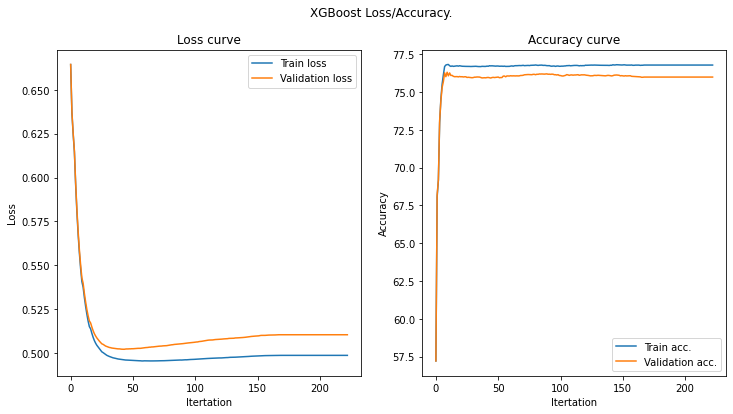

[I 2021-04-13 19:34:29,914] Trial 5 finished with value: 0.7626375 and parameters: {'boosting': 'gbdt', 'n_estimators': 14099, 'learning_rate': 0.09743897128648743, 'max_depth': 124, 'num_leaves': 128, 'reg_alpha': 4.701656295070059, 'reg_lambda': 5.442292453548388, 'feature_fraction': 0.7149758204651366, 'min_child_samples': 48, 'bagging_freq': 472, 'bagging_fraction': 0.09934432390018781, 'max_bin': 888}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7626375
--------------------> Trial 6 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35063627985507373
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fracti

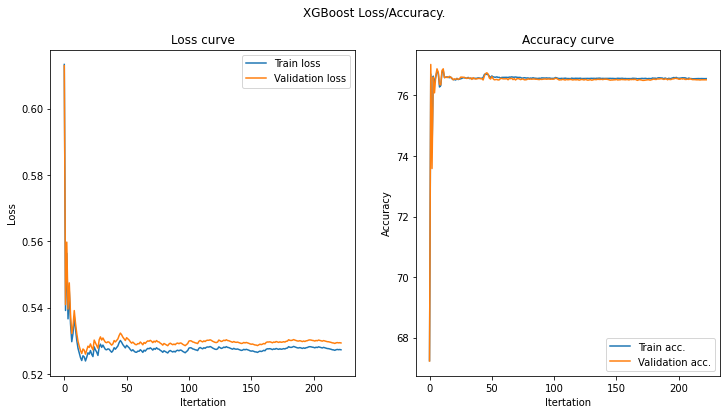

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35063627985507373
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current

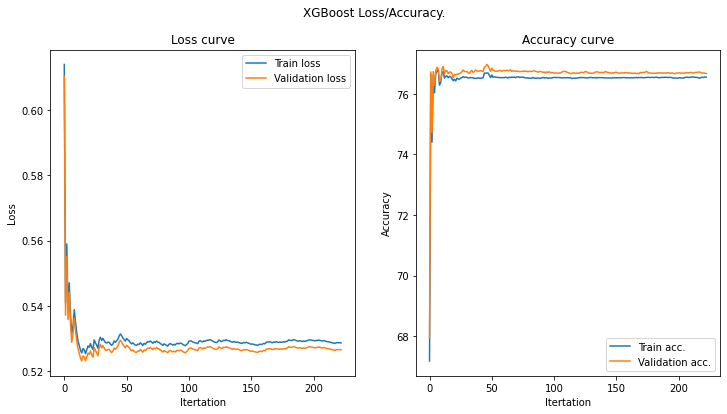

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35063627985507373
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current

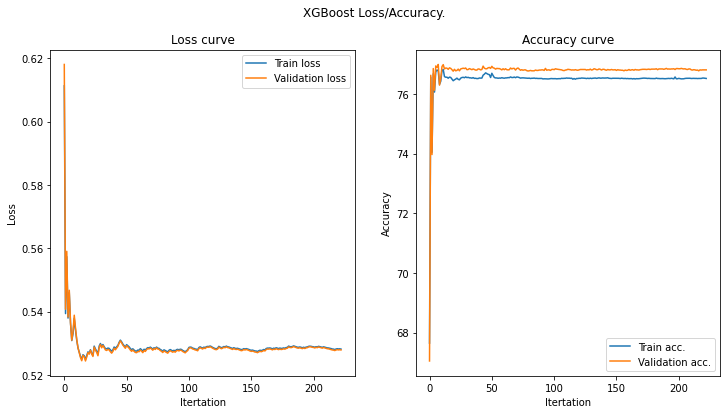

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35063627985507373
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current

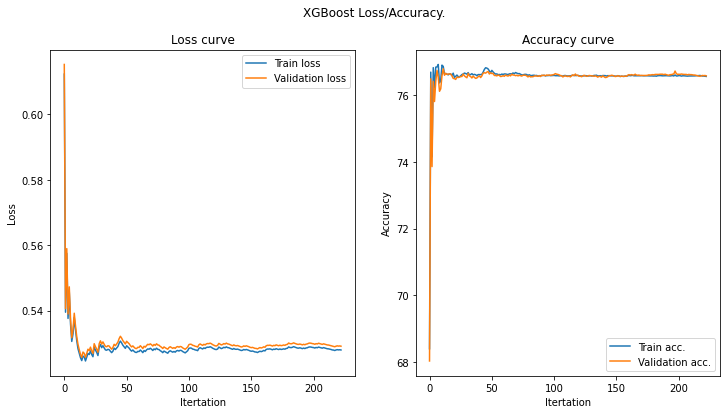

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.35063627985507373
[LightGBM] [Warning] bagging_fraction is set=0.879749163069263, subsample=1.0 will be ignored. Current value: bagging_fraction=0.879749163069263
[LightGBM] [Warning] bagging_freq is set=905, subsample_freq=0 will be ignored. Current value: bagging_freq=905
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.35063627985507373, colsample_bytree=1.0 will be ignored. Current

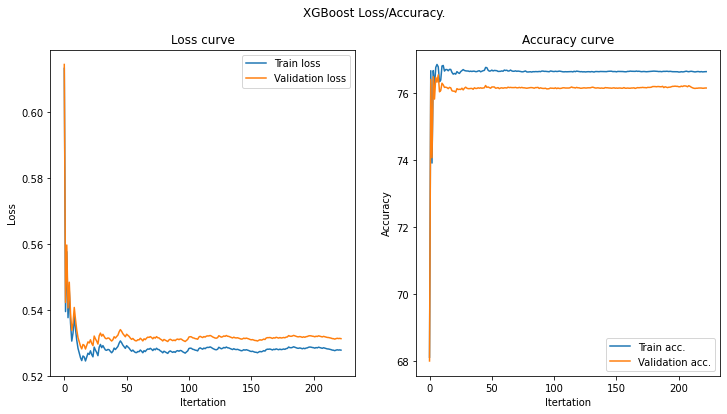

[I 2021-04-13 19:34:43,525] Trial 6 finished with value: 0.7655375 and parameters: {'boosting': 'rf', 'n_estimators': 6008, 'learning_rate': 0.08501215340953973, 'max_depth': 109, 'num_leaves': 54, 'reg_alpha': 9.185348894571318, 'reg_lambda': 7.373177792018238, 'feature_fraction': 0.35063627985507373, 'min_child_samples': 189, 'bagging_freq': 905, 'bagging_fraction': 0.879749163069263, 'max_bin': 821}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7655375
--------------------> Trial 7 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4908002248876014
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] 

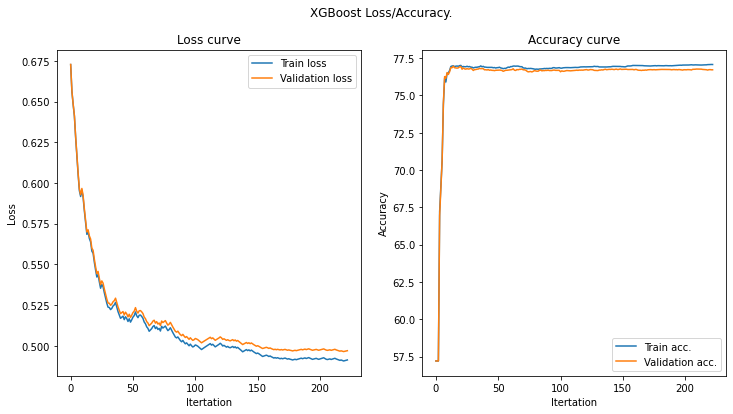

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4908002248876014
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ign

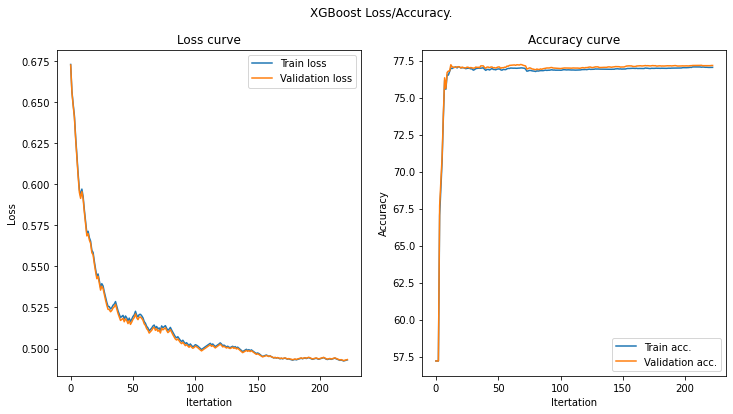

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4908002248876014
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ign

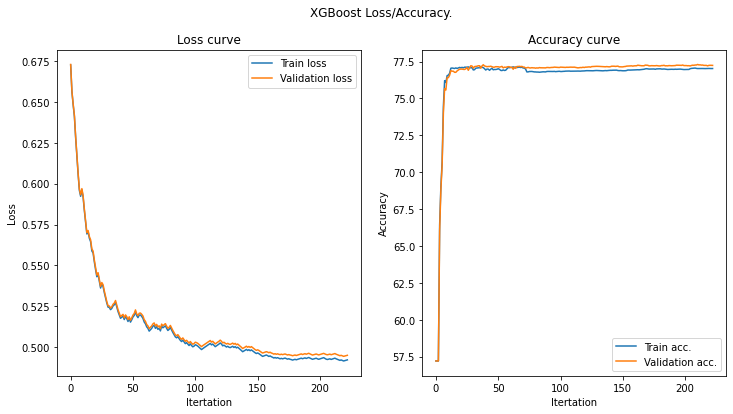

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4908002248876014
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ign

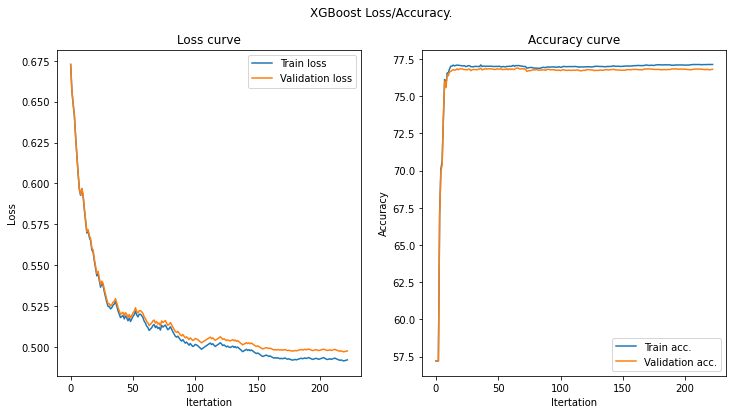

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4908002248876014
[LightGBM] [Warning] bagging_fraction is set=0.5867776833410733, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5867776833410733
[LightGBM] [Warning] bagging_freq is set=7285, subsample_freq=0 will be ignored. Current value: bagging_freq=7285
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4908002248876014, colsample_bytree=1.0 will be ign

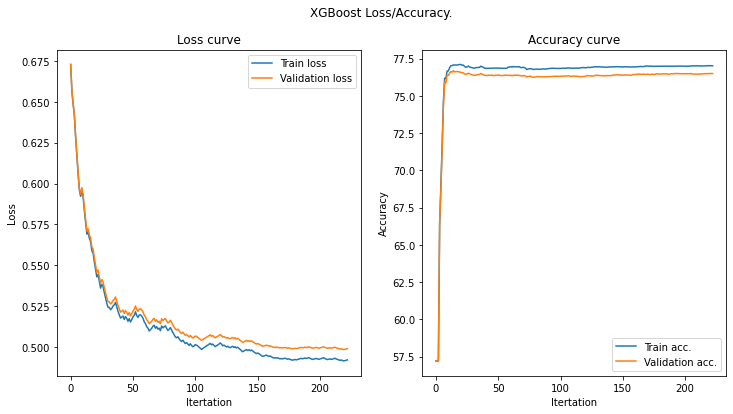

[I 2021-04-13 19:35:30,955] Trial 7 finished with value: 0.7686125 and parameters: {'boosting': 'dart', 'n_estimators': 1800, 'learning_rate': 0.05328363731896932, 'max_depth': 114, 'num_leaves': 120, 'reg_alpha': 8.919782735935032, 'reg_lambda': 6.8562089465528775, 'feature_fraction': 0.4908002248876014, 'min_child_samples': 24, 'bagging_freq': 7285, 'bagging_fraction': 0.5867776833410733, 'max_bin': 652}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7686125
--------------------> Trial 8 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40619777709900995
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning

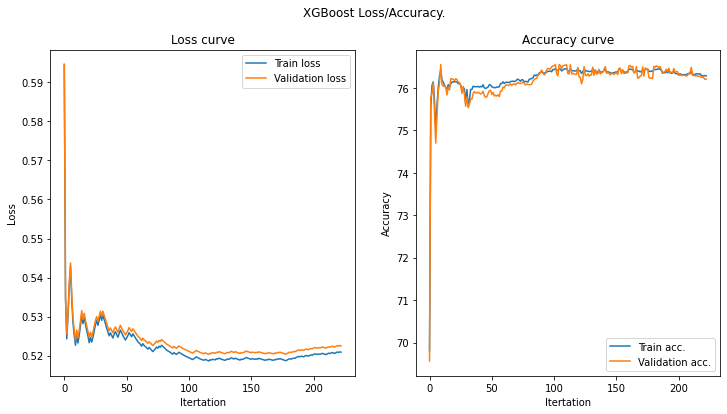

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40619777709900995
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be 

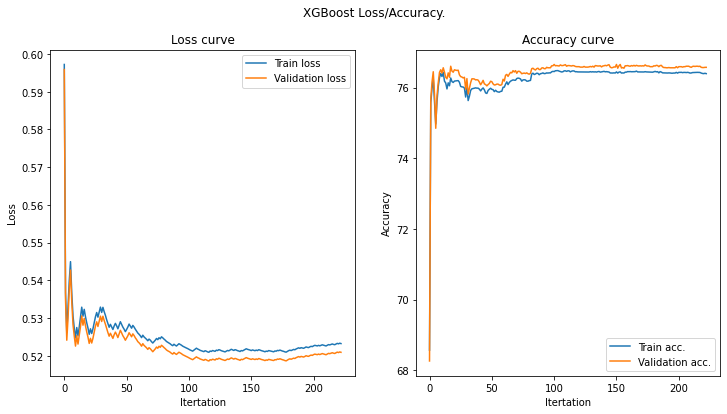

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40619777709900995
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be 

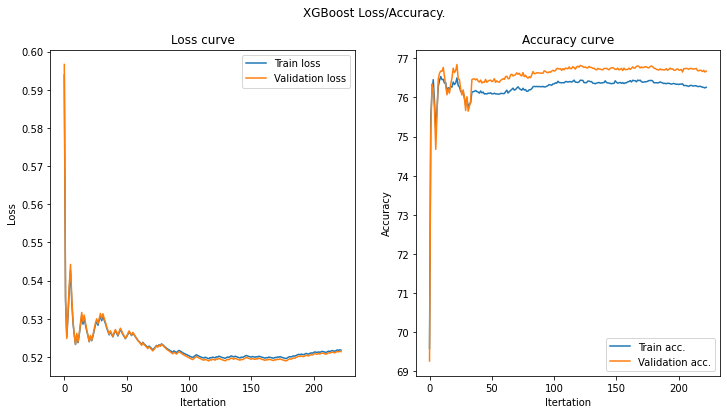

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40619777709900995
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be 

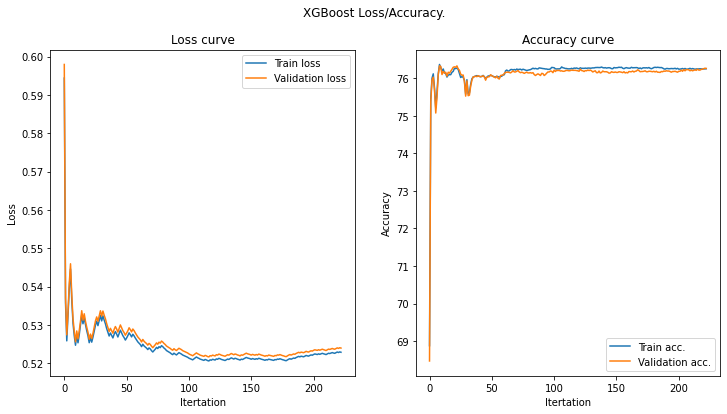

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.40619777709900995
[LightGBM] [Warning] bagging_fraction is set=0.17816251234908986, subsample=1.0 will be ignored. Current value: bagging_fraction=0.17816251234908986
[LightGBM] [Warning] bagging_freq is set=11674, subsample_freq=0 will be ignored. Current value: bagging_freq=11674
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.40619777709900995, colsample_bytree=1.0 will be 

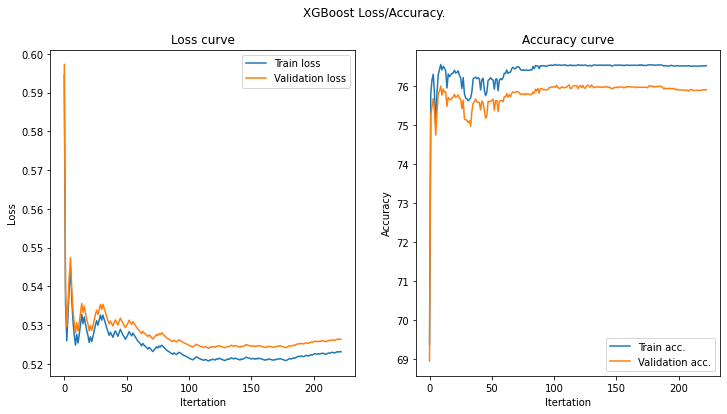

[I 2021-04-13 19:35:43,459] Trial 8 finished with value: 0.7633 and parameters: {'boosting': 'rf', 'n_estimators': 8674, 'learning_rate': 0.0693641116596597, 'max_depth': 25, 'num_leaves': 78, 'reg_alpha': 6.757549505427567, 'reg_lambda': 2.4732088533565313, 'feature_fraction': 0.40619777709900995, 'min_child_samples': 49, 'bagging_freq': 11674, 'bagging_fraction': 0.17816251234908986, 'max_bin': 574}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7633
--------------------> Trial 9 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4544722078679614
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning]

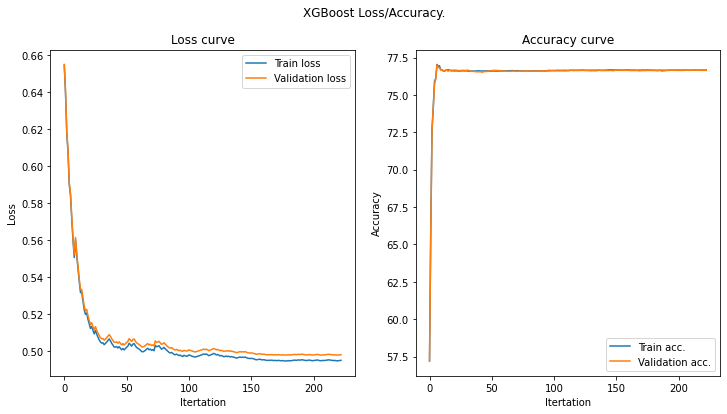

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4544722078679614
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be

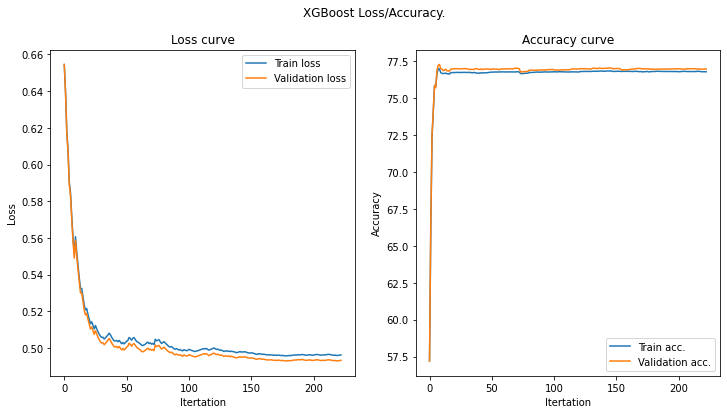

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4544722078679614
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be

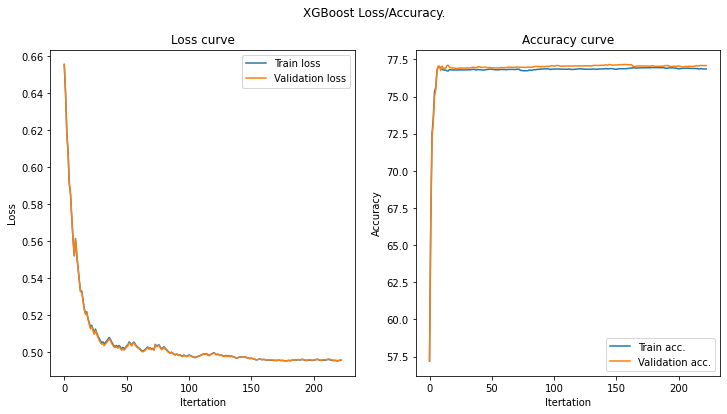

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4544722078679614
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be

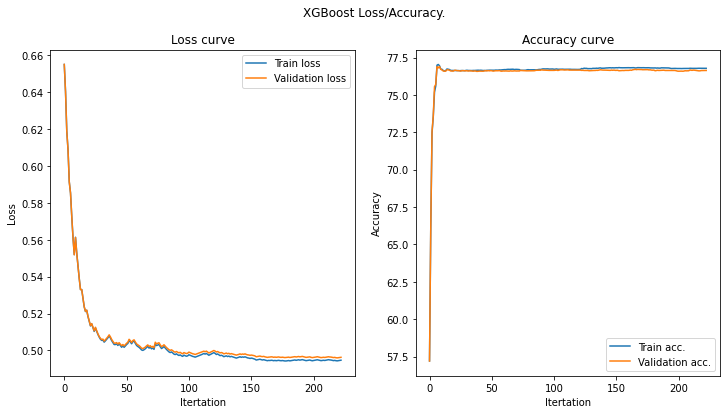

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4544722078679614
[LightGBM] [Warning] bagging_fraction is set=0.1642281954376941, subsample=1.0 will be ignored. Current value: bagging_fraction=0.1642281954376941
[LightGBM] [Warning] bagging_freq is set=14634, subsample_freq=0 will be ignored. Current value: bagging_freq=14634
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4544722078679614, colsample_bytree=1.0 will be

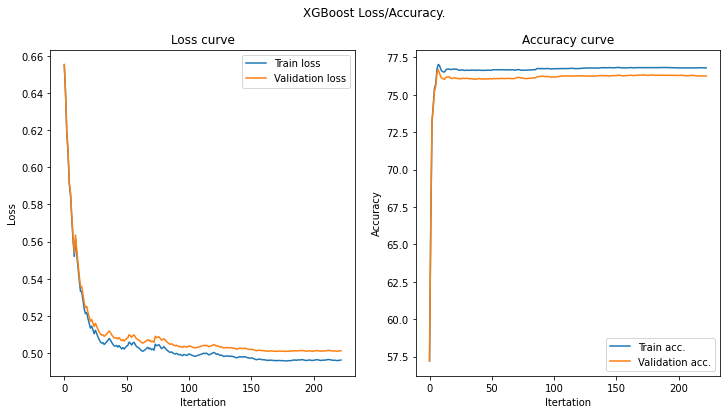

[I 2021-04-13 19:36:15,623] Trial 9 finished with value: 0.767125 and parameters: {'boosting': 'dart', 'n_estimators': 13042, 'learning_rate': 0.09865031049327284, 'max_depth': 38, 'num_leaves': 52, 'reg_alpha': 9.405605888056364, 'reg_lambda': 5.072725696399601, 'feature_fraction': 0.4544722078679614, 'min_child_samples': 291, 'bagging_freq': 14634, 'bagging_fraction': 0.1642281954376941, 'max_bin': 936}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.767125
--------------------> Trial 10 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6721906376061957
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] 

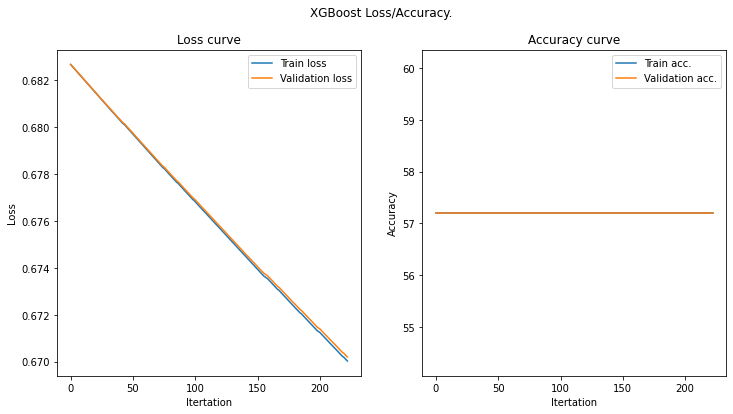

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6721906376061957
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ign

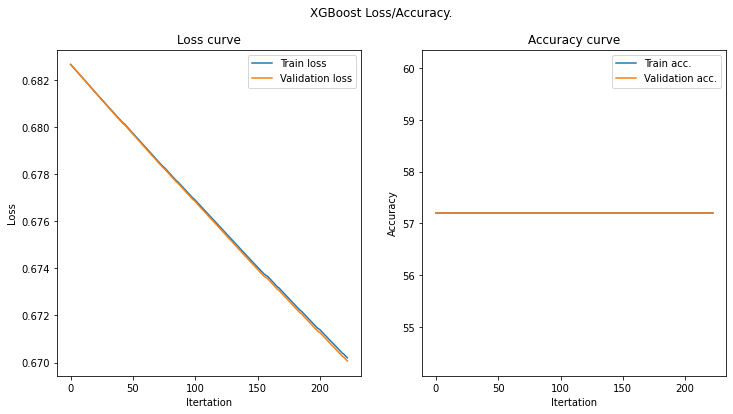

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6721906376061957
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ign

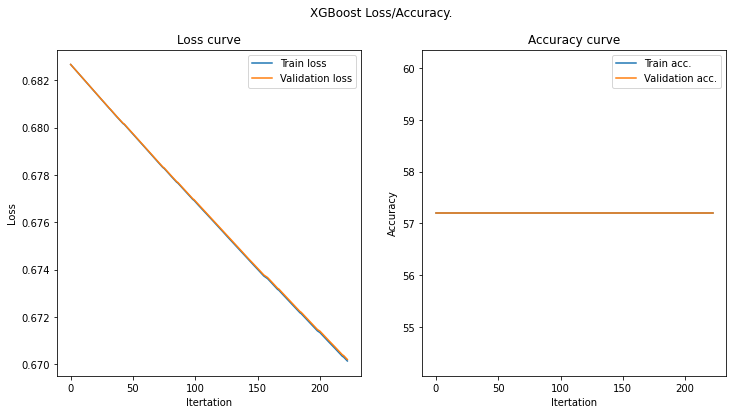

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6721906376061957
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ign

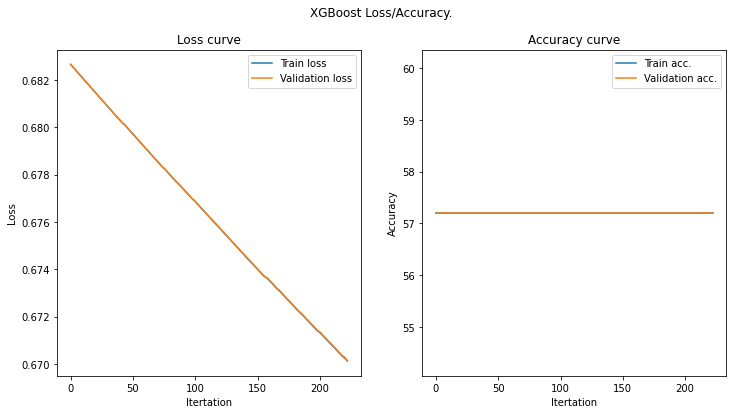

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6721906376061957
[LightGBM] [Warning] bagging_fraction is set=0.7036165807655178, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7036165807655178
[LightGBM] [Warning] bagging_freq is set=5336, subsample_freq=0 will be ignored. Current value: bagging_freq=5336
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6721906376061957, colsample_bytree=1.0 will be ign

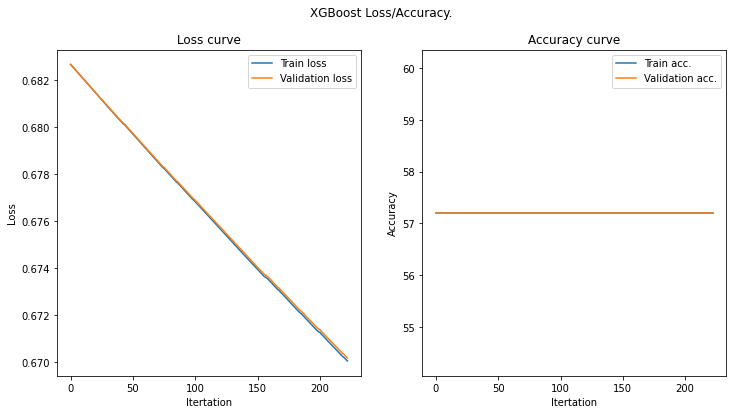

[I 2021-04-13 19:36:30,173] Trial 10 finished with value: 0.5720625 and parameters: {'boosting': 'gbdt', 'n_estimators': 2335, 'learning_rate': 0.00017889417443932298, 'max_depth': 8, 'num_leaves': 90, 'reg_alpha': 0.03589697016708904, 'reg_lambda': 9.758431242922006, 'feature_fraction': 0.6721906376061957, 'min_child_samples': 277, 'bagging_freq': 5336, 'bagging_fraction': 0.7036165807655178, 'max_bin': 183}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.5720625
--------------------> Trial 11 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2697241955387624
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

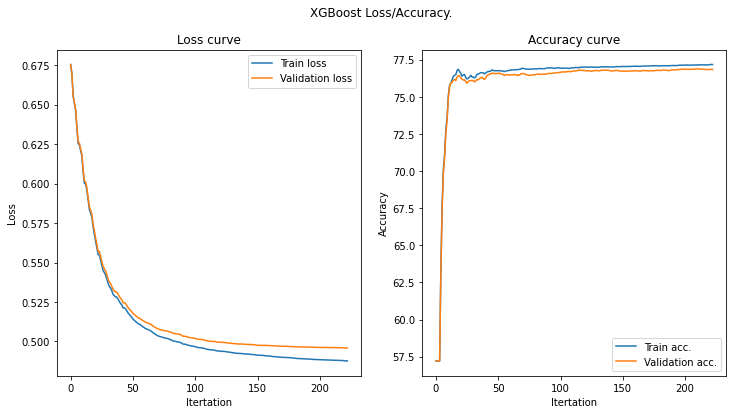

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2697241955387624
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ign

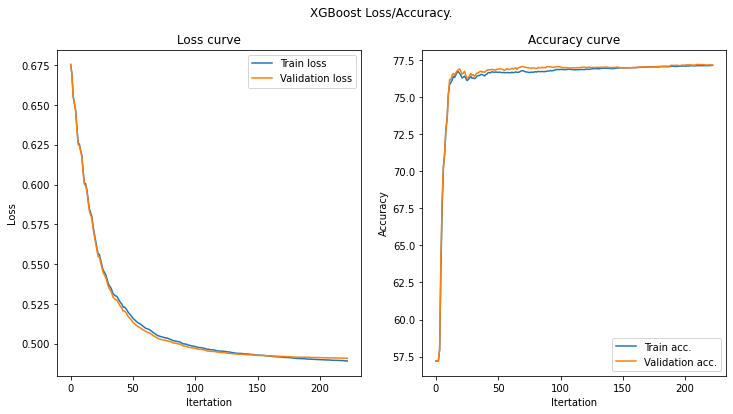

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2697241955387624
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ign

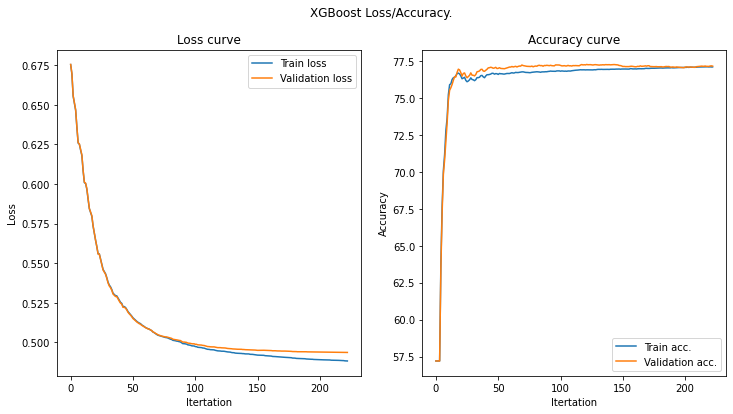

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2697241955387624
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ign

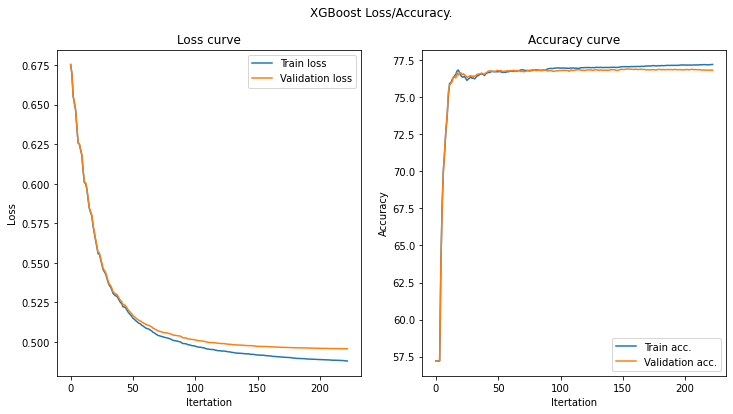

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2697241955387624
[LightGBM] [Warning] bagging_fraction is set=0.8756021332728825, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8756021332728825
[LightGBM] [Warning] bagging_freq is set=2777, subsample_freq=0 will be ignored. Current value: bagging_freq=2777
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.2697241955387624, colsample_bytree=1.0 will be ign

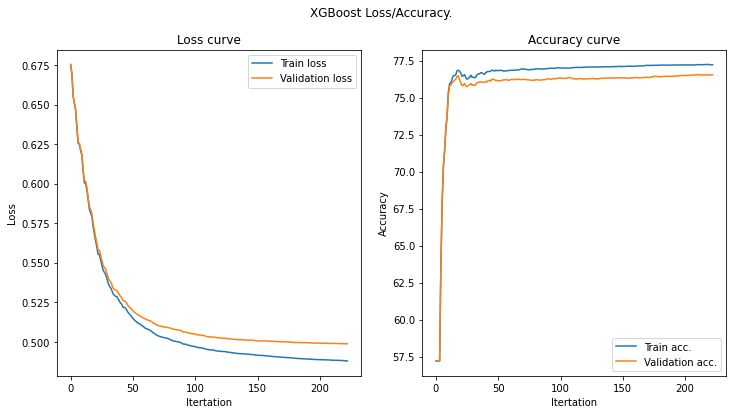

[I 2021-04-13 19:36:45,199] Trial 11 finished with value: 0.76825 and parameters: {'boosting': 'gbdt', 'n_estimators': 18659, 'learning_rate': 0.05123549541342412, 'max_depth': 63, 'num_leaves': 97, 'reg_alpha': 2.5790988004874005, 'reg_lambda': 0.16856320860764118, 'feature_fraction': 0.2697241955387624, 'min_child_samples': 253, 'bagging_freq': 2777, 'bagging_fraction': 0.8756021332728825, 'max_bin': 324}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.76825
--------------------> Trial 12 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6194425101781016
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] featu

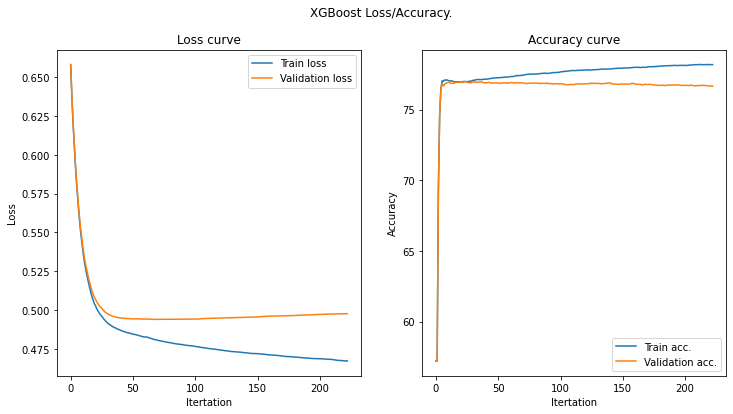

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6194425101781016
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored

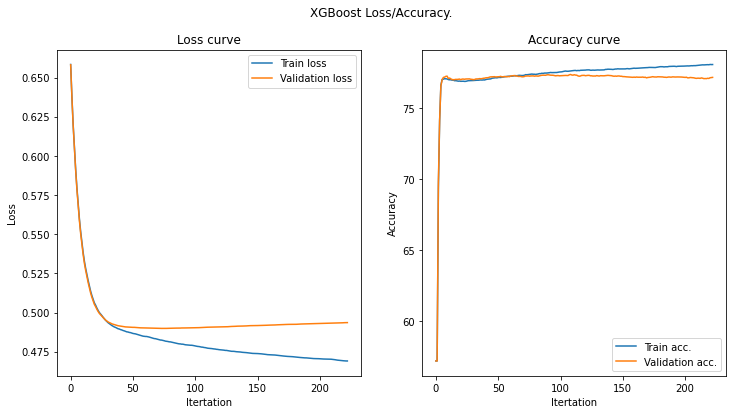

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6194425101781016
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored

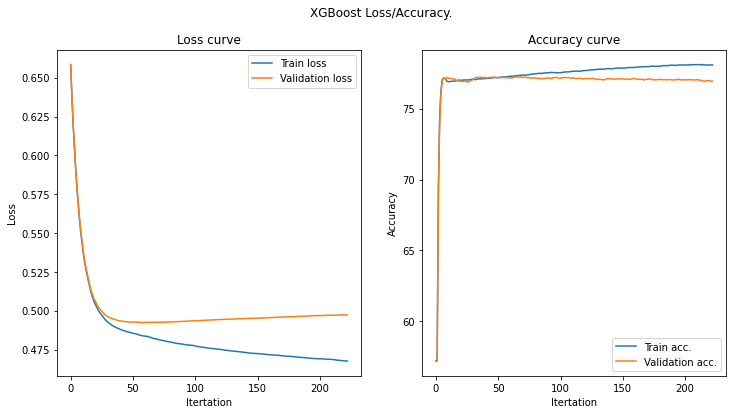

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6194425101781016
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored

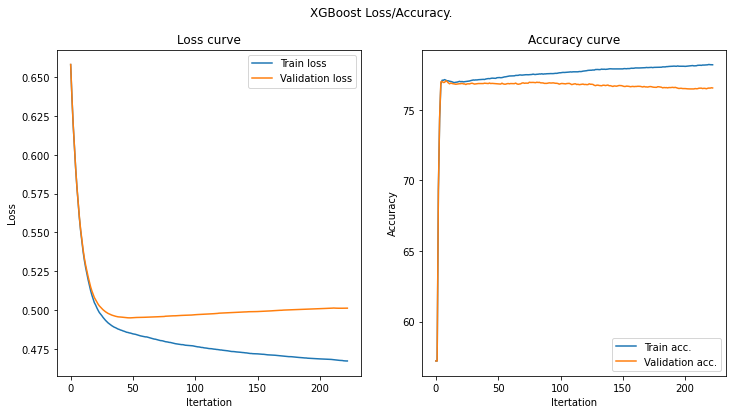

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6194425101781016
[LightGBM] [Warning] bagging_fraction is set=0.7369959439688548, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7369959439688548
[LightGBM] [Warning] bagging_freq is set=212, subsample_freq=0 will be ignored. Current value: bagging_freq=212
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6194425101781016, colsample_bytree=1.0 will be ignored

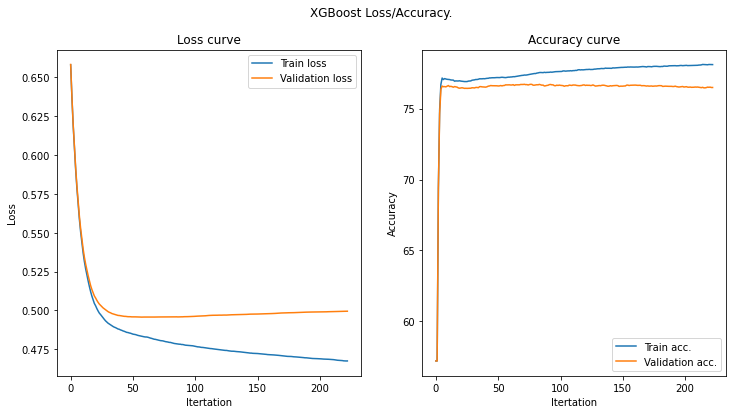

[I 2021-04-13 19:37:06,121] Trial 12 finished with value: 0.7694125 and parameters: {'boosting': 'gbdt', 'n_estimators': 9469, 'learning_rate': 0.07572397279437663, 'max_depth': 87, 'num_leaves': 118, 'reg_alpha': 3.1605085528525967, 'reg_lambda': 2.907533432664779, 'feature_fraction': 0.6194425101781016, 'min_child_samples': 210, 'bagging_freq': 212, 'bagging_fraction': 0.7369959439688548, 'max_bin': 424}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7694125
--------------------> Trial 13 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6083446116035548
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature

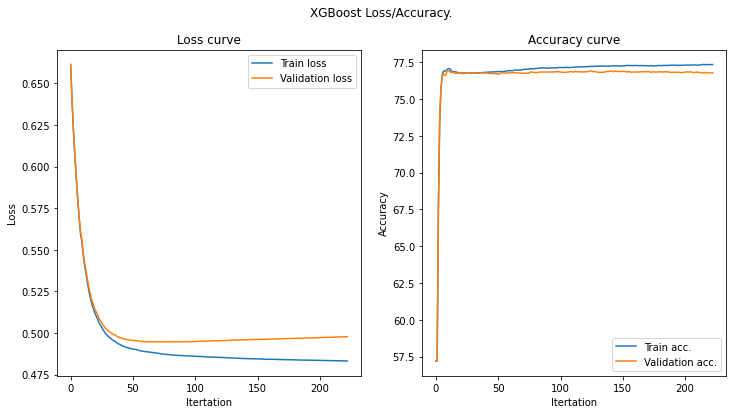

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6083446116035548
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Cu

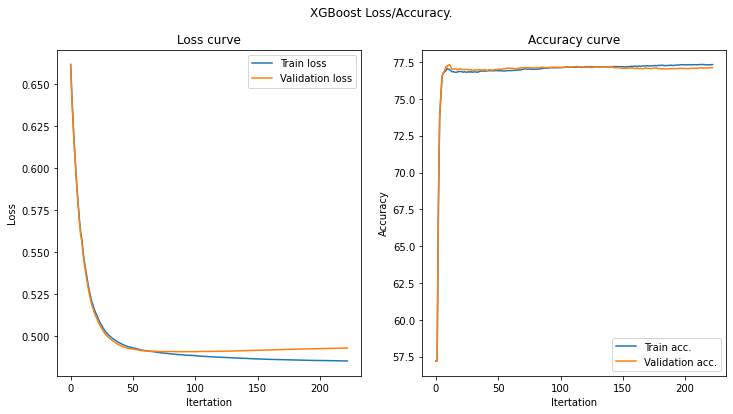

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6083446116035548
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Cu

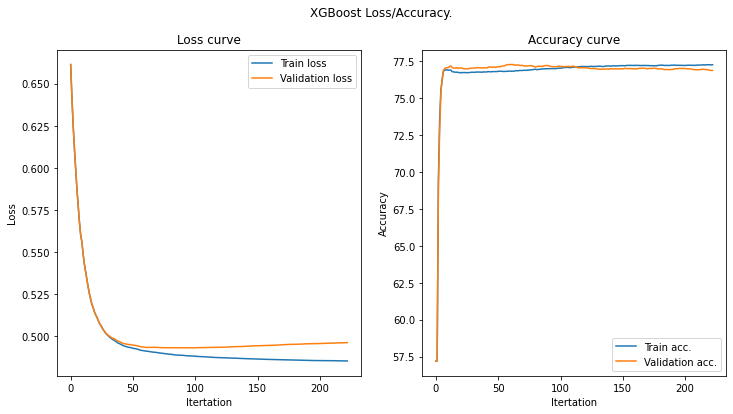

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6083446116035548
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Cu

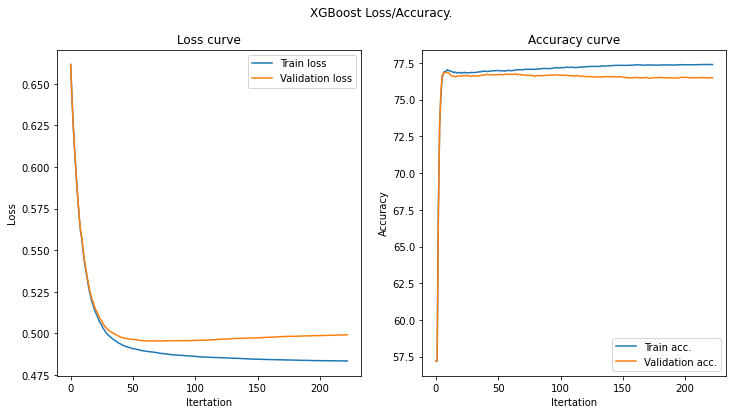

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6083446116035548
[LightGBM] [Warning] bagging_fraction is set=0.386247504048738, subsample=1.0 will be ignored. Current value: bagging_fraction=0.386247504048738
[LightGBM] [Warning] bagging_freq is set=565, subsample_freq=0 will be ignored. Current value: bagging_freq=565
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6083446116035548, colsample_bytree=1.0 will be ignored. Cu

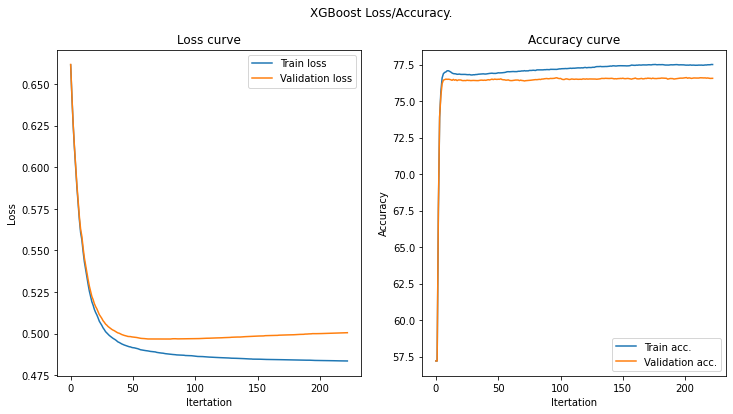

[I 2021-04-13 19:37:23,845] Trial 13 finished with value: 0.7682875 and parameters: {'boosting': 'gbdt', 'n_estimators': 8480, 'learning_rate': 0.06907284403537908, 'max_depth': 89, 'num_leaves': 128, 'reg_alpha': 3.509907725208838, 'reg_lambda': 3.4318095990285338, 'feature_fraction': 0.6083446116035548, 'min_child_samples': 213, 'bagging_freq': 565, 'bagging_fraction': 0.386247504048738, 'max_bin': 400}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7682875
--------------------> Trial 14 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8935943765158673
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

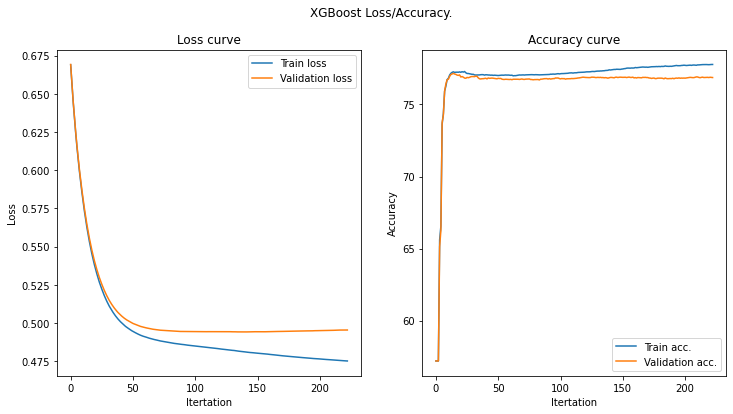

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8935943765158673
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ign

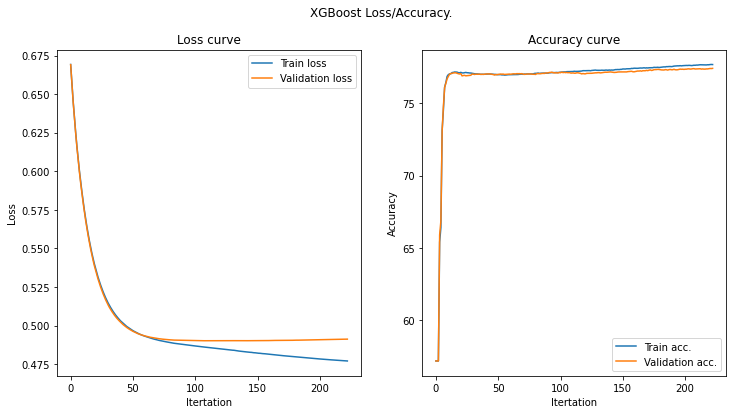

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8935943765158673
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ign

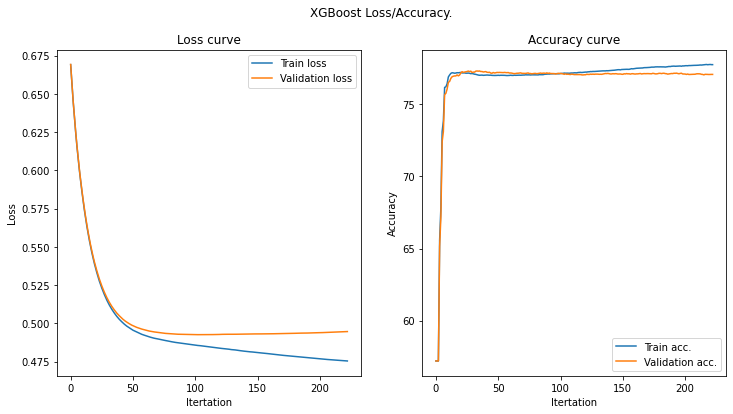

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8935943765158673
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ign

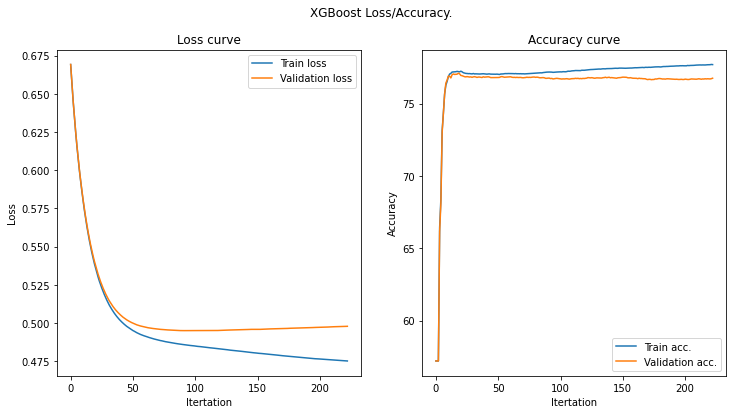

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8935943765158673
[LightGBM] [Warning] bagging_fraction is set=0.7256605062759593, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7256605062759593
[LightGBM] [Warning] bagging_freq is set=4835, subsample_freq=0 will be ignored. Current value: bagging_freq=4835
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8935943765158673, colsample_bytree=1.0 will be ign

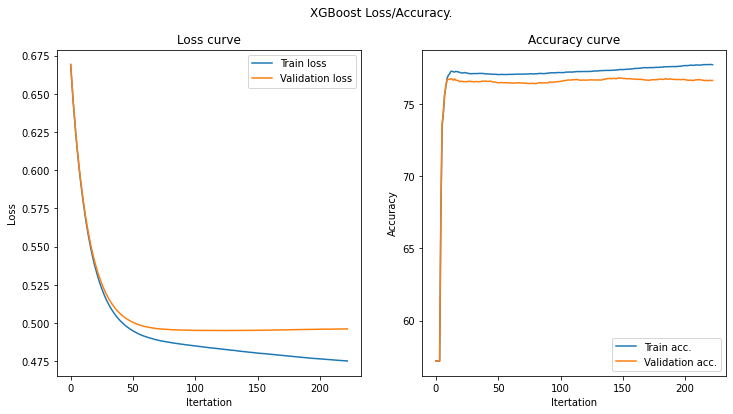

[I 2021-04-13 19:37:44,805] Trial 14 finished with value: 0.768925 and parameters: {'boosting': 'gbdt', 'n_estimators': 5222, 'learning_rate': 0.0397097080885955, 'max_depth': 89, 'num_leaves': 119, 'reg_alpha': 4.347047958224413, 'reg_lambda': 2.092194252559512, 'feature_fraction': 0.8935943765158673, 'min_child_samples': 239, 'bagging_freq': 4835, 'bagging_fraction': 0.7256605062759593, 'max_bin': 433}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.768925
--------------------> Trial 15 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.582517533698993
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] featur

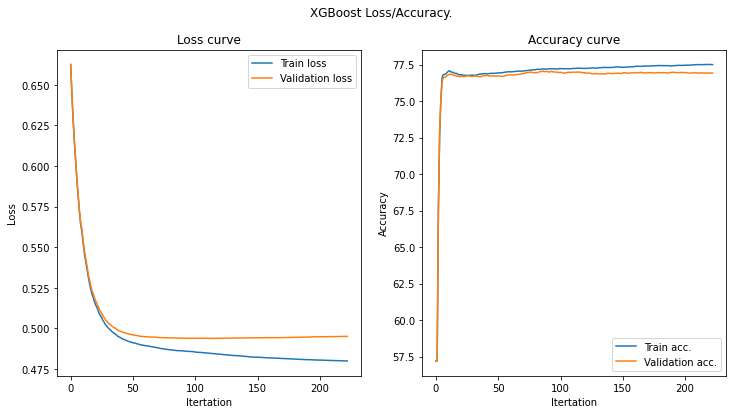

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.582517533698993
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. C

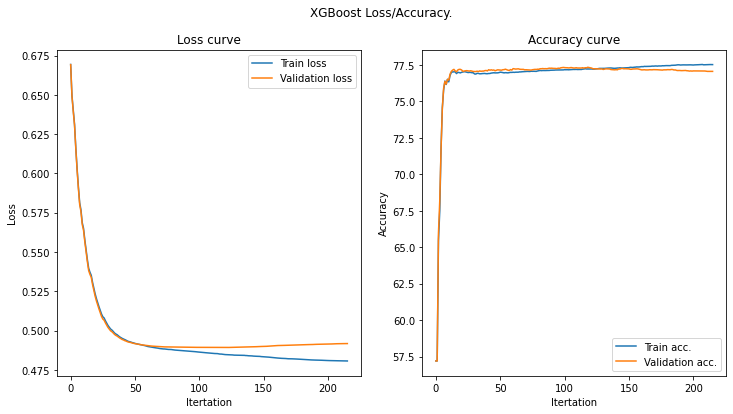

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.582517533698993
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. C

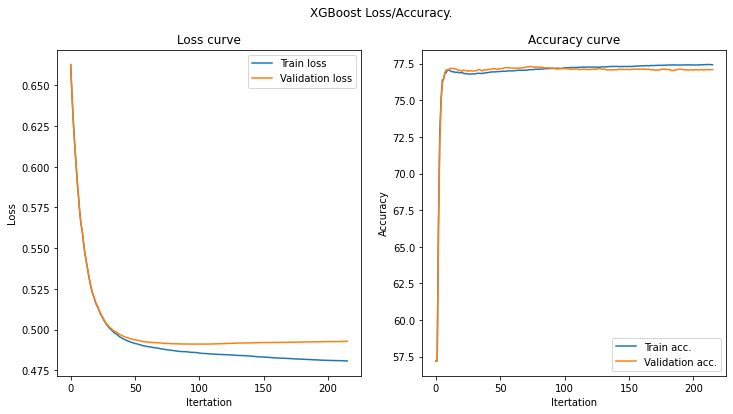

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.582517533698993
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. C

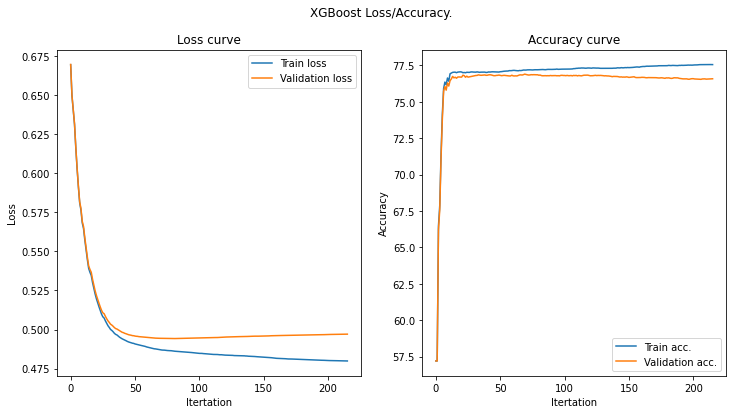

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.582517533698993
[LightGBM] [Warning] bagging_fraction is set=0.5933979659579041, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5933979659579041
[LightGBM] [Warning] bagging_freq is set=114, subsample_freq=0 will be ignored. Current value: bagging_freq=114
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.582517533698993, colsample_bytree=1.0 will be ignored. C

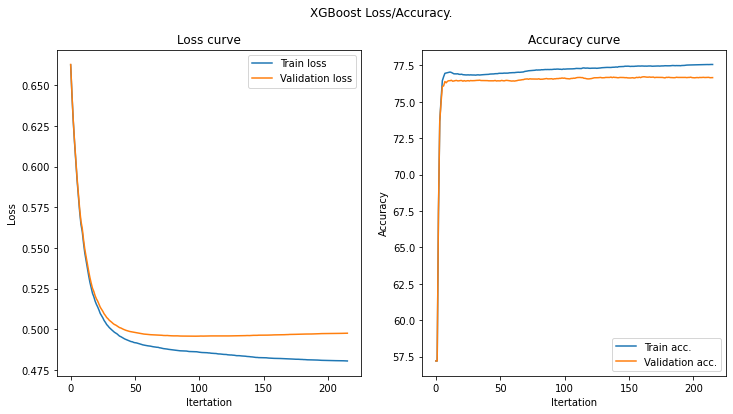

[I 2021-04-13 19:38:01,296] Trial 15 finished with value: 0.769525 and parameters: {'boosting': 'gbdt', 'n_estimators': 10828, 'learning_rate': 0.06507768453795013, 'max_depth': 87, 'num_leaves': 95, 'reg_alpha': 5.908576837225016, 'reg_lambda': 8.590274109157658, 'feature_fraction': 0.582517533698993, 'min_child_samples': 160, 'bagging_freq': 114, 'bagging_fraction': 0.5933979659579041, 'max_bin': 171}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769525
--------------------> Trial 16 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.585914843811777
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] featur

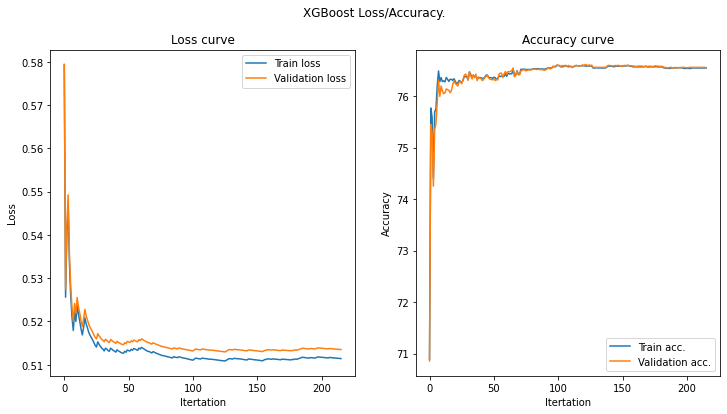

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.585914843811777
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. C

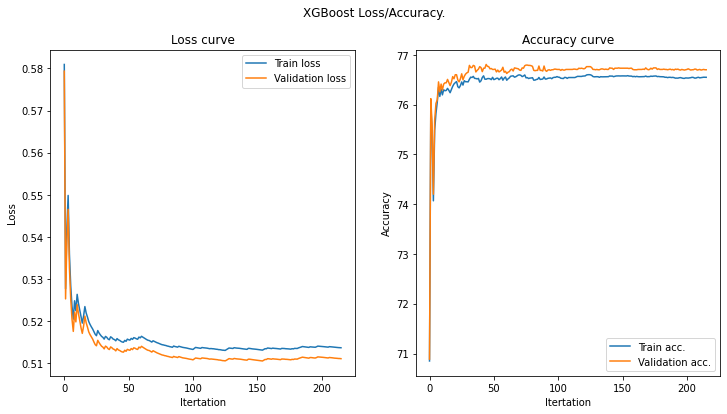

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.585914843811777
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. C

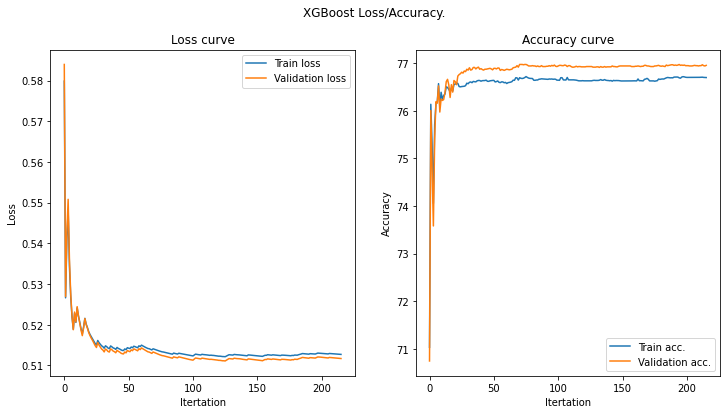

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.585914843811777
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. C

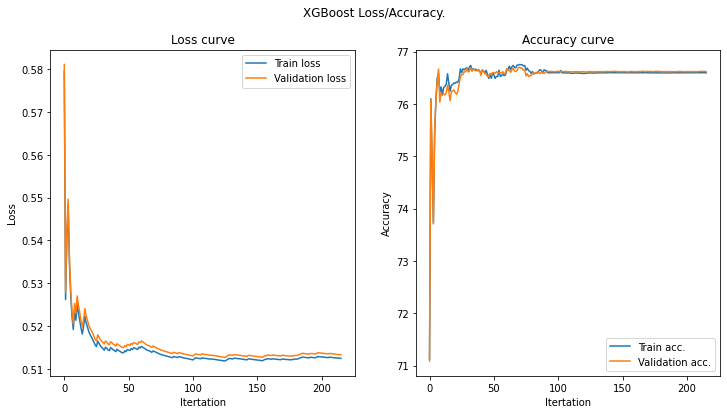

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.585914843811777
[LightGBM] [Warning] bagging_fraction is set=0.34655833108477885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.34655833108477885
[LightGBM] [Warning] bagging_freq is set=8304, subsample_freq=0 will be ignored. Current value: bagging_freq=8304
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.585914843811777, colsample_bytree=1.0 will be ignored. C

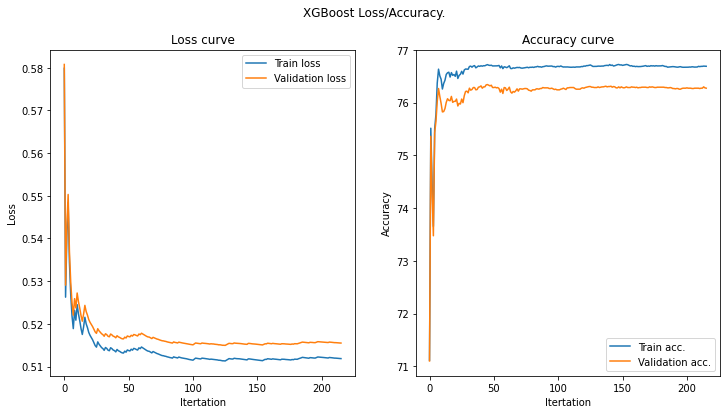

[I 2021-04-13 19:38:14,002] Trial 16 finished with value: 0.7661875 and parameters: {'boosting': 'rf', 'n_estimators': 11560, 'learning_rate': 0.05769271521081454, 'max_depth': 53, 'num_leaves': 66, 'reg_alpha': 7.019183292984245, 'reg_lambda': 9.837626943389946, 'feature_fraction': 0.585914843811777, 'min_child_samples': 140, 'bagging_freq': 8304, 'bagging_fraction': 0.34655833108477885, 'max_bin': 134}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7661875
--------------------> Trial 17 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5539249486176856
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

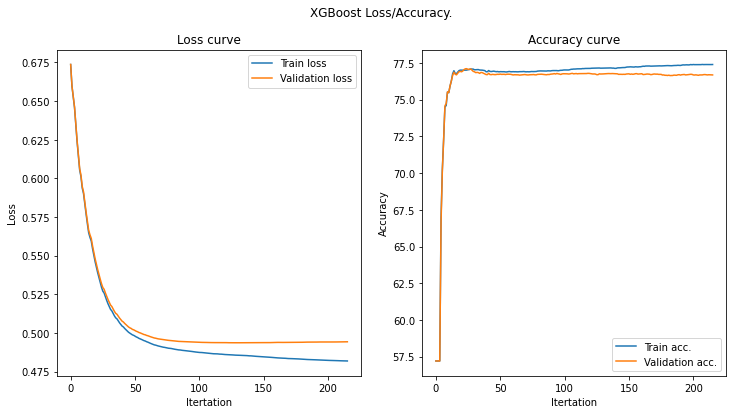

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5539249486176856
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ign

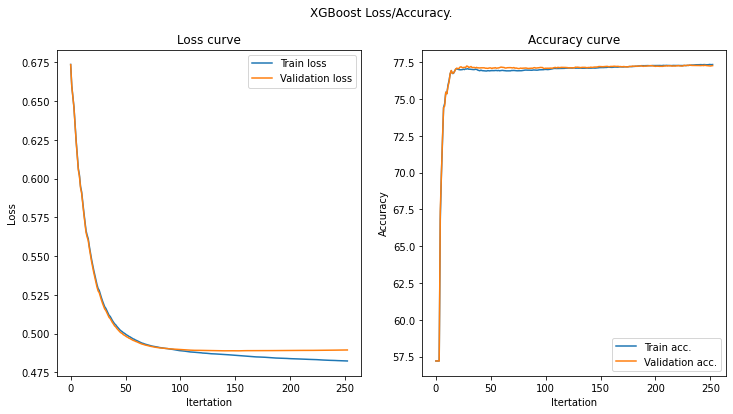

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5539249486176856
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ign

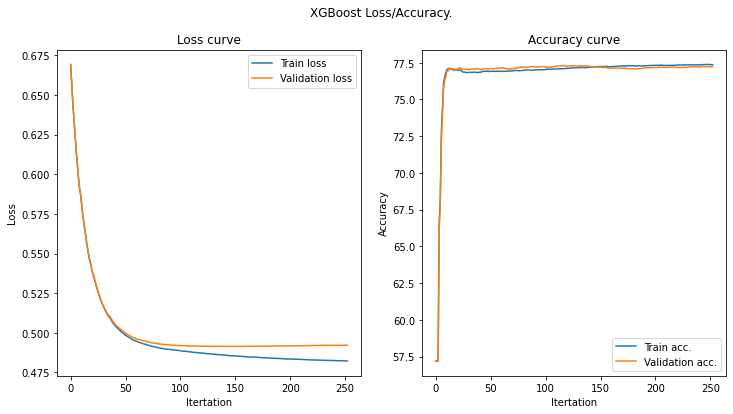

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5539249486176856
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ign

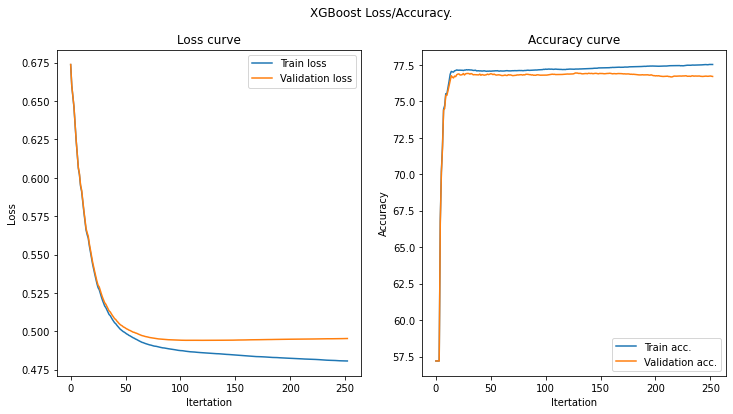

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5539249486176856
[LightGBM] [Warning] bagging_fraction is set=0.5837530875658759, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5837530875658759
[LightGBM] [Warning] bagging_freq is set=1918, subsample_freq=0 will be ignored. Current value: bagging_freq=1918
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5539249486176856, colsample_bytree=1.0 will be ign

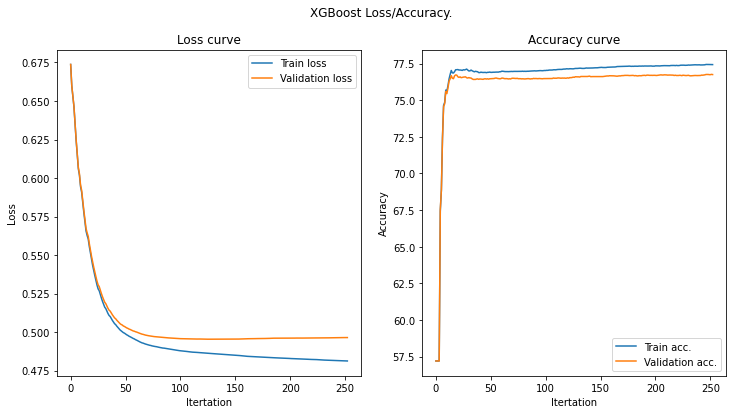

[I 2021-04-13 19:38:32,544] Trial 17 finished with value: 0.7693625 and parameters: {'boosting': 'gbdt', 'n_estimators': 6309, 'learning_rate': 0.043546776622491984, 'max_depth': 75, 'num_leaves': 93, 'reg_alpha': 6.166138555478293, 'reg_lambda': 8.309120199890332, 'feature_fraction': 0.5539249486176856, 'min_child_samples': 151, 'bagging_freq': 1918, 'bagging_fraction': 0.5837530875658759, 'max_bin': 246}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7693625
--------------------> Trial 18 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7506148623539988
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warn

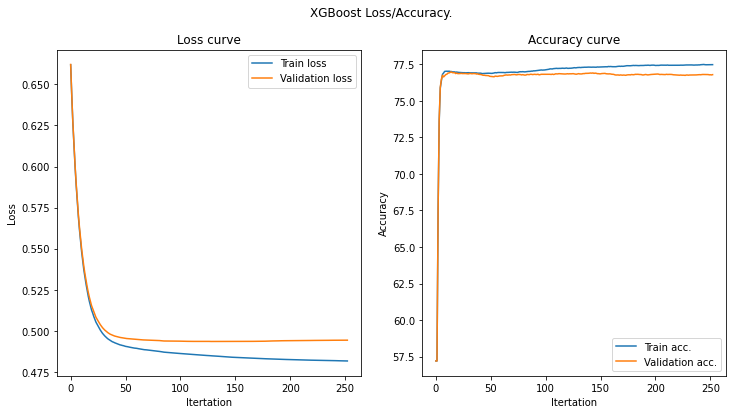

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7506148623539988
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be

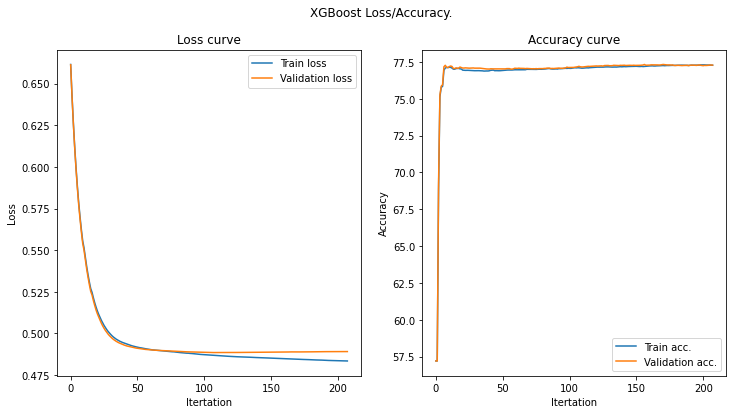

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7506148623539988
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be

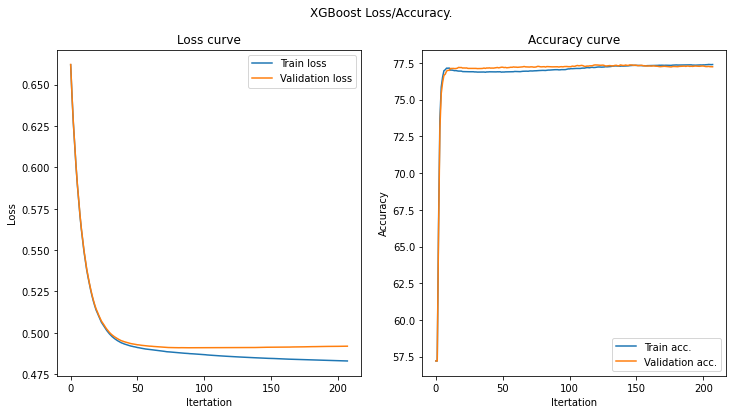

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7506148623539988
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be

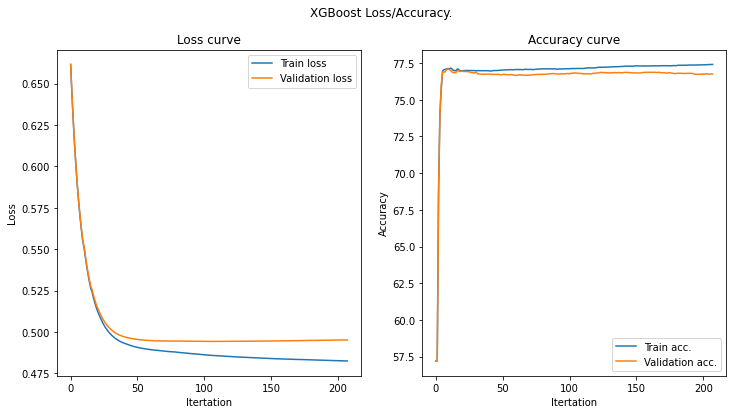

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7506148623539988
[LightGBM] [Warning] bagging_fraction is set=0.5941586132261126, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5941586132261126
[LightGBM] [Warning] bagging_freq is set=10384, subsample_freq=0 will be ignored. Current value: bagging_freq=10384
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7506148623539988, colsample_bytree=1.0 will be

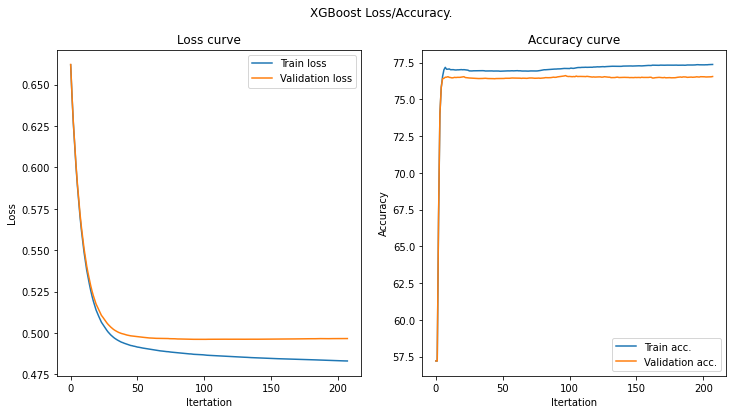

[I 2021-04-13 19:38:47,397] Trial 18 finished with value: 0.769475 and parameters: {'boosting': 'gbdt', 'n_estimators': 10628, 'learning_rate': 0.06434290073645958, 'max_depth': 101, 'num_leaves': 37, 'reg_alpha': 7.668723901911424, 'reg_lambda': 8.567371273007133, 'feature_fraction': 0.7506148623539988, 'min_child_samples': 159, 'bagging_freq': 10384, 'bagging_fraction': 0.5941586132261126, 'max_bin': 526}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769475
--------------------> Trial 19 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8220773079282202
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] 

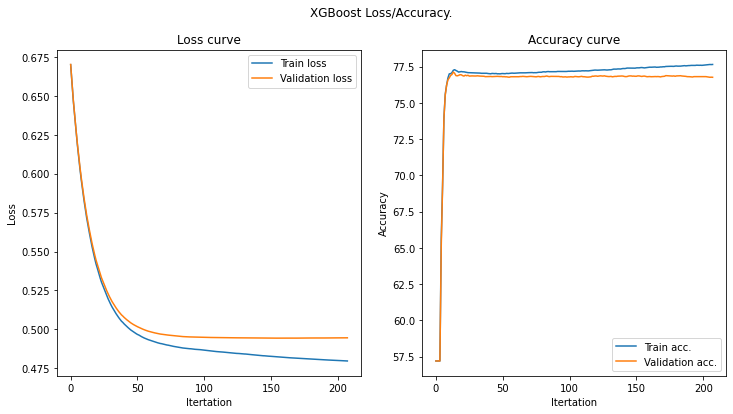

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8220773079282202
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ign

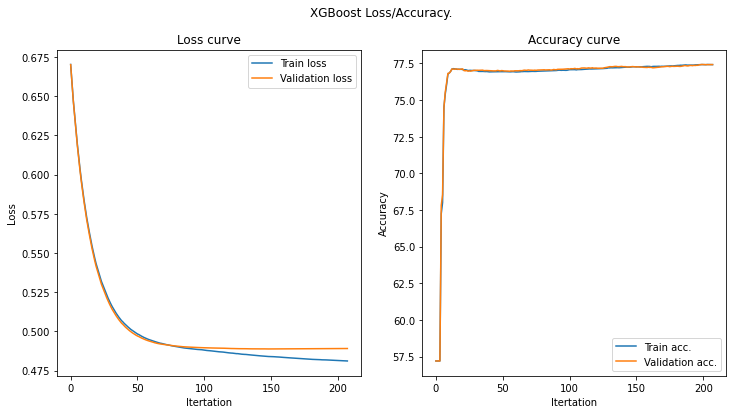

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8220773079282202
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ign

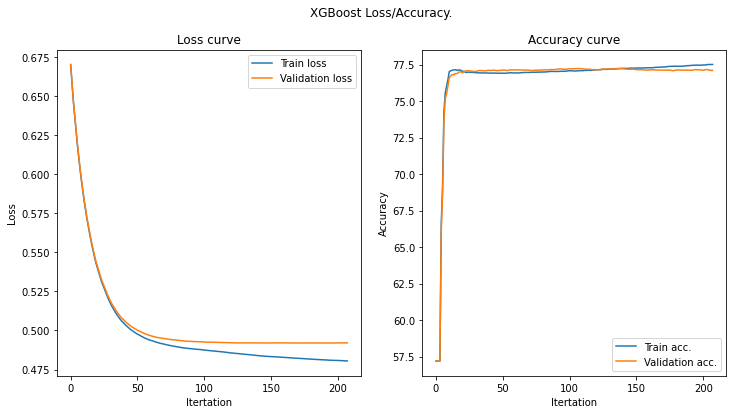

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8220773079282202
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ign

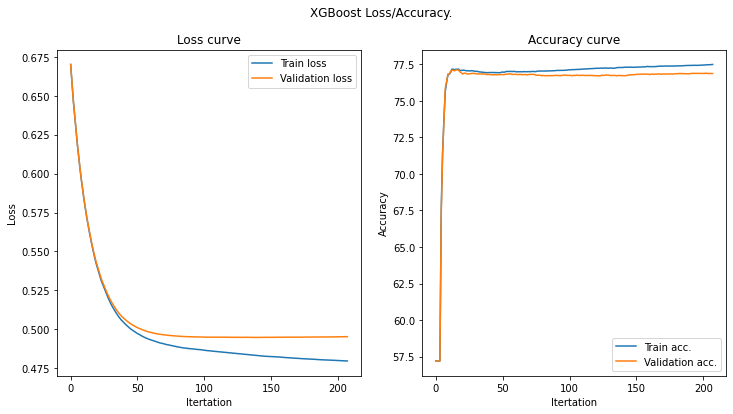

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8220773079282202
[LightGBM] [Warning] bagging_fraction is set=0.8306234725454424, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8306234725454424
[LightGBM] [Warning] bagging_freq is set=5872, subsample_freq=0 will be ignored. Current value: bagging_freq=5872
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8220773079282202, colsample_bytree=1.0 will be ign

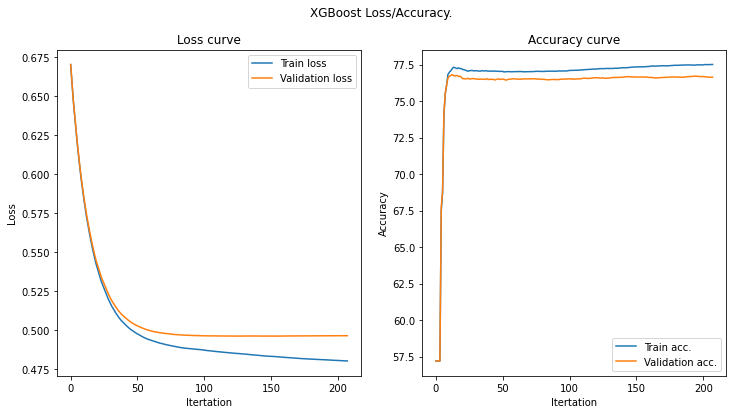

[I 2021-04-13 19:39:04,863] Trial 19 finished with value: 0.768825 and parameters: {'boosting': 'gbdt', 'n_estimators': 4342, 'learning_rate': 0.03857541916730357, 'max_depth': 14, 'num_leaves': 89, 'reg_alpha': 5.514048104236974, 'reg_lambda': 6.685679516711032, 'feature_fraction': 0.8220773079282202, 'min_child_samples': 249, 'bagging_freq': 5872, 'bagging_fraction': 0.8306234725454424, 'max_bin': 268}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.768825
--------------------> Trial 20 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6604445313423275
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feat

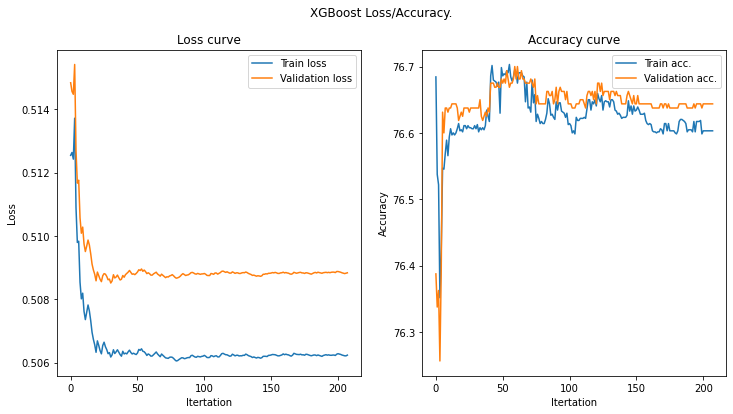

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6604445313423275
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored

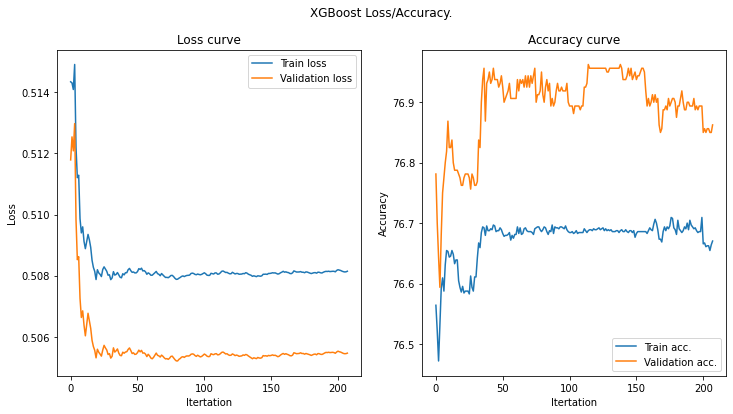

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6604445313423275
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored

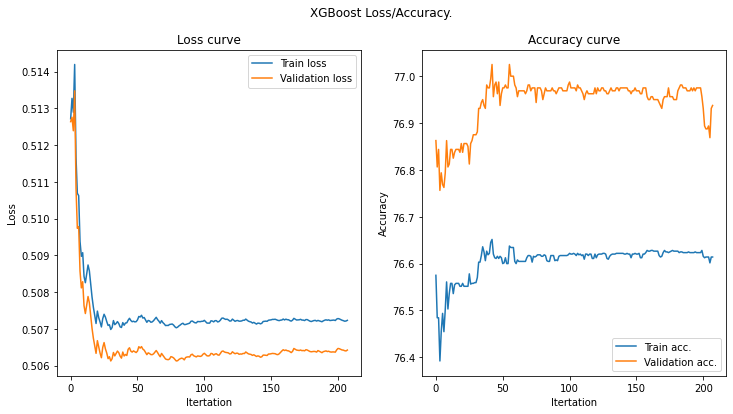

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6604445313423275
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored

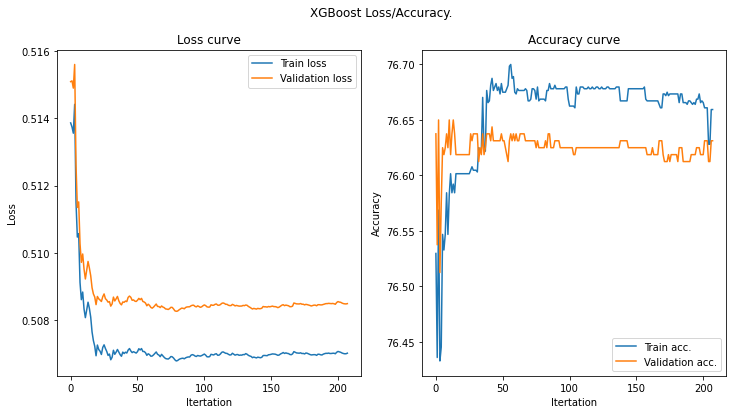

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6604445313423275
[LightGBM] [Warning] bagging_fraction is set=0.46630423433496165, subsample=1.0 will be ignored. Current value: bagging_fraction=0.46630423433496165
[LightGBM] [Warning] bagging_freq is set=2099, subsample_freq=0 will be ignored. Current value: bagging_freq=2099
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.6604445313423275, colsample_bytree=1.0 will be ignored

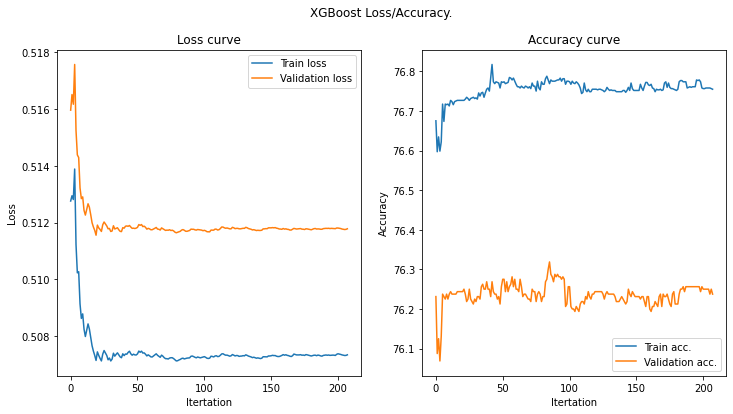

[I 2021-04-13 19:39:18,058] Trial 20 finished with value: 0.7666625 and parameters: {'boosting': 'rf', 'n_estimators': 17403, 'learning_rate': 0.003022201512047712, 'max_depth': 52, 'num_leaves': 99, 'reg_alpha': 0.7722407342422883, 'reg_lambda': 8.696634962262328, 'feature_fraction': 0.6604445313423275, 'min_child_samples': 224, 'bagging_freq': 2099, 'bagging_fraction': 0.46630423433496165, 'max_bin': 135}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7666625
--------------------> Trial 21 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7659309800318921
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warn

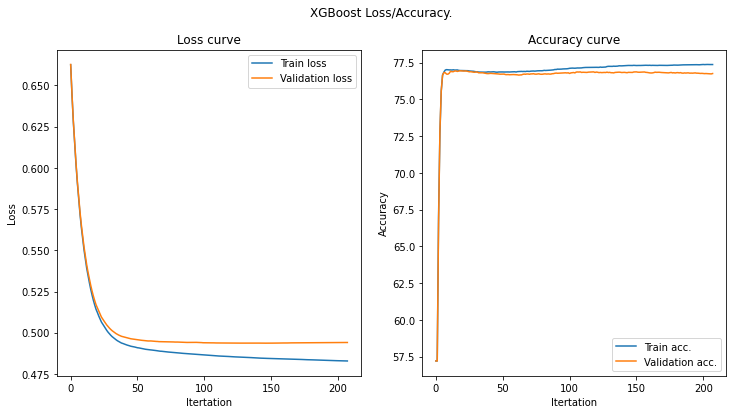

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7659309800318921
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be

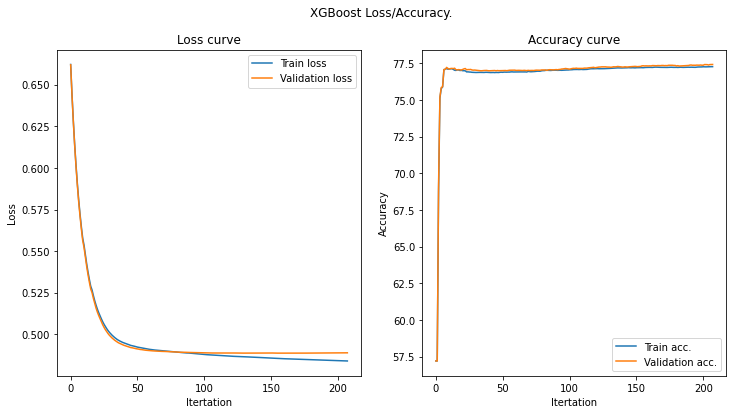

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7659309800318921
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be

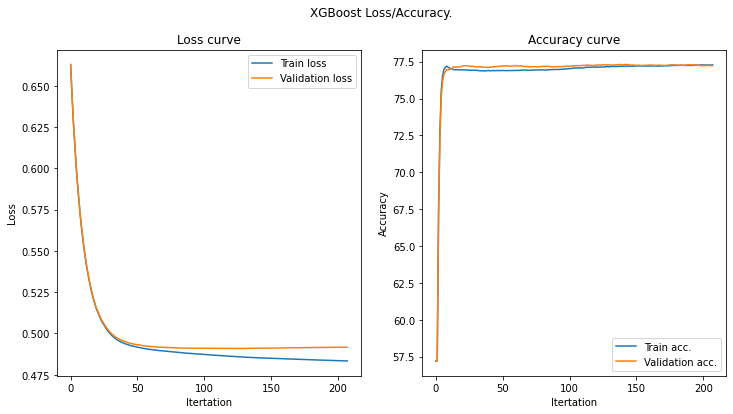

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7659309800318921
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be

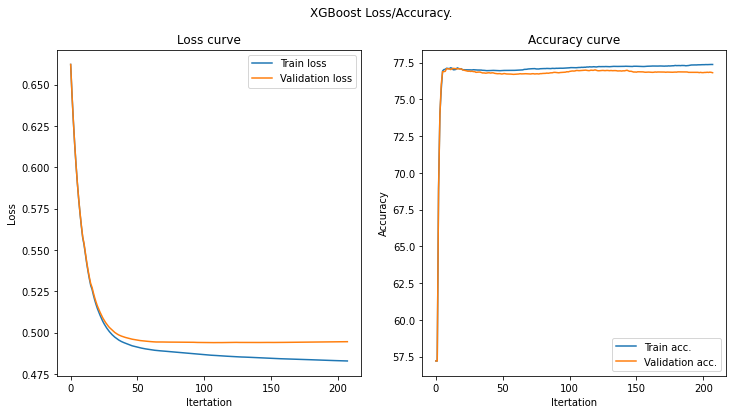

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7659309800318921
[LightGBM] [Warning] bagging_fraction is set=0.6158805877120885, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6158805877120885
[LightGBM] [Warning] bagging_freq is set=10721, subsample_freq=0 will be ignored. Current value: bagging_freq=10721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7659309800318921, colsample_bytree=1.0 will be

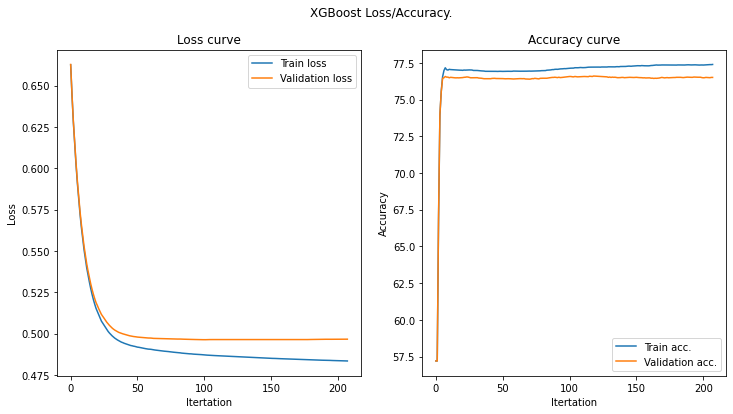

[I 2021-04-13 19:39:32,033] Trial 21 finished with value: 0.7695 and parameters: {'boosting': 'gbdt', 'n_estimators': 11869, 'learning_rate': 0.06227678261805094, 'max_depth': 102, 'num_leaves': 34, 'reg_alpha': 7.926496114514479, 'reg_lambda': 8.613448211901618, 'feature_fraction': 0.7659309800318921, 'min_child_samples': 158, 'bagging_freq': 10721, 'bagging_fraction': 0.6158805877120885, 'max_bin': 528}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7695
--------------------> Trial 22 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8362799064174492
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning

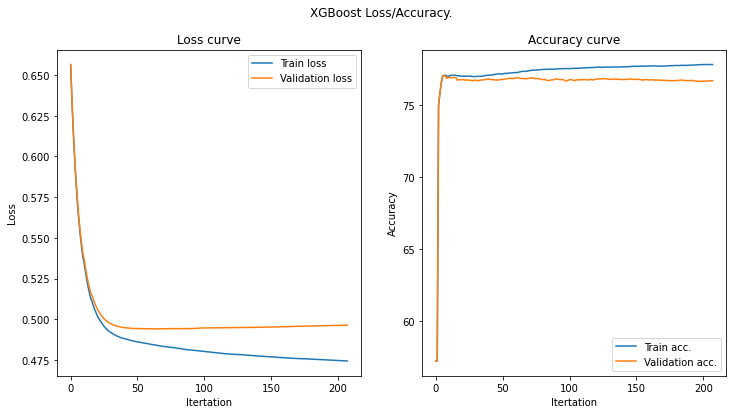

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8362799064174492
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be

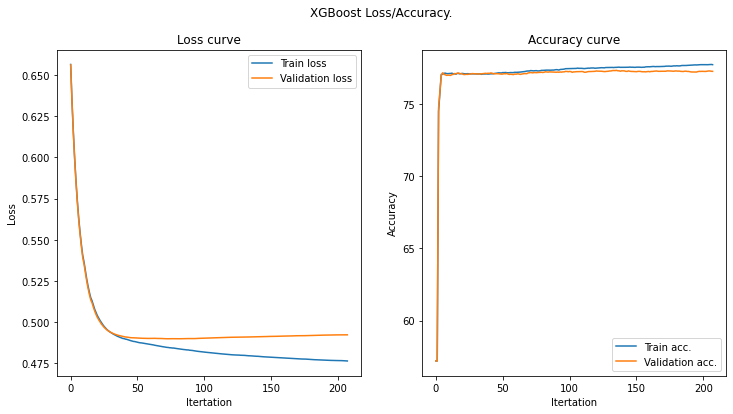

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8362799064174492
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be

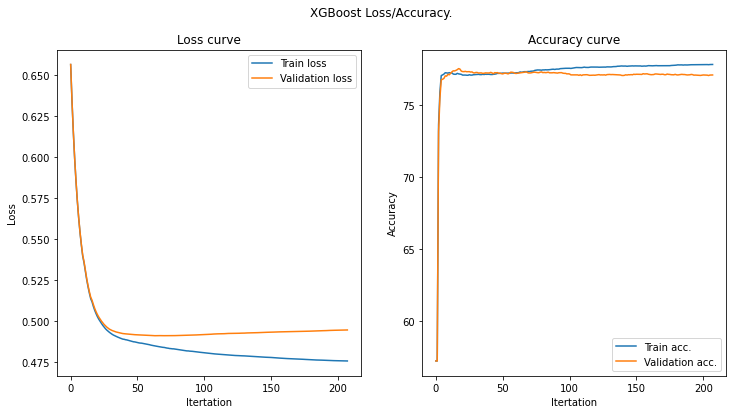

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8362799064174492
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be

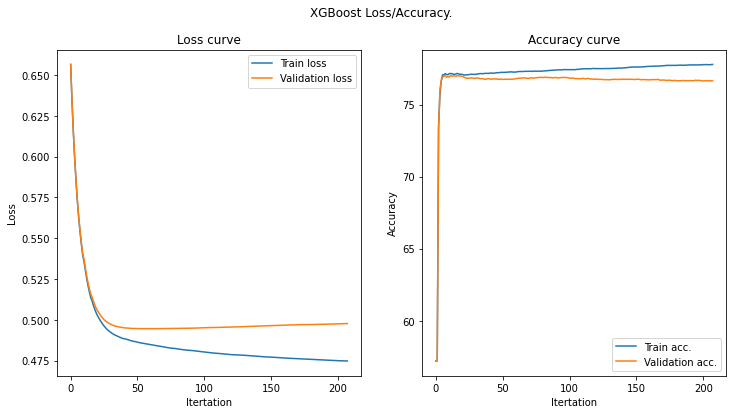

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8362799064174492
[LightGBM] [Warning] bagging_fraction is set=0.6508937118454493, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6508937118454493
[LightGBM] [Warning] bagging_freq is set=11597, subsample_freq=0 will be ignored. Current value: bagging_freq=11597
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.8362799064174492, colsample_bytree=1.0 will be

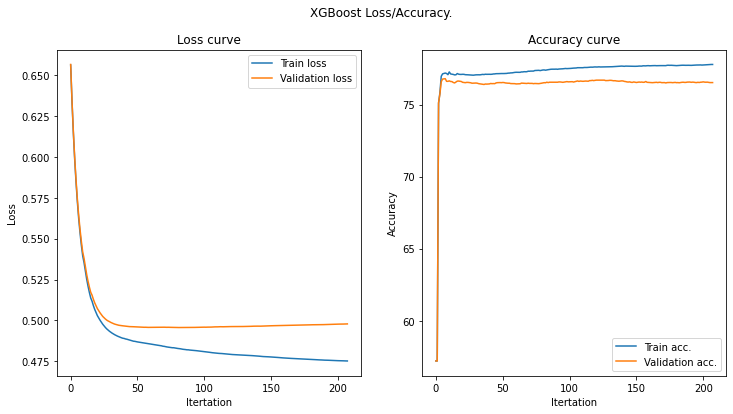

[I 2021-04-13 19:39:50,195] Trial 22 finished with value: 0.7689 and parameters: {'boosting': 'gbdt', 'n_estimators': 11914, 'learning_rate': 0.07988736663895968, 'max_depth': 78, 'num_leaves': 83, 'reg_alpha': 7.71591384919701, 'reg_lambda': 7.7493352341714665, 'feature_fraction': 0.8362799064174492, 'min_child_samples': 130, 'bagging_freq': 11597, 'bagging_fraction': 0.6508937118454493, 'max_bin': 748}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7689
--------------------> Trial 23 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6888230985912778
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] fe

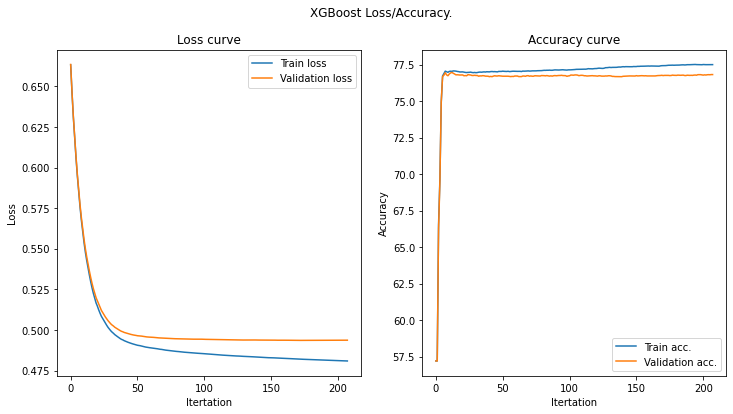

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6888230985912778
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ign

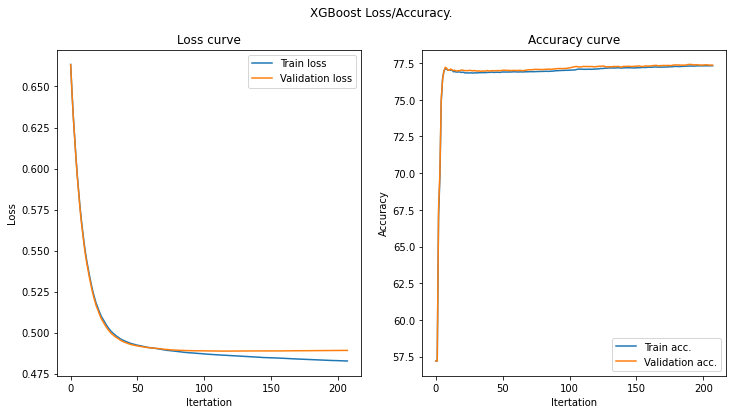

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6888230985912778
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ign

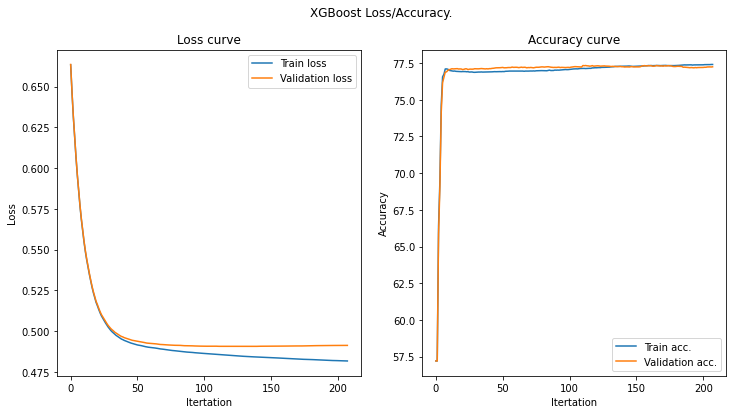

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6888230985912778
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ign

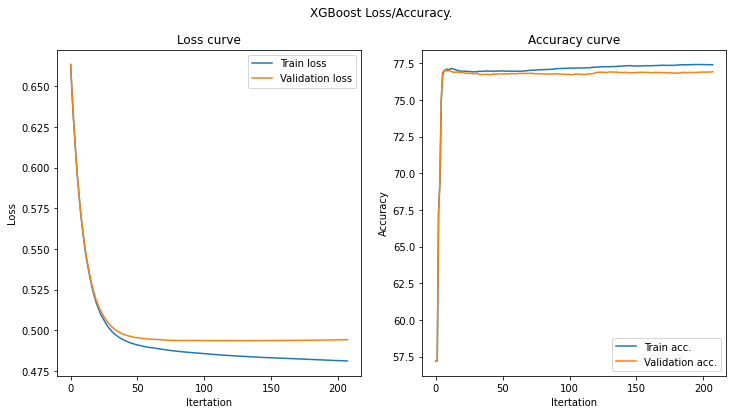

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6888230985912778
[LightGBM] [Warning] bagging_fraction is set=0.8087718055283322, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8087718055283322
[LightGBM] [Warning] bagging_freq is set=9727, subsample_freq=0 will be ignored. Current value: bagging_freq=9727
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6888230985912778, colsample_bytree=1.0 will be ign

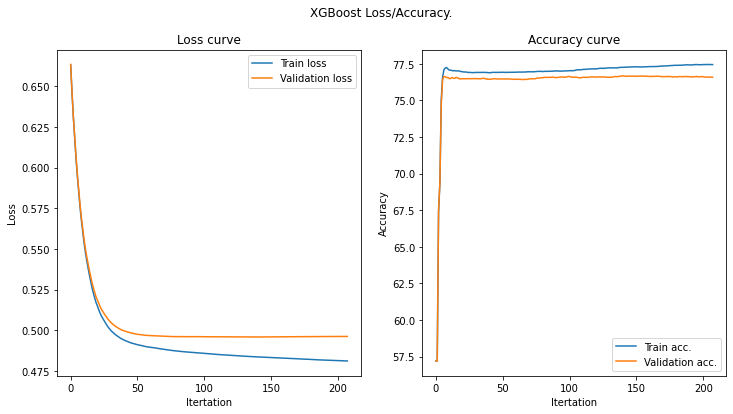

[I 2021-04-13 19:40:04,253] Trial 23 finished with value: 0.769025 and parameters: {'boosting': 'gbdt', 'n_estimators': 7525, 'learning_rate': 0.059796352126576344, 'max_depth': 103, 'num_leaves': 33, 'reg_alpha': 4.058373430648133, 'reg_lambda': 9.381211426718279, 'feature_fraction': 0.6888230985912778, 'min_child_samples': 175, 'bagging_freq': 9727, 'bagging_fraction': 0.8087718055283322, 'max_bin': 497}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769025
--------------------> Trial 24 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5325736747508144
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warni

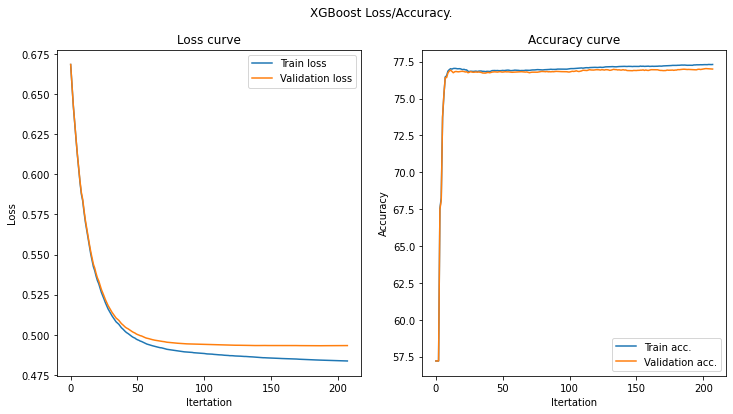

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5325736747508144
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be

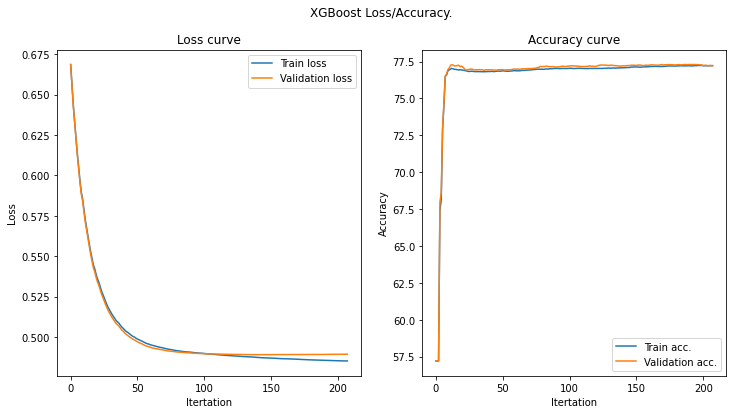

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5325736747508144
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be

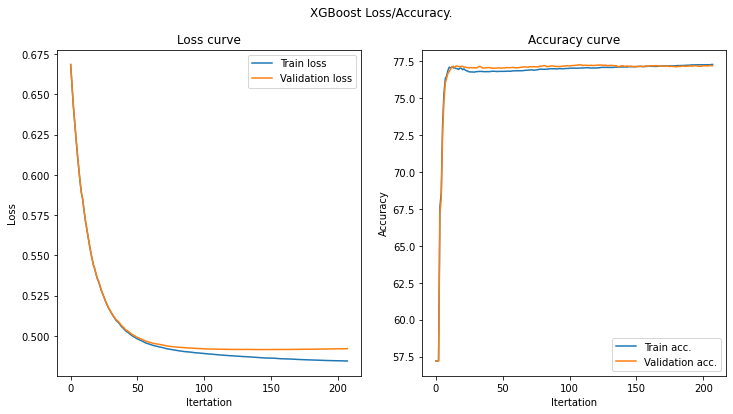

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5325736747508144
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be

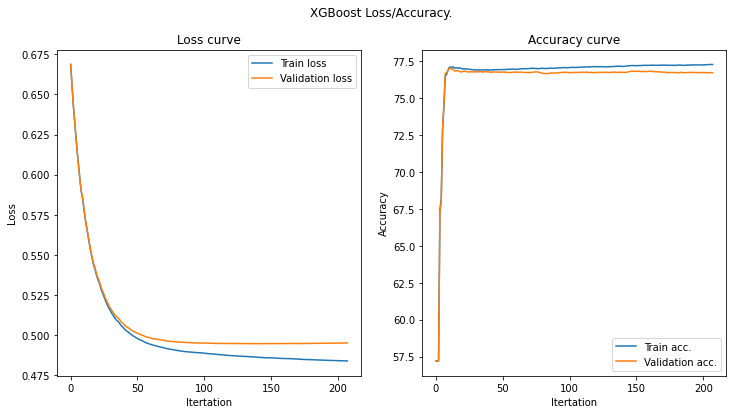

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5325736747508144
[LightGBM] [Warning] bagging_fraction is set=0.5283106887309461, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5283106887309461
[LightGBM] [Warning] bagging_freq is set=12694, subsample_freq=0 will be ignored. Current value: bagging_freq=12694
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5325736747508144, colsample_bytree=1.0 will be

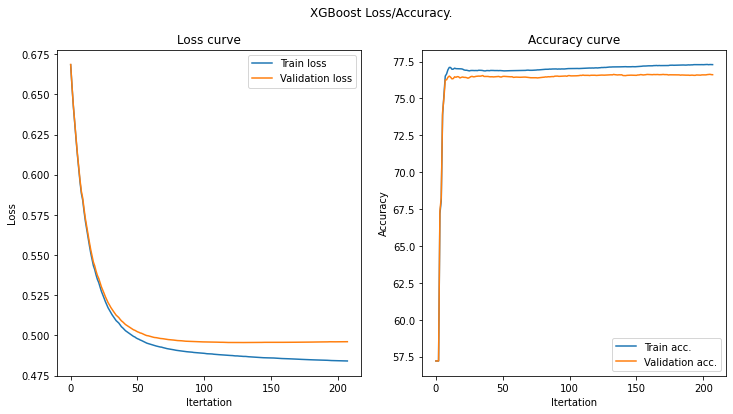

[I 2021-04-13 19:40:19,411] Trial 24 finished with value: 0.7691125 and parameters: {'boosting': 'gbdt', 'n_estimators': 10864, 'learning_rate': 0.0455595851048764, 'max_depth': 127, 'num_leaves': 69, 'reg_alpha': 6.204748717890457, 'reg_lambda': 6.2254048431953395, 'feature_fraction': 0.5325736747508144, 'min_child_samples': 187, 'bagging_freq': 12694, 'bagging_fraction': 0.5283106887309461, 'max_bin': 351}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7691125
--------------------> Trial 25 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.763545152209087
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warnin

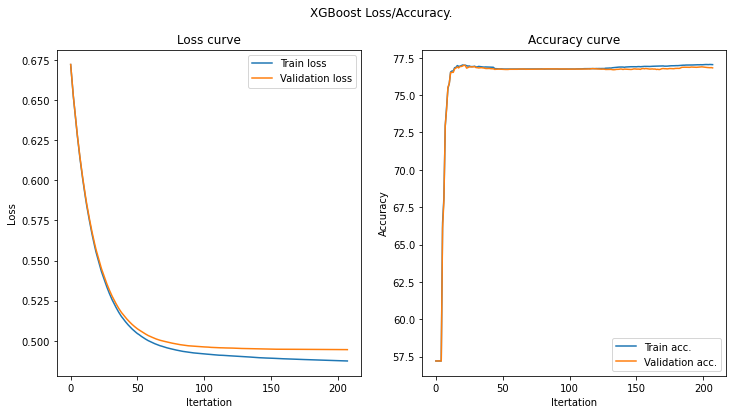

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.763545152209087
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ig

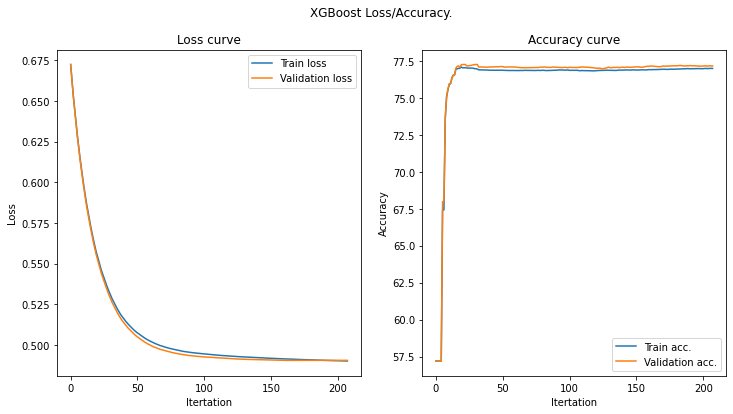

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.763545152209087
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ig

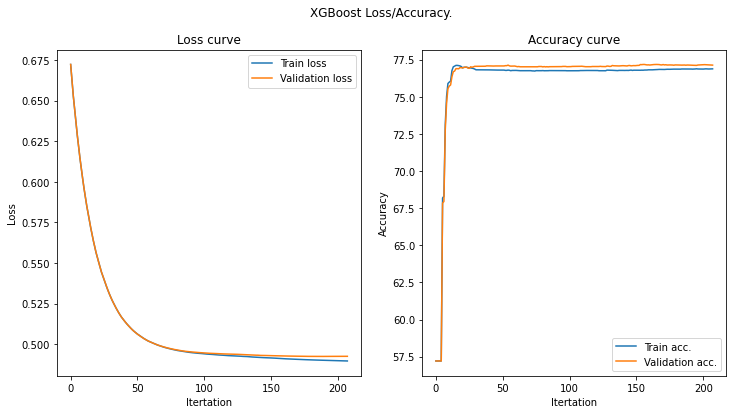

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.763545152209087
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ig

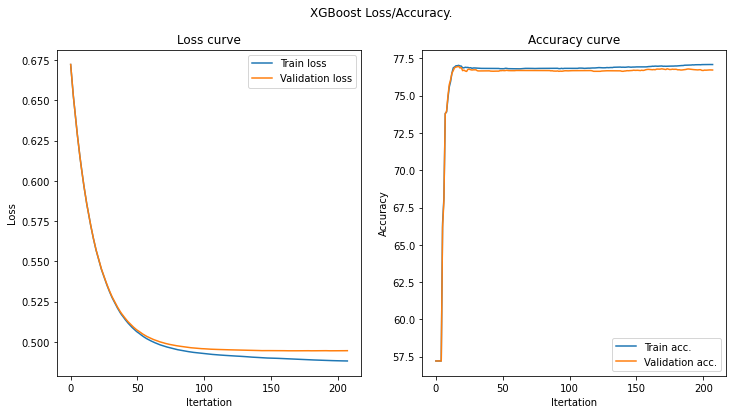

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.763545152209087
[LightGBM] [Warning] bagging_fraction is set=0.3896792510711128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.3896792510711128
[LightGBM] [Warning] bagging_freq is set=13003, subsample_freq=0 will be ignored. Current value: bagging_freq=13003
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.763545152209087, colsample_bytree=1.0 will be ig

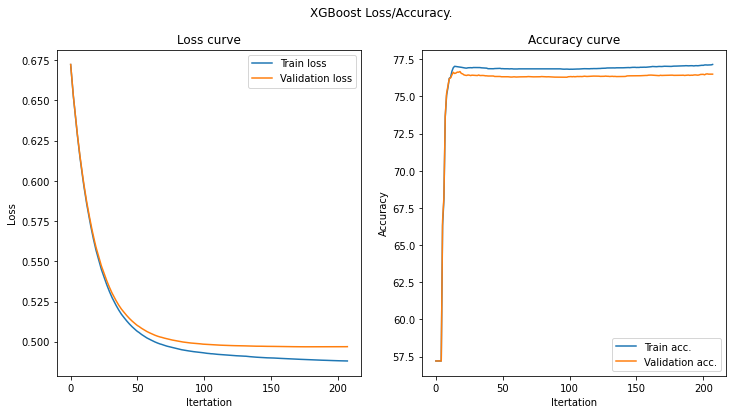

[I 2021-04-13 19:40:34,592] Trial 25 finished with value: 0.7677875 and parameters: {'boosting': 'gbdt', 'n_estimators': 9941, 'learning_rate': 0.032172694268931684, 'max_depth': 96, 'num_leaves': 102, 'reg_alpha': 8.260058358988491, 'reg_lambda': 4.3416037777207155, 'feature_fraction': 0.763545152209087, 'min_child_samples': 273, 'bagging_freq': 13003, 'bagging_fraction': 0.3896792510711128, 'max_bin': 728}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7677875
--------------------> Trial 26 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.648678538312808
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] f

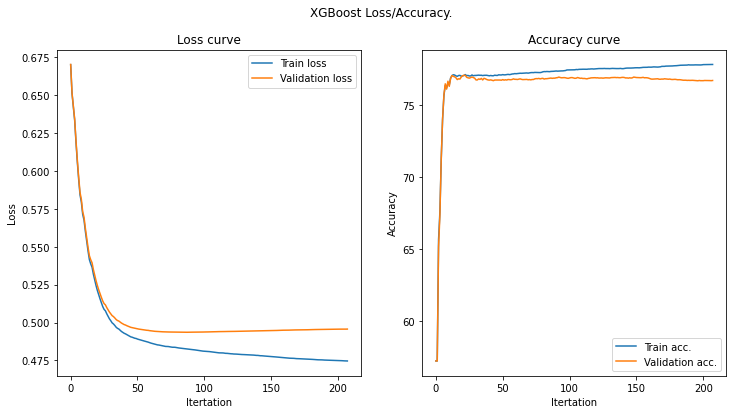

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.648678538312808
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignore

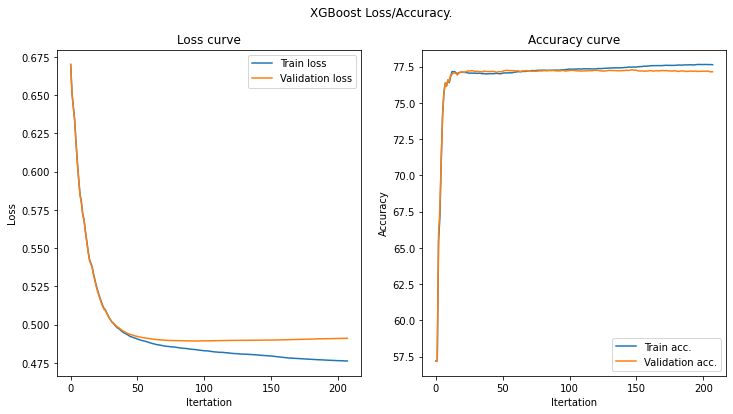

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.648678538312808
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignore

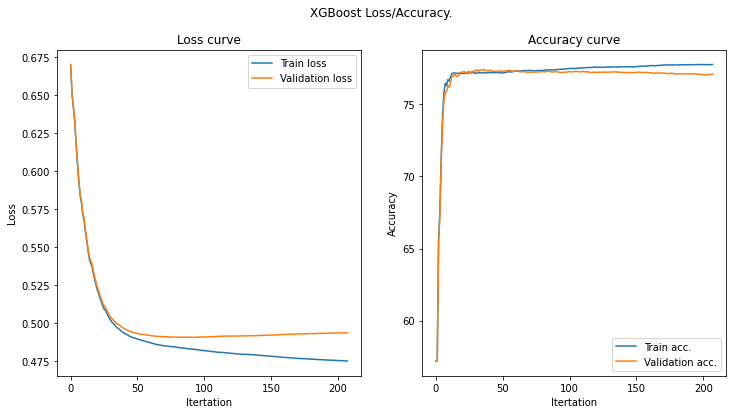

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.648678538312808
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignore

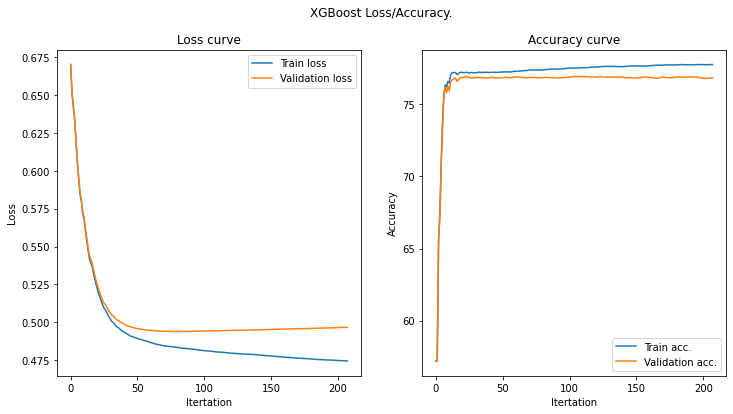

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.648678538312808
[LightGBM] [Warning] bagging_fraction is set=0.6643350646091213, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6643350646091213
[LightGBM] [Warning] bagging_freq is set=9290, subsample_freq=0 will be ignored. Current value: bagging_freq=9290
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.648678538312808, colsample_bytree=1.0 will be ignore

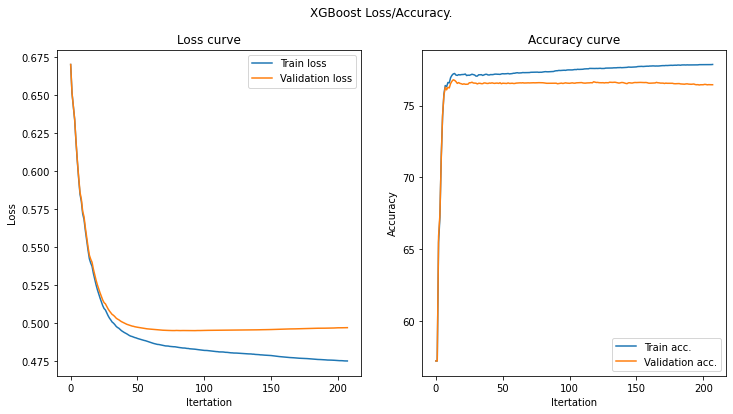

[I 2021-04-13 19:40:52,289] Trial 26 finished with value: 0.769725 and parameters: {'boosting': 'gbdt', 'n_estimators': 12266, 'learning_rate': 0.060935655437828744, 'max_depth': 117, 'num_leaves': 110, 'reg_alpha': 5.651251368784493, 'reg_lambda': 9.129802675229824, 'feature_fraction': 0.648678538312808, 'min_child_samples': 84, 'bagging_freq': 9290, 'bagging_fraction': 0.6643350646091213, 'max_bin': 497}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769725
--------------------> Trial 27 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408447835617972
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feat

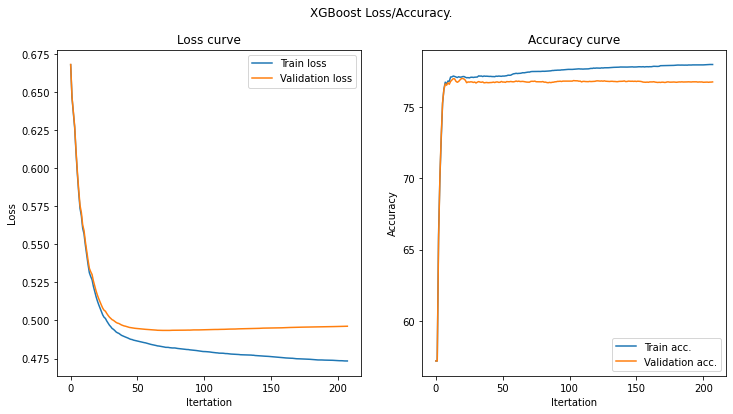

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408447835617972
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored

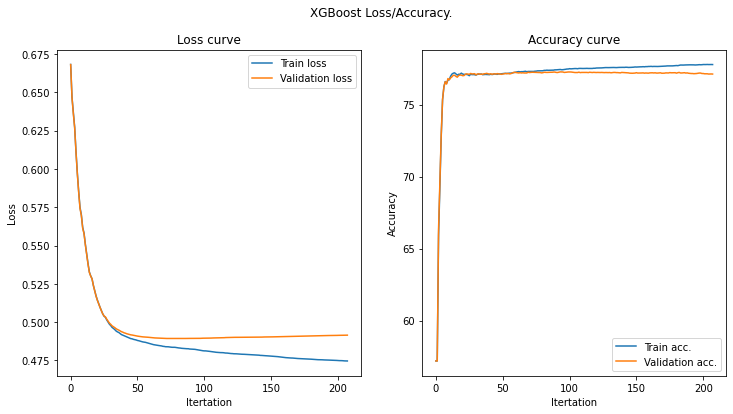

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408447835617972
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored

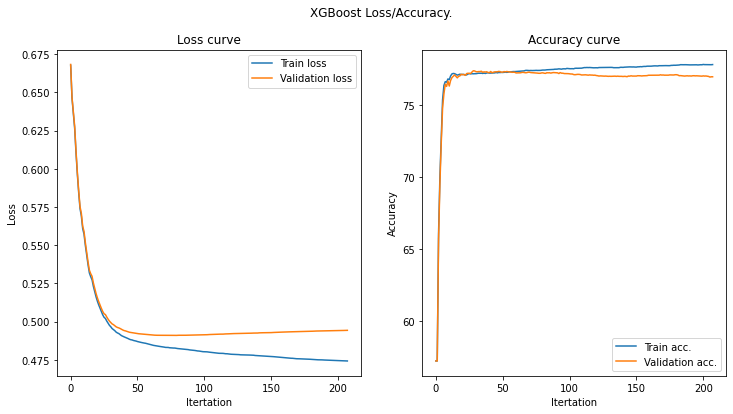

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408447835617972
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored

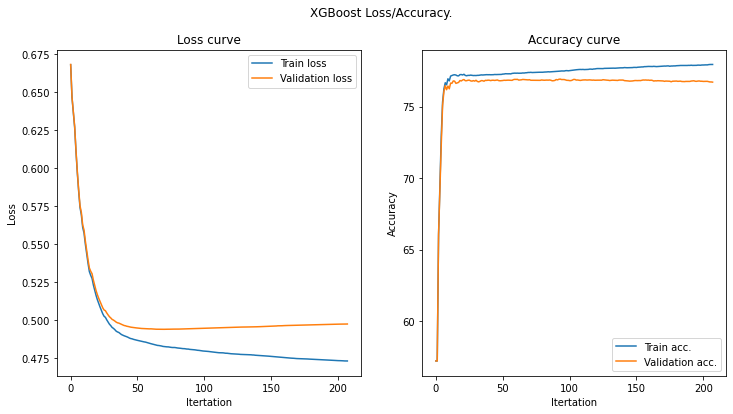

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408447835617972
[LightGBM] [Warning] bagging_fraction is set=0.665411445293272, subsample=1.0 will be ignored. Current value: bagging_fraction=0.665411445293272
[LightGBM] [Warning] bagging_freq is set=8923, subsample_freq=0 will be ignored. Current value: bagging_freq=8923
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6408447835617972, colsample_bytree=1.0 will be ignored

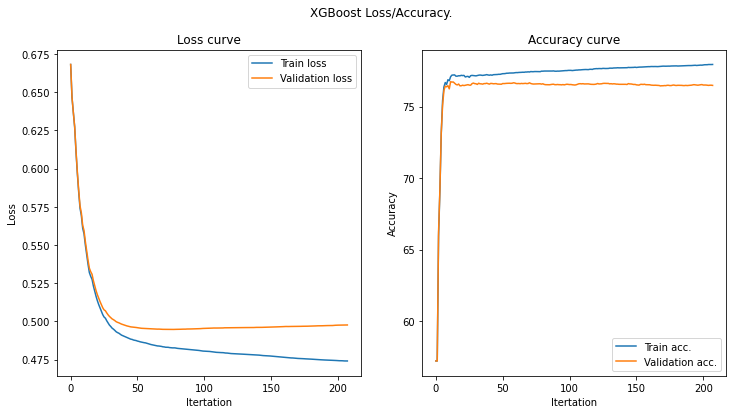

[I 2021-04-13 19:41:09,754] Trial 27 finished with value: 0.7693375 and parameters: {'boosting': 'gbdt', 'n_estimators': 16434, 'learning_rate': 0.07117311526580736, 'max_depth': 120, 'num_leaves': 112, 'reg_alpha': 5.658072798114362, 'reg_lambda': 9.331884888506433, 'feature_fraction': 0.6408447835617972, 'min_child_samples': 30, 'bagging_freq': 8923, 'bagging_fraction': 0.665411445293272, 'max_bin': 251}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7693375
--------------------> Trial 28 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5365911789673877
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

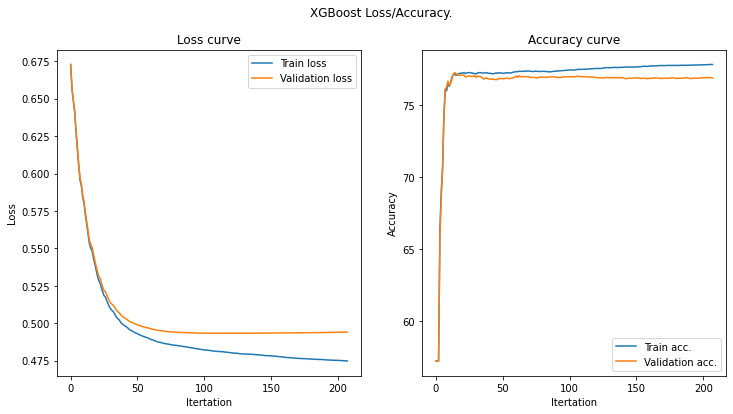

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5365911789673877
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ign

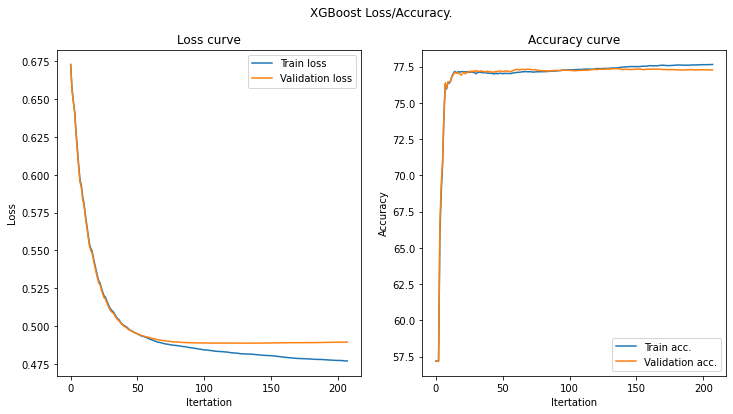

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5365911789673877
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ign

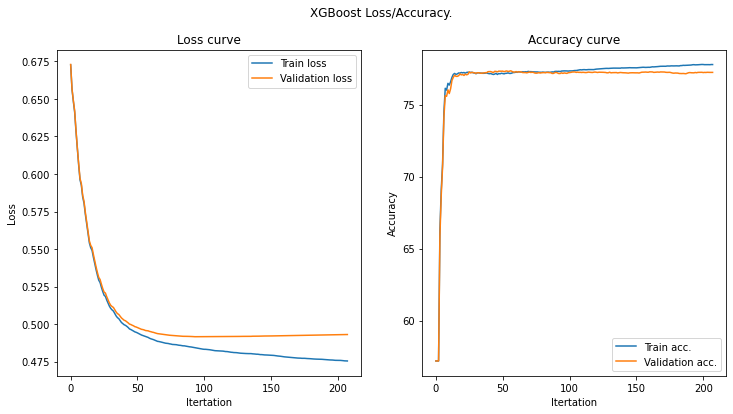

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5365911789673877
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ign

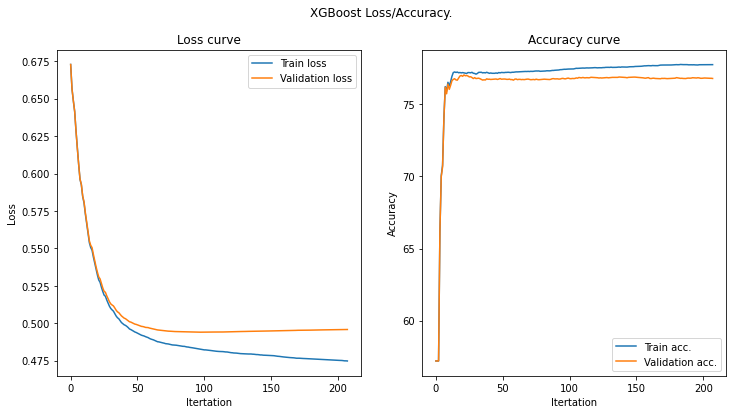

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5365911789673877
[LightGBM] [Warning] bagging_fraction is set=0.8025209460053538, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8025209460053538
[LightGBM] [Warning] bagging_freq is set=6606, subsample_freq=0 will be ignored. Current value: bagging_freq=6606
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5365911789673877, colsample_bytree=1.0 will be ign

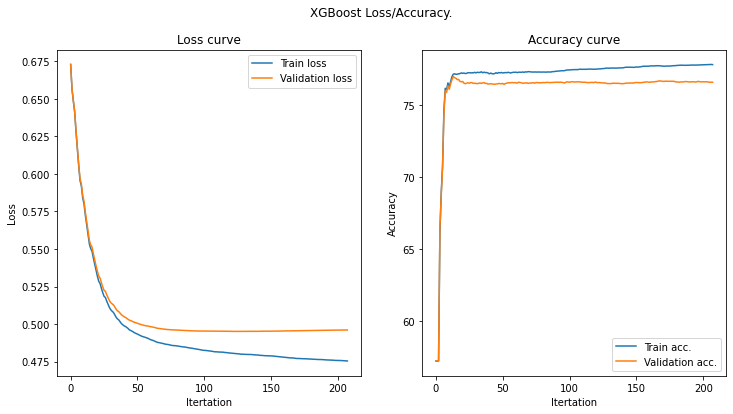

[I 2021-04-13 19:41:27,679] Trial 28 finished with value: 0.7699625 and parameters: {'boosting': 'gbdt', 'n_estimators': 7699, 'learning_rate': 0.0527120916511931, 'max_depth': 54, 'num_leaves': 103, 'reg_alpha': 4.7724933604286575, 'reg_lambda': 7.696800500359427, 'feature_fraction': 0.5365911789673877, 'min_child_samples': 78, 'bagging_freq': 6606, 'bagging_fraction': 0.8025209460053538, 'max_bin': 466}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7699625
--------------------> Trial 29 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4986154049840113
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning]

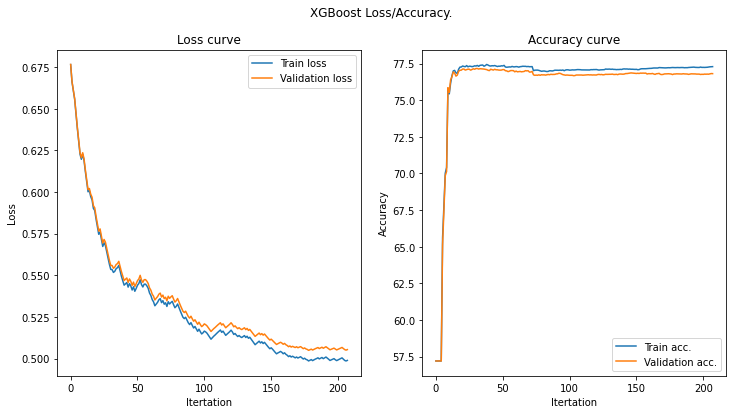

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4986154049840113
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ign

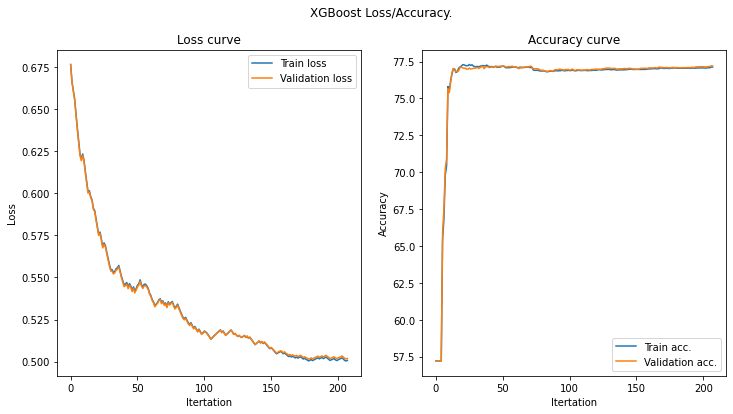

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4986154049840113
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ign

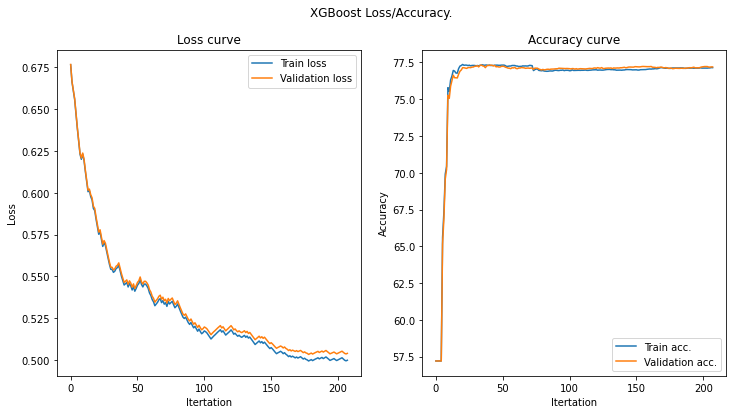

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4986154049840113
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ign

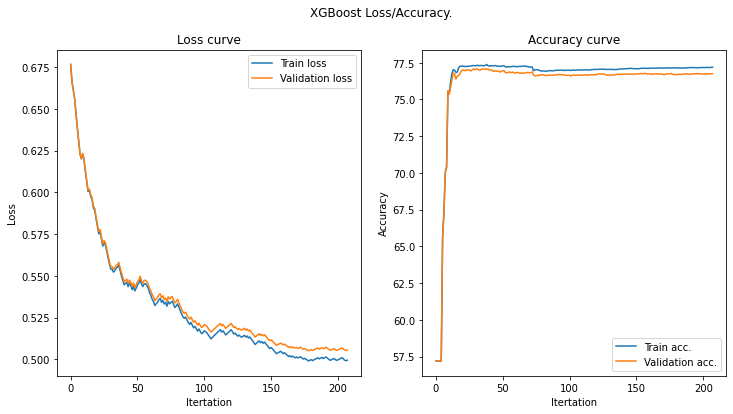

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4986154049840113
[LightGBM] [Warning] bagging_fraction is set=0.8033181360897023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8033181360897023
[LightGBM] [Warning] bagging_freq is set=6564, subsample_freq=0 will be ignored. Current value: bagging_freq=6564
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4986154049840113, colsample_bytree=1.0 will be ign

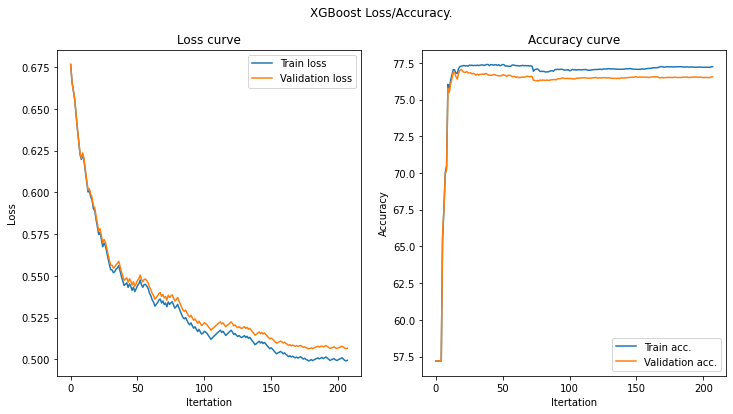

[I 2021-04-13 19:42:12,764] Trial 29 finished with value: 0.7688125 and parameters: {'boosting': 'dart', 'n_estimators': 3698, 'learning_rate': 0.03226093984277574, 'max_depth': 29, 'num_leaves': 105, 'reg_alpha': 3.812519188321564, 'reg_lambda': 6.18855463605048, 'feature_fraction': 0.4986154049840113, 'min_child_samples': 83, 'bagging_freq': 6564, 'bagging_fraction': 0.8033181360897023, 'max_bin': 468}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7688125
--------------------> Trial 30 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4268714785824116
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

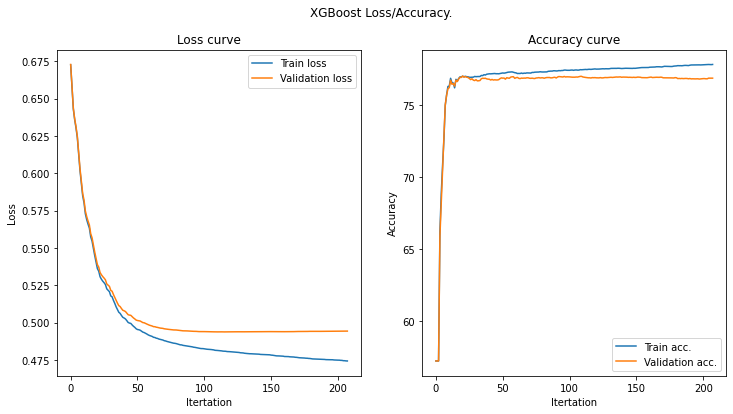

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4268714785824116
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ign

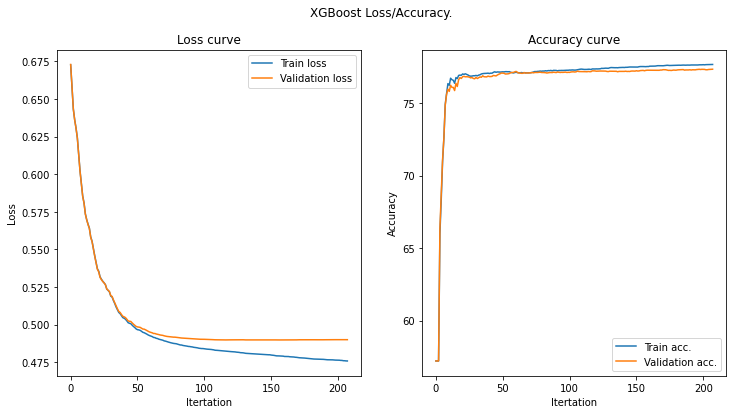

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4268714785824116
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ign

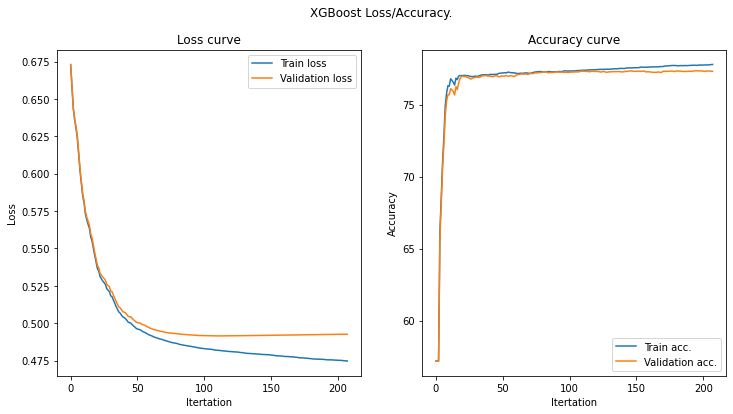

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4268714785824116
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ign

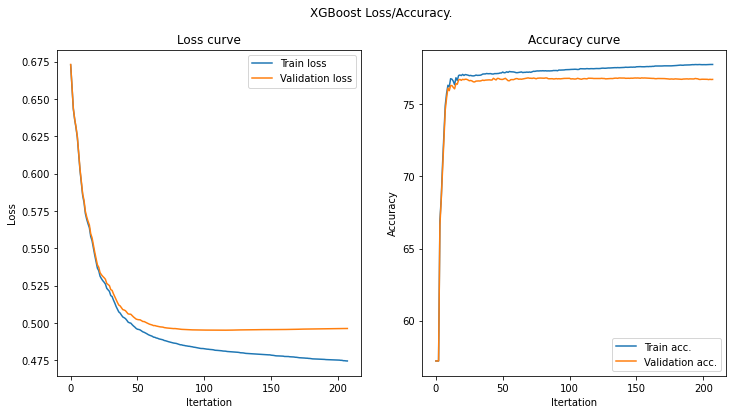

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4268714785824116
[LightGBM] [Warning] bagging_fraction is set=0.8958976241673455, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8958976241673455
[LightGBM] [Warning] bagging_freq is set=4821, subsample_freq=0 will be ignored. Current value: bagging_freq=4821
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4268714785824116, colsample_bytree=1.0 will be ign

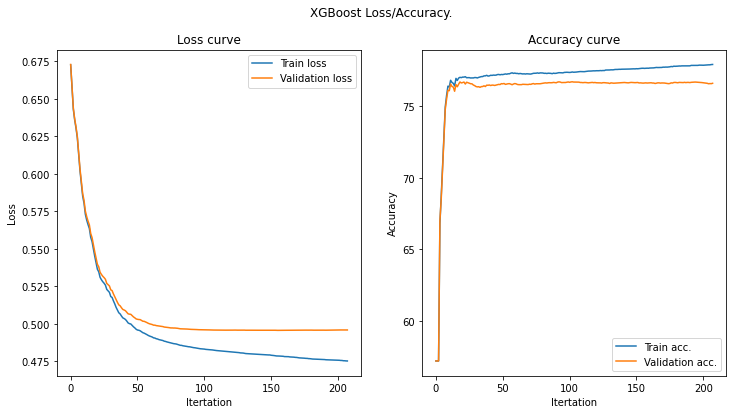

[I 2021-04-13 19:42:31,346] Trial 30 finished with value: 0.7697625 and parameters: {'boosting': 'gbdt', 'n_estimators': 7112, 'learning_rate': 0.05229944617717723, 'max_depth': 56, 'num_leaves': 114, 'reg_alpha': 4.850347735072545, 'reg_lambda': 7.639472911286543, 'feature_fraction': 0.4268714785824116, 'min_child_samples': 1, 'bagging_freq': 4821, 'bagging_fraction': 0.8958976241673455, 'max_bin': 608}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7697625
--------------------> Trial 31 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44311834148634716
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warnin

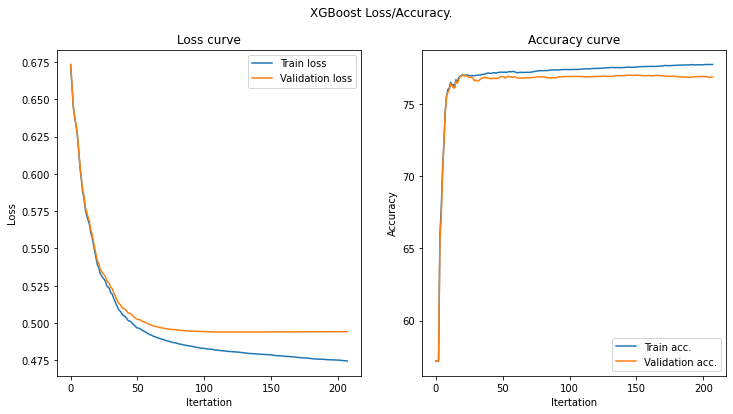

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44311834148634716
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be 

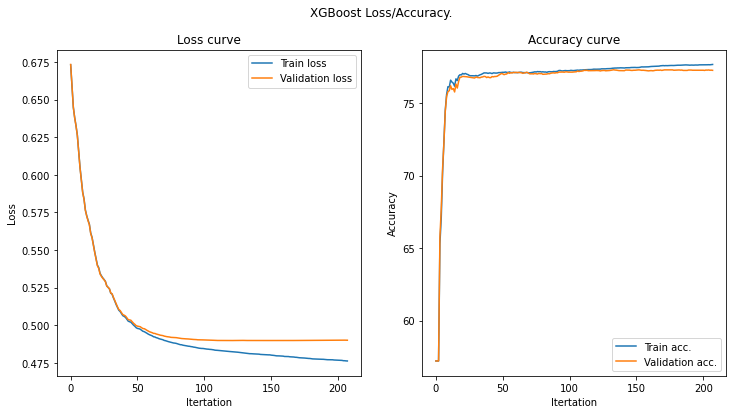

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44311834148634716
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be 

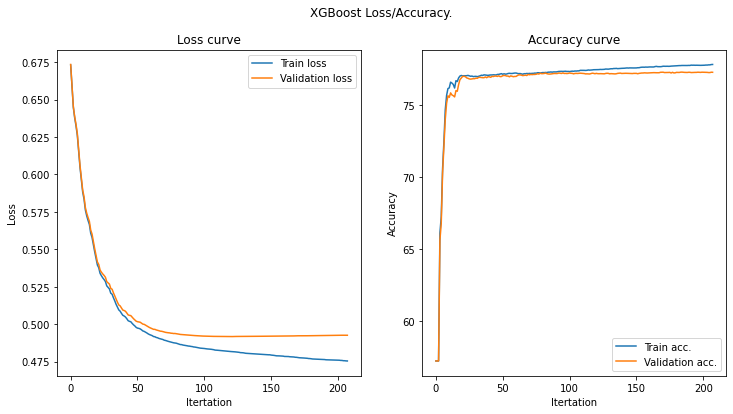

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44311834148634716
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be 

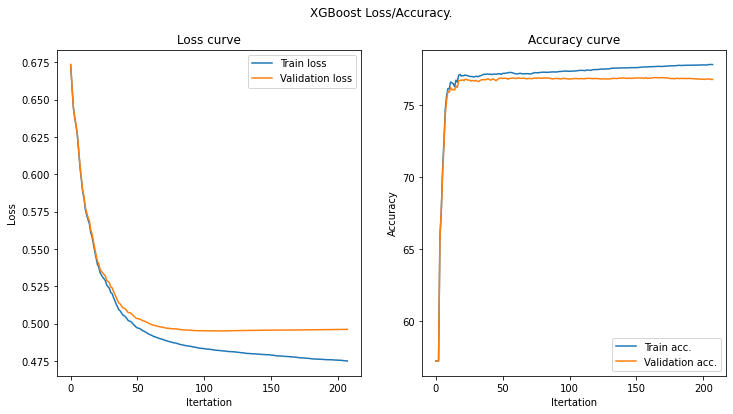

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.44311834148634716
[LightGBM] [Warning] bagging_fraction is set=0.8702098276014663, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8702098276014663
[LightGBM] [Warning] bagging_freq is set=4086, subsample_freq=0 will be ignored. Current value: bagging_freq=4086
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.44311834148634716, colsample_bytree=1.0 will be 

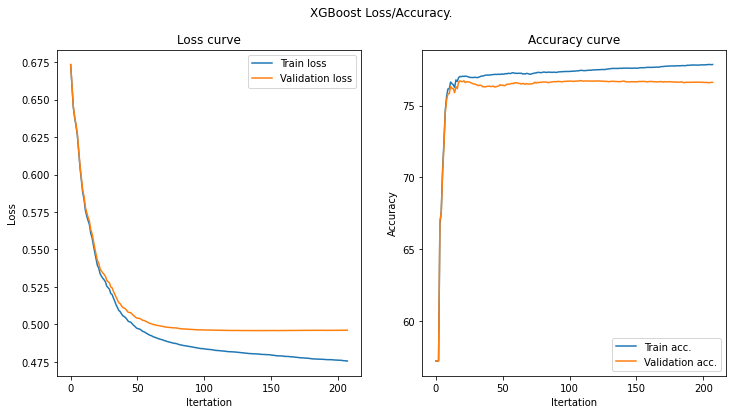

[I 2021-04-13 19:42:49,109] Trial 31 finished with value: 0.7696375 and parameters: {'boosting': 'gbdt', 'n_estimators': 7418, 'learning_rate': 0.04995022552346941, 'max_depth': 54, 'num_leaves': 117, 'reg_alpha': 4.763514431453647, 'reg_lambda': 7.672920872365793, 'feature_fraction': 0.44311834148634716, 'min_child_samples': 8, 'bagging_freq': 4086, 'bagging_fraction': 0.8702098276014663, 'max_bin': 597}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7696375
--------------------> Trial 32 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3715945571113571
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

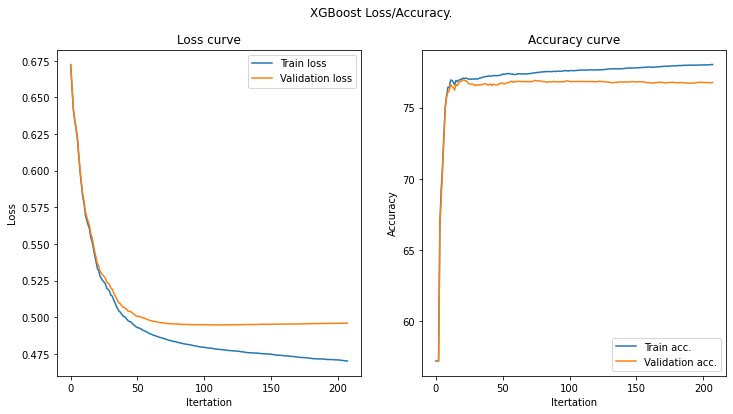

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3715945571113571
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ign

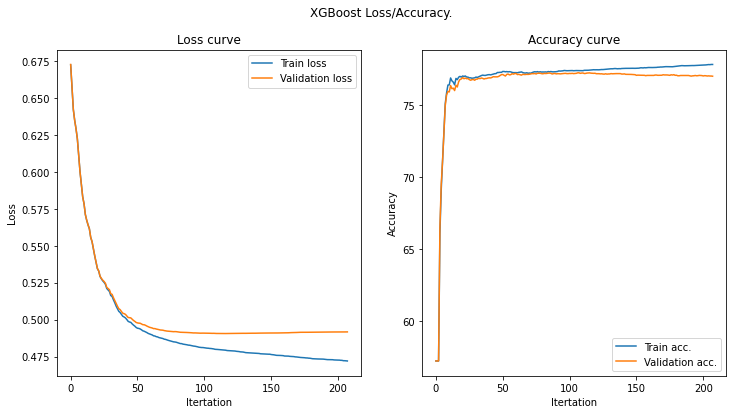

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3715945571113571
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ign

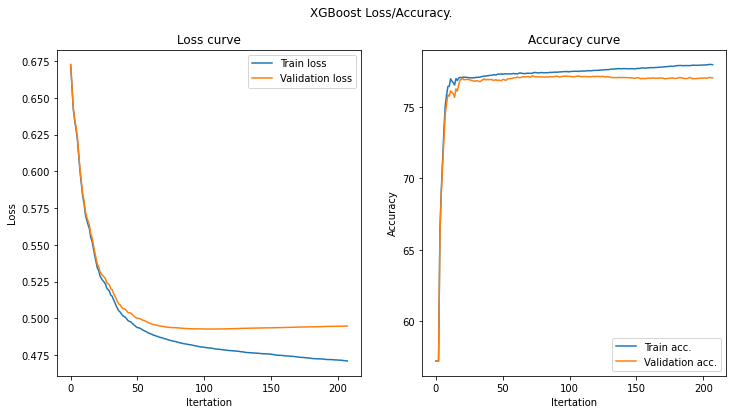

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3715945571113571
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ign

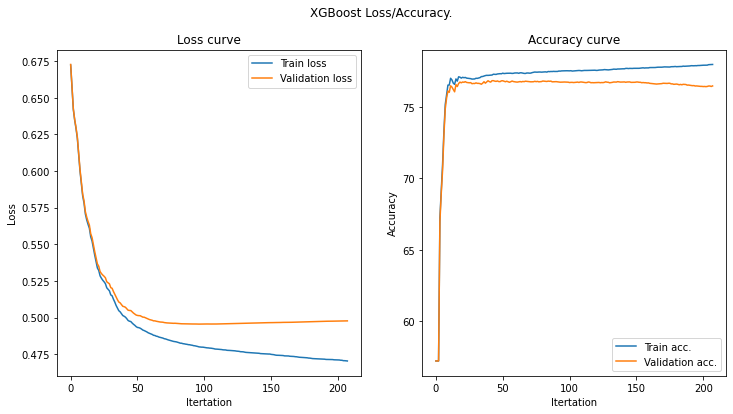

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3715945571113571
[LightGBM] [Warning] bagging_fraction is set=0.7951496202732298, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7951496202732298
[LightGBM] [Warning] bagging_freq is set=4023, subsample_freq=0 will be ignored. Current value: bagging_freq=4023
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3715945571113571, colsample_bytree=1.0 will be ign

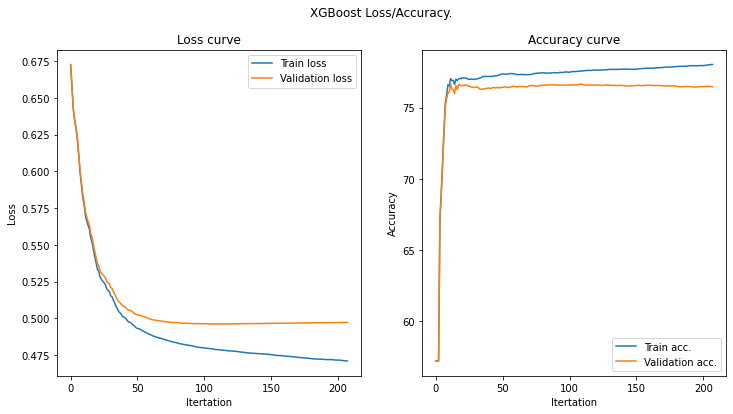

[I 2021-04-13 19:43:08,173] Trial 32 finished with value: 0.769225 and parameters: {'boosting': 'gbdt', 'n_estimators': 7771, 'learning_rate': 0.053908354321651676, 'max_depth': 45, 'num_leaves': 125, 'reg_alpha': 2.1278074980749007, 'reg_lambda': 6.919366156893977, 'feature_fraction': 0.3715945571113571, 'min_child_samples': 69, 'bagging_freq': 4023, 'bagging_fraction': 0.7951496202732298, 'max_bin': 686}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769225
--------------------> Trial 33 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.29522634081499793
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning

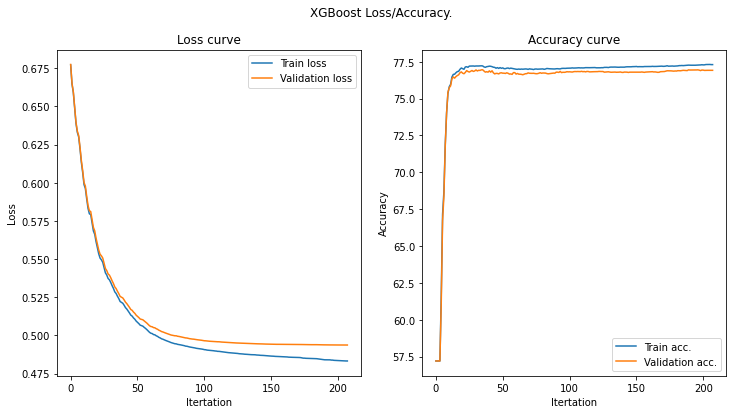

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.29522634081499793
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be 

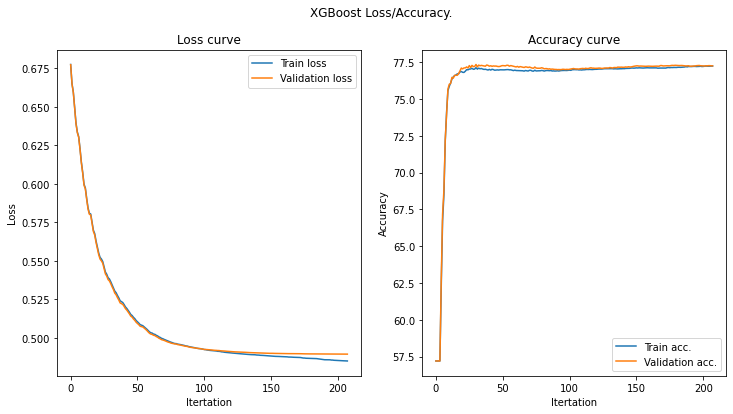

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.29522634081499793
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be 

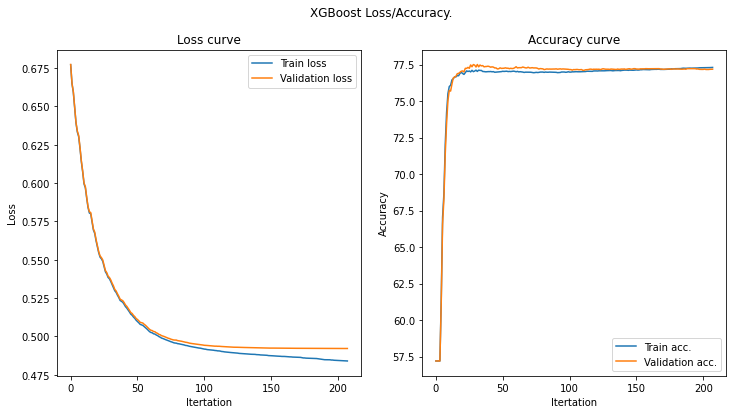

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.29522634081499793
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be 

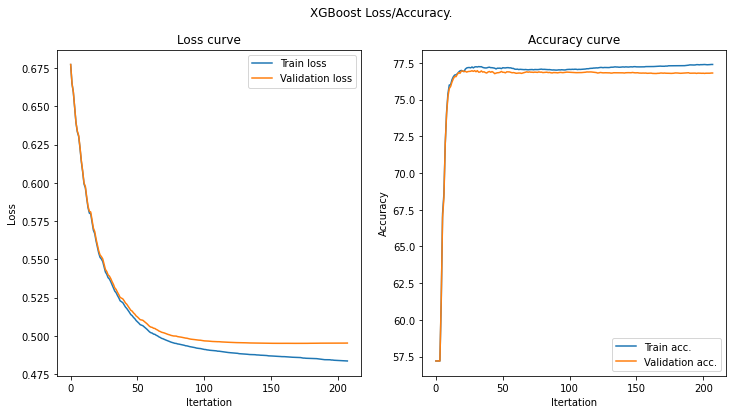

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.29522634081499793
[LightGBM] [Warning] bagging_fraction is set=0.7772494446802792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7772494446802792
[LightGBM] [Warning] bagging_freq is set=6721, subsample_freq=0 will be ignored. Current value: bagging_freq=6721
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.29522634081499793, colsample_bytree=1.0 will be 

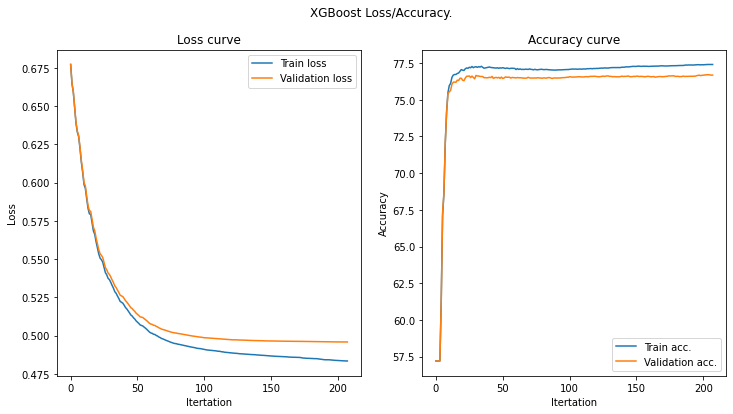

[I 2021-04-13 19:43:22,830] Trial 33 finished with value: 0.768825 and parameters: {'boosting': 'gbdt', 'n_estimators': 13206, 'learning_rate': 0.04339391418409913, 'max_depth': 41, 'num_leaves': 111, 'reg_alpha': 4.967295995494435, 'reg_lambda': 6.0504496676015025, 'feature_fraction': 0.29522634081499793, 'min_child_samples': 107, 'bagging_freq': 6721, 'bagging_fraction': 0.7772494446802792, 'max_bin': 378}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.768825
--------------------> Trial 34 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5196395701503966
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feat

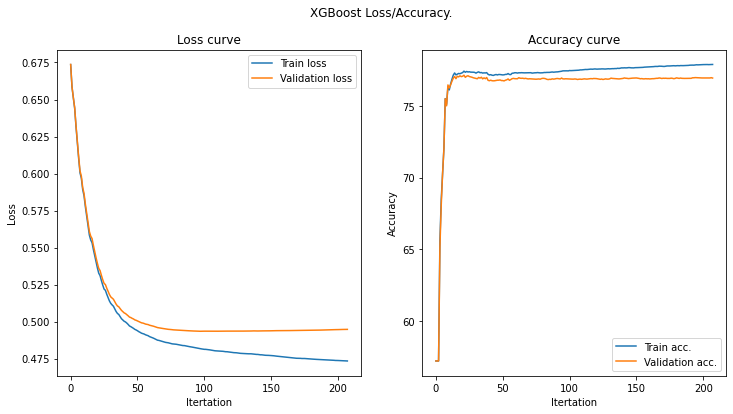

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5196395701503966
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored

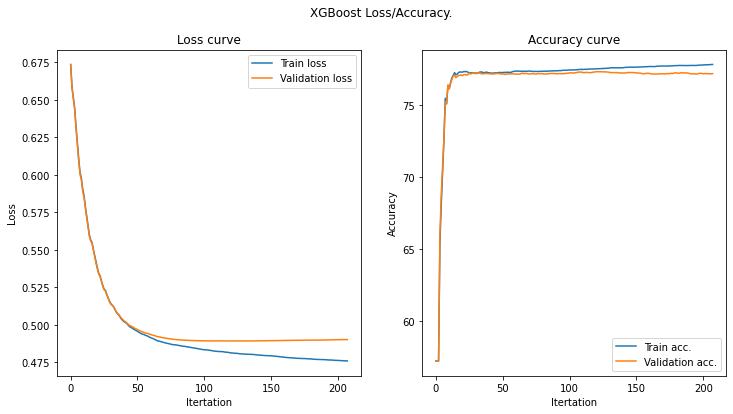

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5196395701503966
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored

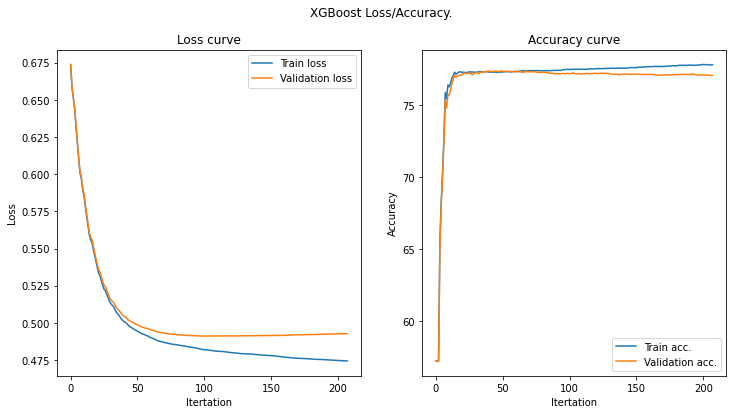

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5196395701503966
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored

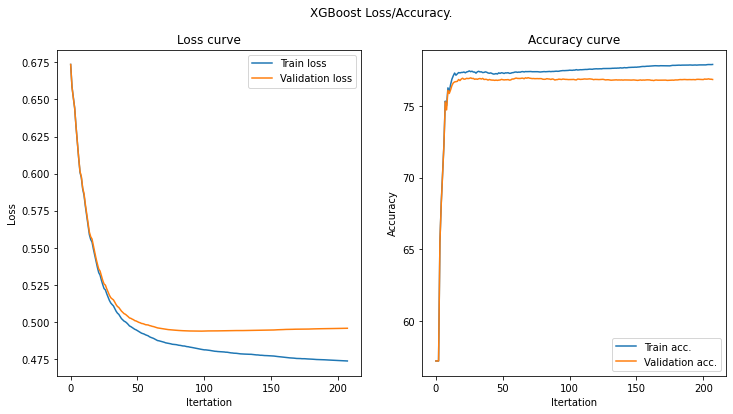

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5196395701503966
[LightGBM] [Warning] bagging_fraction is set=0.681144272413312, subsample=1.0 will be ignored. Current value: bagging_fraction=0.681144272413312
[LightGBM] [Warning] bagging_freq is set=3232, subsample_freq=0 will be ignored. Current value: bagging_freq=3232
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5196395701503966, colsample_bytree=1.0 will be ignored

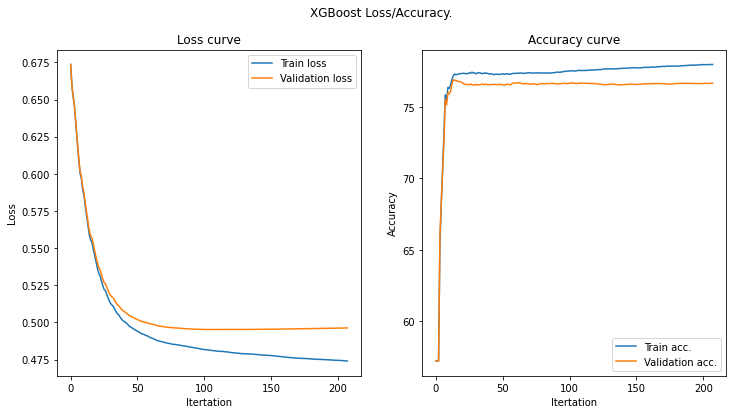

[I 2021-04-13 19:43:40,544] Trial 34 finished with value: 0.769775 and parameters: {'boosting': 'gbdt', 'n_estimators': 9096, 'learning_rate': 0.048473529951916214, 'max_depth': 60, 'num_leaves': 105, 'reg_alpha': 3.064599916464635, 'reg_lambda': 7.939979721594466, 'feature_fraction': 0.5196395701503966, 'min_child_samples': 5, 'bagging_freq': 3232, 'bagging_fraction': 0.681144272413312, 'max_bin': 570}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769775
--------------------> Trial 35 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5273116713488062
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] 

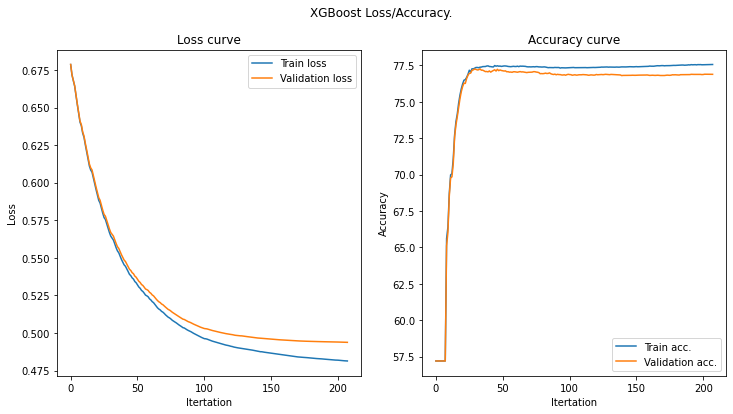

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5273116713488062
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ign

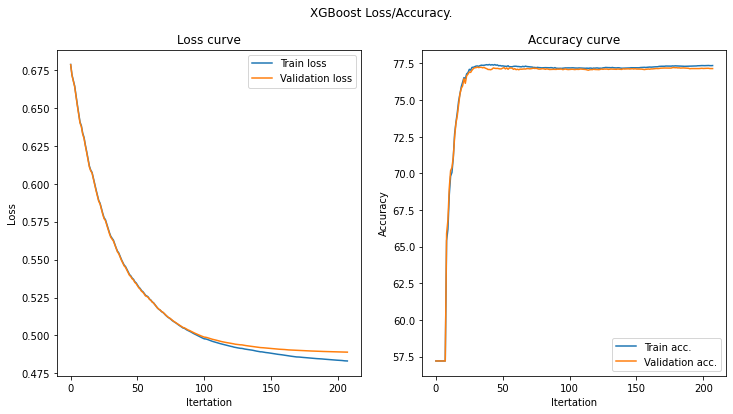

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5273116713488062
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ign

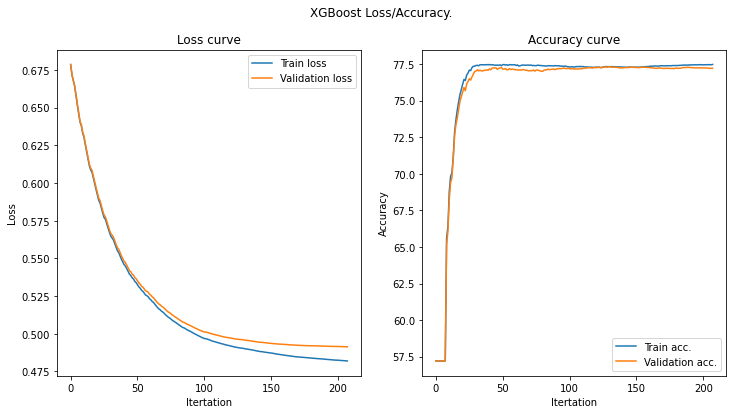

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5273116713488062
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ign

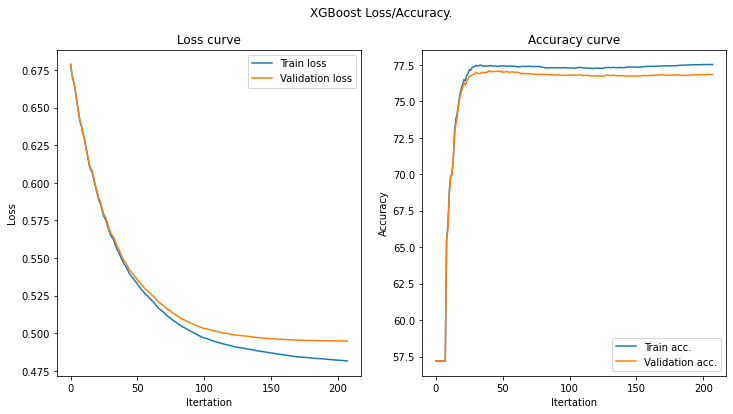

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5273116713488062
[LightGBM] [Warning] bagging_fraction is set=0.8910336153958737, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8910336153958737
[LightGBM] [Warning] bagging_freq is set=3110, subsample_freq=0 will be ignored. Current value: bagging_freq=3110
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5273116713488062, colsample_bytree=1.0 will be ign

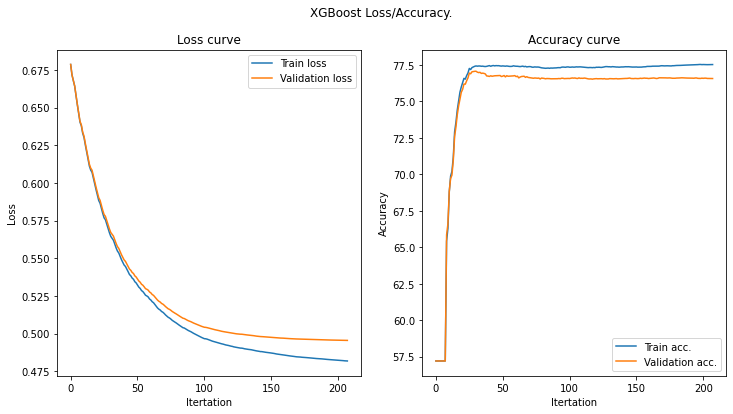

[I 2021-04-13 19:43:57,840] Trial 35 finished with value: 0.7691 and parameters: {'boosting': 'gbdt', 'n_estimators': 9056, 'learning_rate': 0.02135303101891593, 'max_depth': 61, 'num_leaves': 104, 'reg_alpha': 3.2271830987230947, 'reg_lambda': 7.476053207497073, 'feature_fraction': 0.5273116713488062, 'min_child_samples': 5, 'bagging_freq': 3110, 'bagging_fraction': 0.8910336153958737, 'max_bin': 575}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7691
--------------------> Trial 36 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4070141106779941
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] fe

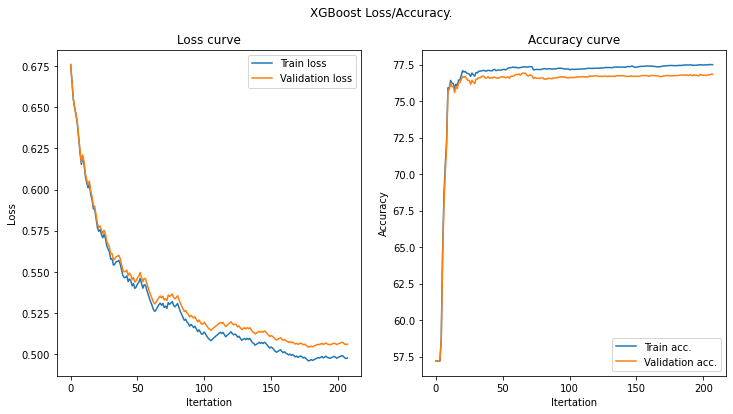

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4070141106779941
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ign

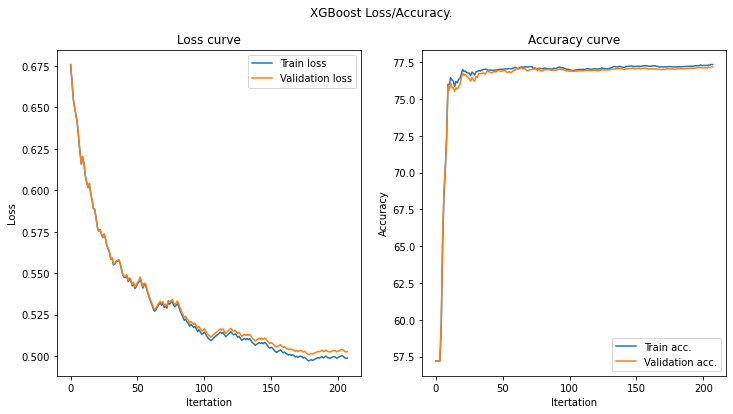

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4070141106779941
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ign

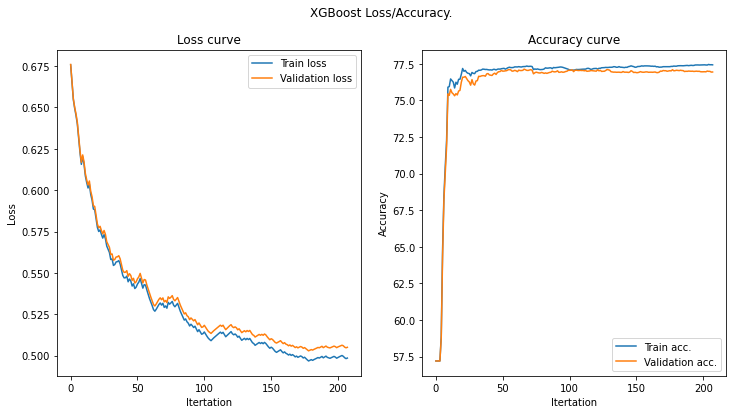

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4070141106779941
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ign

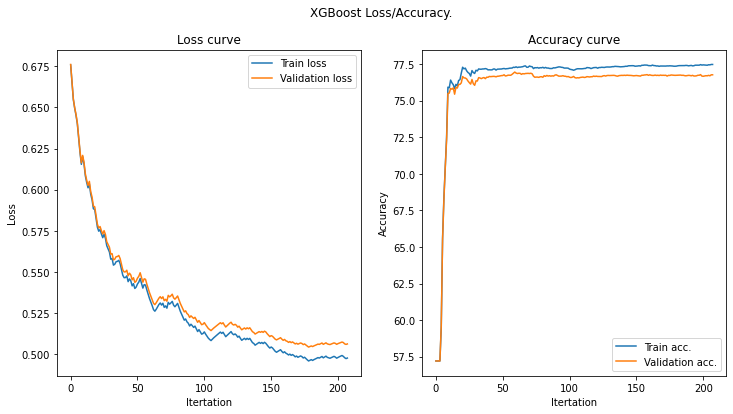

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4070141106779941
[LightGBM] [Warning] bagging_fraction is set=0.8442742573319266, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8442742573319266
[LightGBM] [Warning] bagging_freq is set=4790, subsample_freq=0 will be ignored. Current value: bagging_freq=4790
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.4070141106779941, colsample_bytree=1.0 will be ign

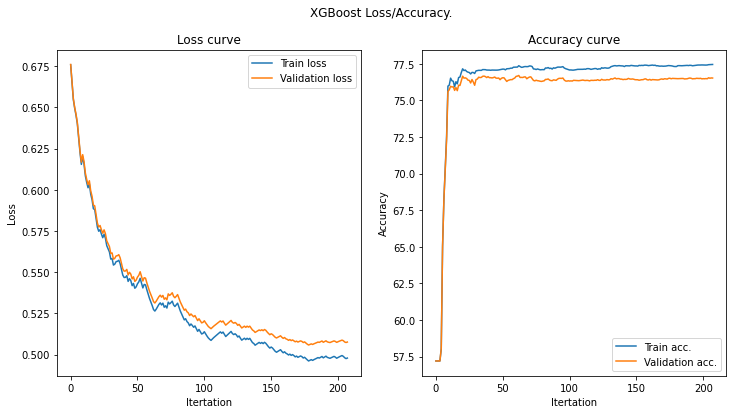

[I 2021-04-13 19:44:45,202] Trial 36 finished with value: 0.76875 and parameters: {'boosting': 'dart', 'n_estimators': 5797, 'learning_rate': 0.035389230703652685, 'max_depth': 71, 'num_leaves': 114, 'reg_alpha': 1.6398673828941979, 'reg_lambda': 5.442128346698639, 'feature_fraction': 0.4070141106779941, 'min_child_samples': 48, 'bagging_freq': 4790, 'bagging_fraction': 0.8442742573319266, 'max_bin': 641}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.76875
--------------------> Trial 37 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49129453034686704
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

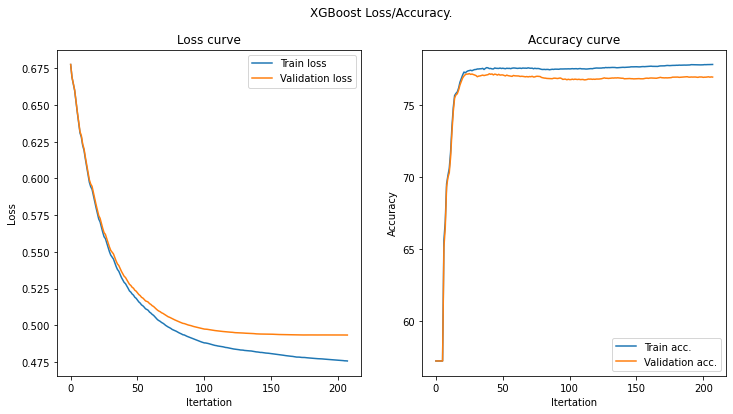

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49129453034686704
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be 

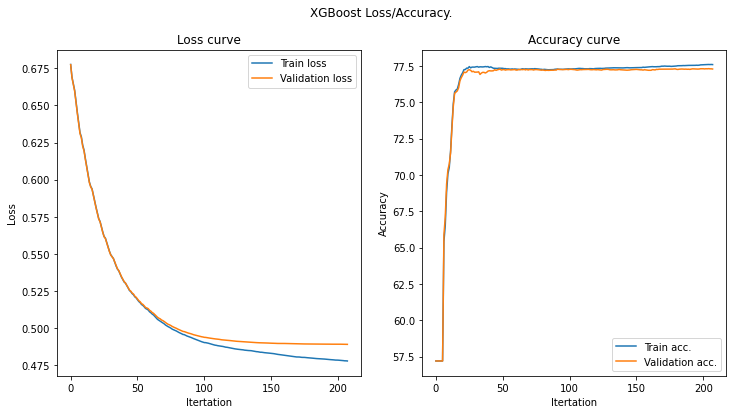

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49129453034686704
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be 

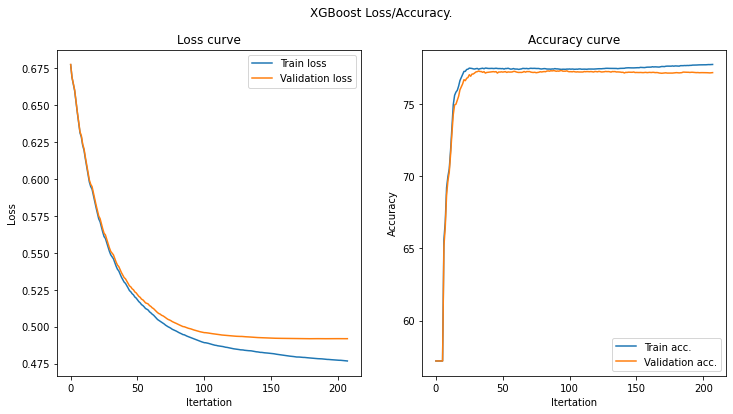

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49129453034686704
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be 

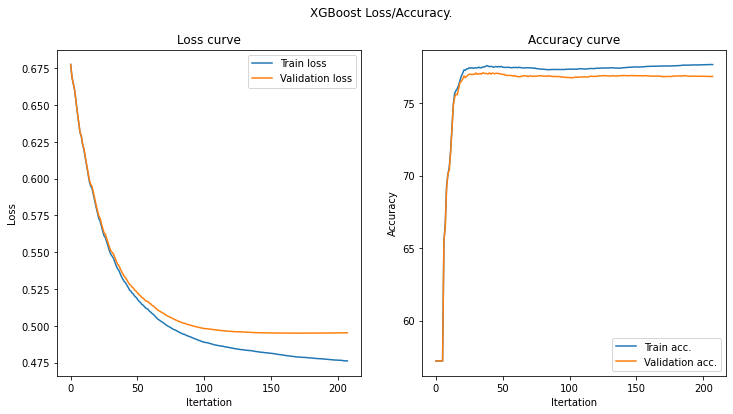

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.49129453034686704
[LightGBM] [Warning] bagging_fraction is set=0.7537268956193606, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7537268956193606
[LightGBM] [Warning] bagging_freq is set=1715, subsample_freq=0 will be ignored. Current value: bagging_freq=1715
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.49129453034686704, colsample_bytree=1.0 will be 

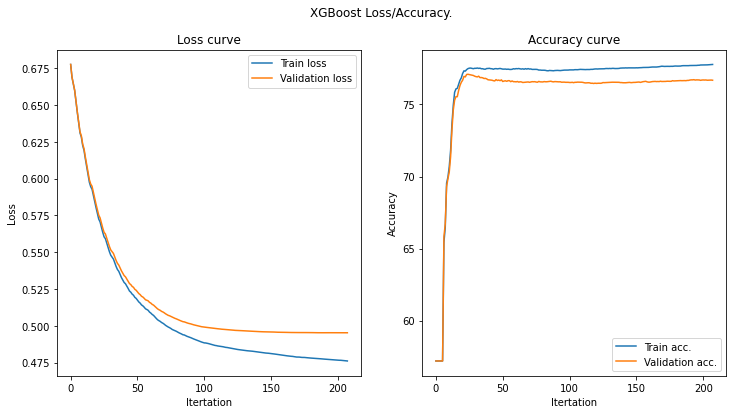

[I 2021-04-13 19:45:02,946] Trial 37 finished with value: 0.7692375 and parameters: {'boosting': 'gbdt', 'n_estimators': 6675, 'learning_rate': 0.026762959386708533, 'max_depth': 57, 'num_leaves': 123, 'reg_alpha': 2.4579478188071504, 'reg_lambda': 4.430772142903129, 'feature_fraction': 0.49129453034686704, 'min_child_samples': 19, 'bagging_freq': 1715, 'bagging_fraction': 0.7537268956193606, 'max_bin': 775}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7692375
--------------------> Trial 38 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42579443008965184
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] featu

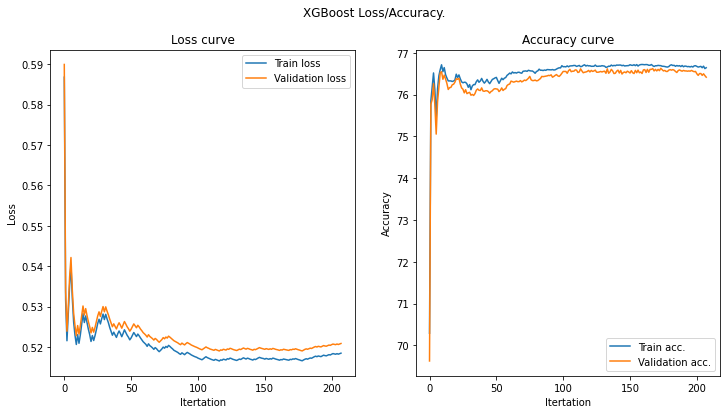

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42579443008965184
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored.

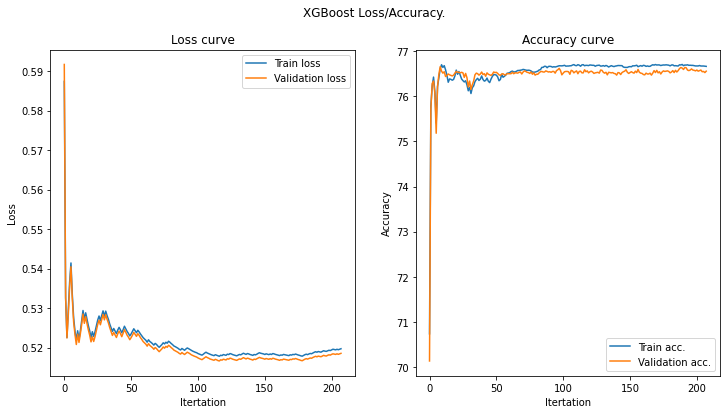

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42579443008965184
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored.

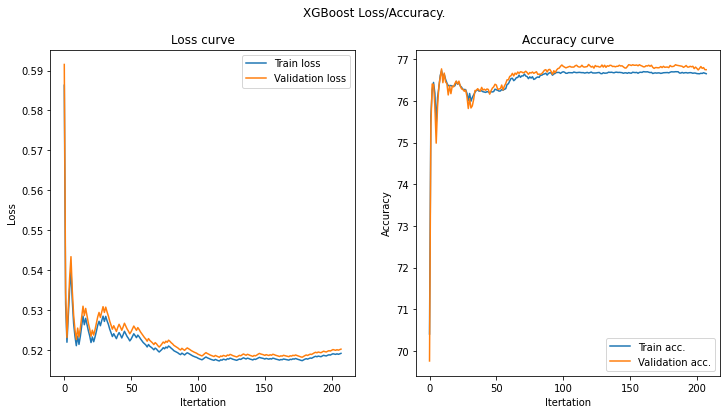

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42579443008965184
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored.

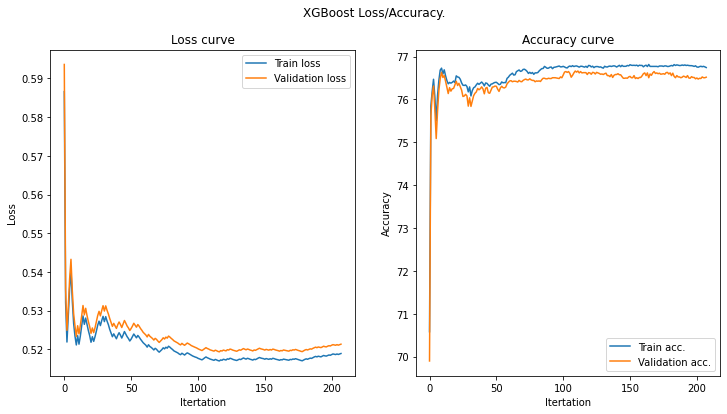

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.42579443008965184
[LightGBM] [Warning] bagging_fraction is set=0.8989437078297128, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8989437078297128
[LightGBM] [Warning] bagging_freq is set=3539, subsample_freq=0 will be ignored. Current value: bagging_freq=3539
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.42579443008965184, colsample_bytree=1.0 will be ignored.

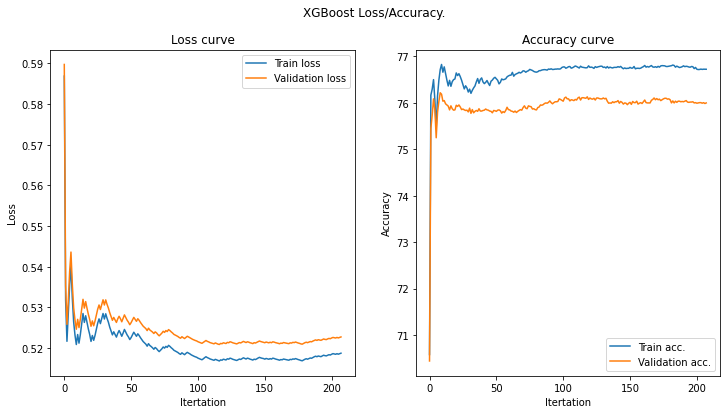

[I 2021-04-13 19:45:18,178] Trial 38 finished with value: 0.765125 and parameters: {'boosting': 'rf', 'n_estimators': 4389, 'learning_rate': 0.046488457496294405, 'max_depth': 47, 'num_leaves': 85, 'reg_alpha': 4.464304316383824, 'reg_lambda': 8.025601363902545, 'feature_fraction': 0.42579443008965184, 'min_child_samples': 65, 'bagging_freq': 3539, 'bagging_fraction': 0.8989437078297128, 'max_bin': 681}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.765125
--------------------> Trial 39 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5666903671502553
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] 

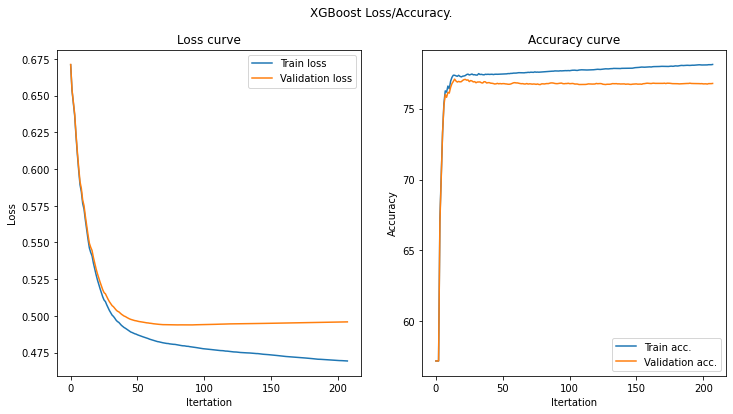

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5666903671502553
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ign

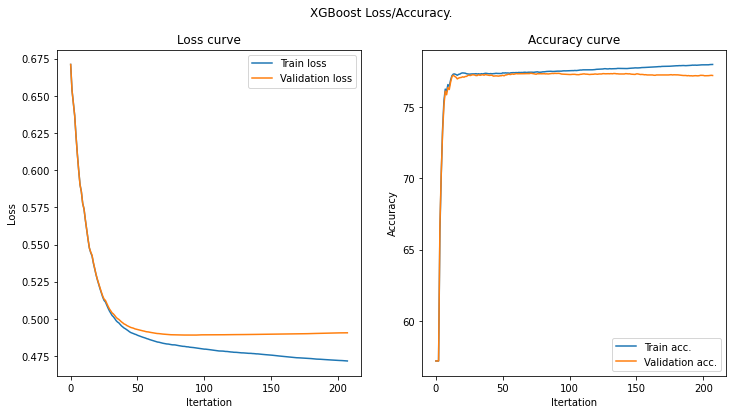

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5666903671502553
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ign

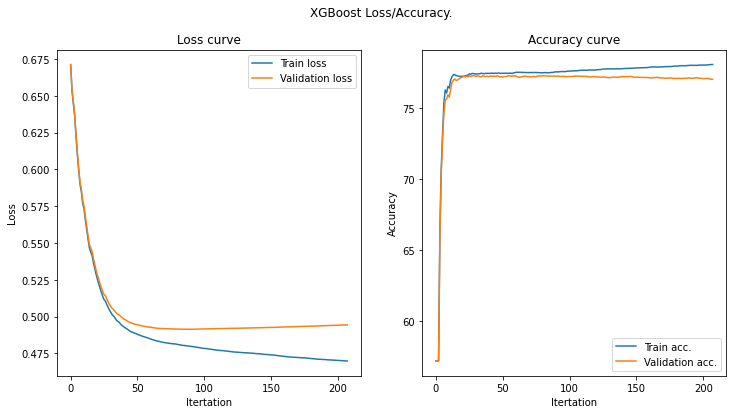

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5666903671502553
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ign

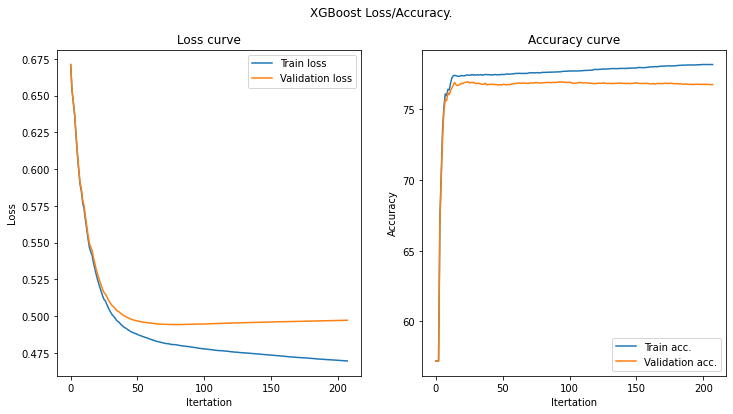

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5666903671502553
[LightGBM] [Warning] bagging_fraction is set=0.6998981987088349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6998981987088349
[LightGBM] [Warning] bagging_freq is set=5975, subsample_freq=0 will be ignored. Current value: bagging_freq=5975
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5666903671502553, colsample_bytree=1.0 will be ign

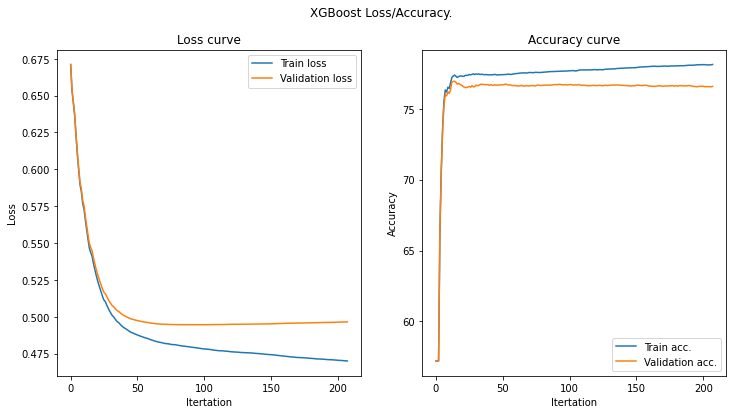

[I 2021-04-13 19:45:35,873] Trial 39 finished with value: 0.7696125 and parameters: {'boosting': 'gbdt', 'n_estimators': 8087, 'learning_rate': 0.055292513835922805, 'max_depth': 33, 'num_leaves': 101, 'reg_alpha': 2.81607184060546, 'reg_lambda': 7.006352205300603, 'feature_fraction': 0.5666903671502553, 'min_child_samples': 33, 'bagging_freq': 5975, 'bagging_fraction': 0.6998981987088349, 'max_bin': 553}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7696125
--------------------> Trial 40 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31646368721789403
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warnin

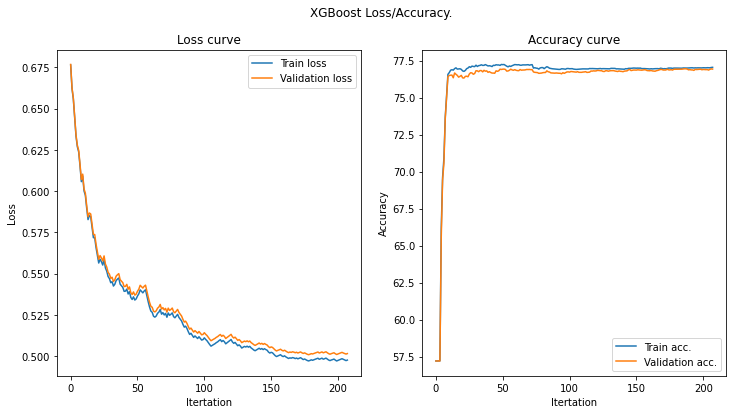

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31646368721789403
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be 

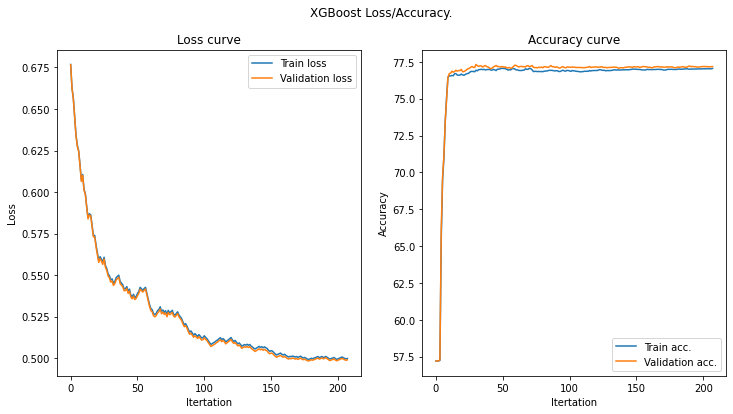

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31646368721789403
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be 

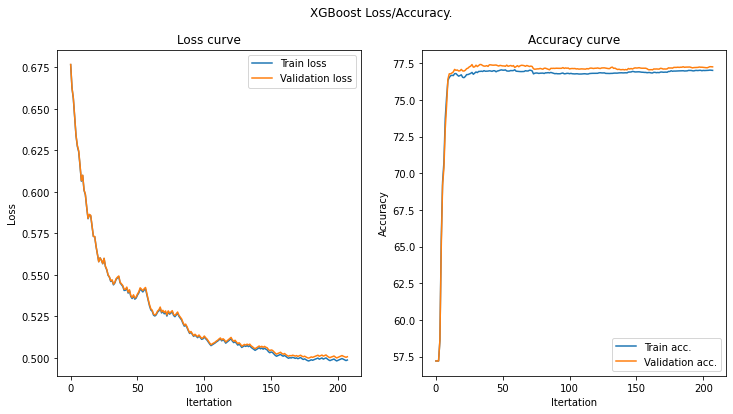

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31646368721789403
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be 

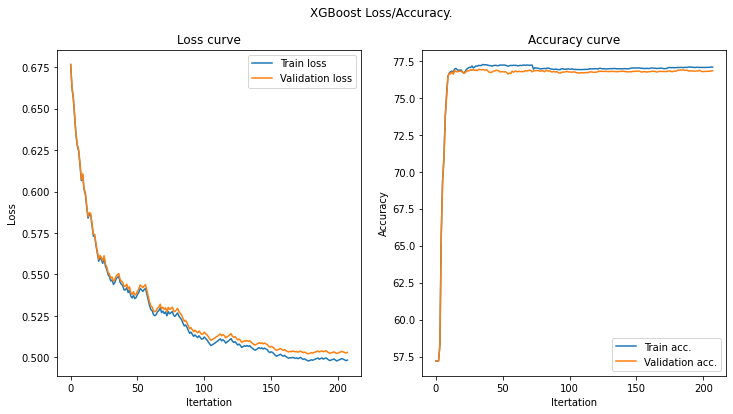

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.31646368721789403
[LightGBM] [Warning] bagging_fraction is set=0.5314510865454747, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5314510865454747
[LightGBM] [Warning] bagging_freq is set=7556, subsample_freq=0 will be ignored. Current value: bagging_freq=7556
[LightGBM] [Warning] boosting is set=dart, boosting_type=gbdt will be ignored. Current value: boosting=dart
[LightGBM] [Warning] feature_fraction is set=0.31646368721789403, colsample_bytree=1.0 will be 

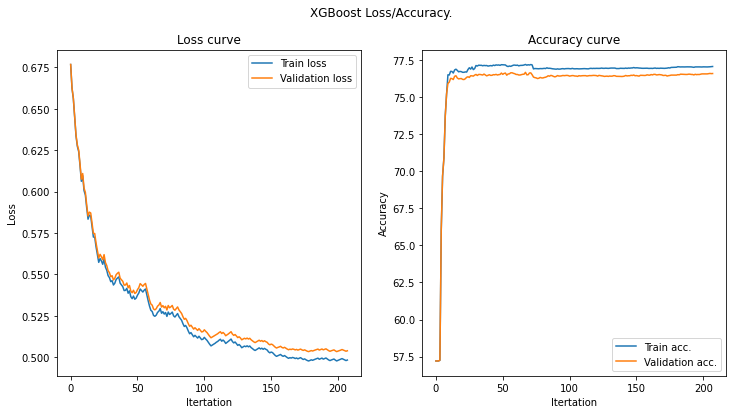

[I 2021-04-13 19:46:10,038] Trial 40 finished with value: 0.7689125 and parameters: {'boosting': 'dart', 'n_estimators': 14617, 'learning_rate': 0.049723133907763346, 'max_depth': 69, 'num_leaves': 107, 'reg_alpha': 3.7381210066028534, 'reg_lambda': 6.560405588753953, 'feature_fraction': 0.31646368721789403, 'min_child_samples': 122, 'bagging_freq': 7556, 'bagging_fraction': 0.5314510865454747, 'max_bin': 465}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7689125
--------------------> Trial 41 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5150744848616498
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

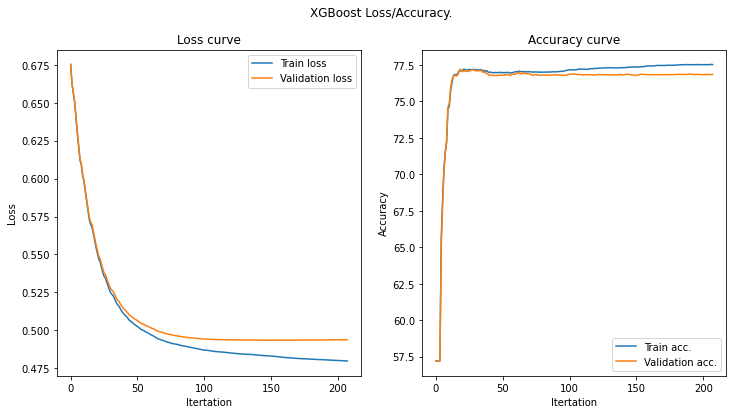

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5150744848616498
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ign

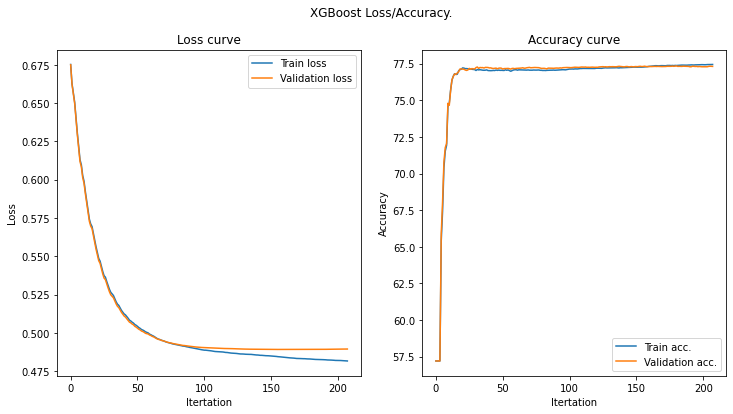

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5150744848616498
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ign

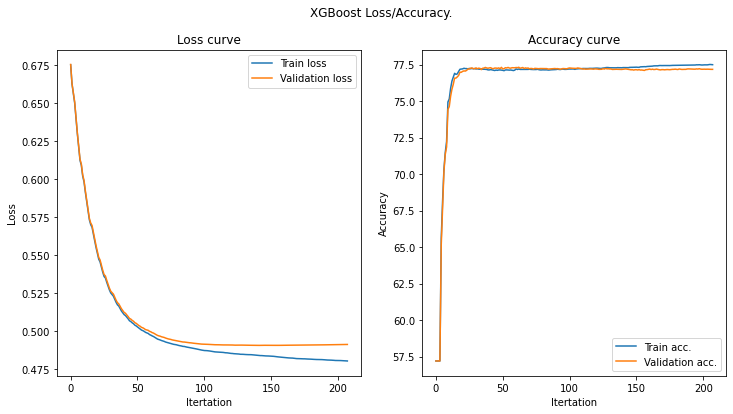

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5150744848616498
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ign

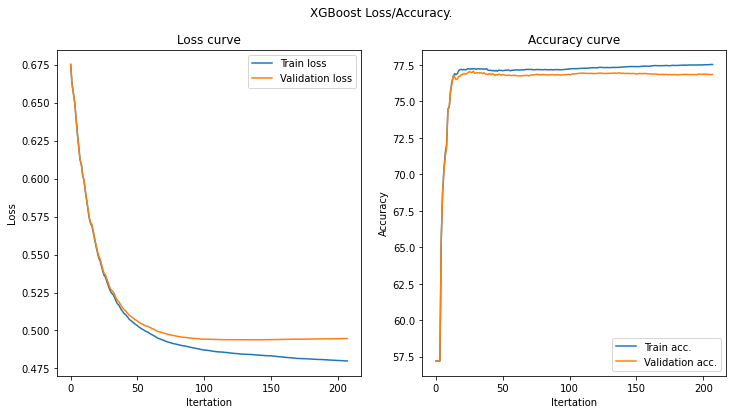

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5150744848616498
[LightGBM] [Warning] bagging_fraction is set=0.6667322066647073, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6667322066647073
[LightGBM] [Warning] bagging_freq is set=4608, subsample_freq=0 will be ignored. Current value: bagging_freq=4608
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5150744848616498, colsample_bytree=1.0 will be ign

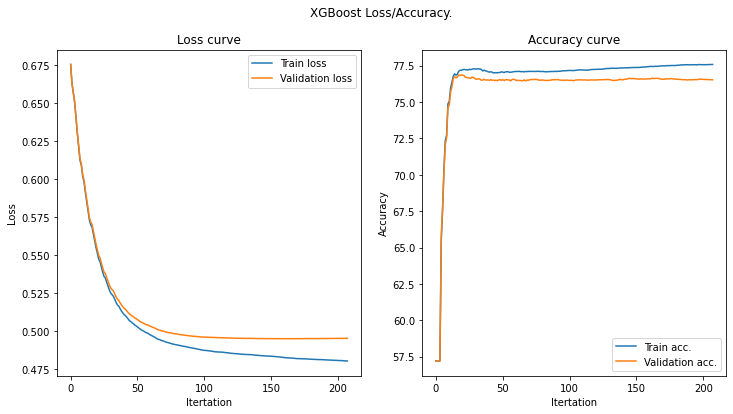

[I 2021-04-13 19:46:27,027] Trial 41 finished with value: 0.7696625 and parameters: {'boosting': 'gbdt', 'n_estimators': 9470, 'learning_rate': 0.03993737314769194, 'max_depth': 59, 'num_leaves': 108, 'reg_alpha': 5.146200495144756, 'reg_lambda': 8.883113899346796, 'feature_fraction': 0.5150744848616498, 'min_child_samples': 97, 'bagging_freq': 4608, 'bagging_fraction': 0.6667322066647073, 'max_bin': 480}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7696625
--------------------> Trial 42 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7162957271855949
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

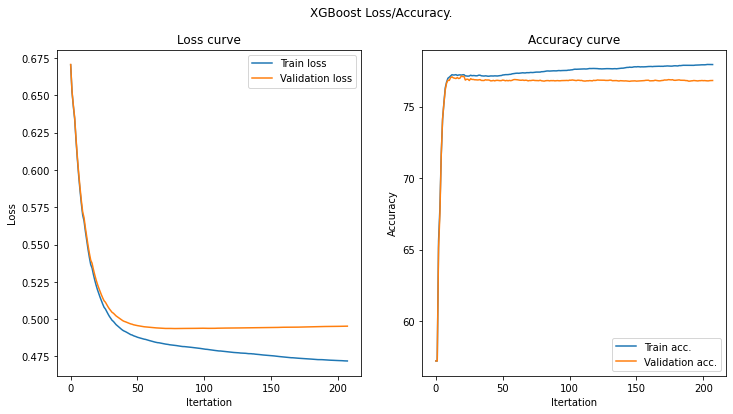

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7162957271855949
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ign

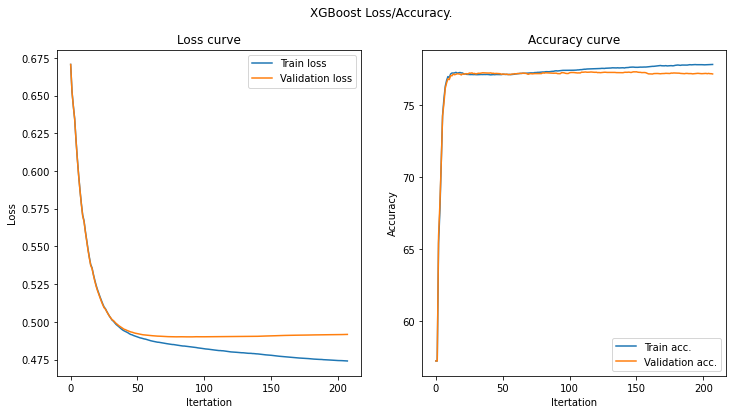

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7162957271855949
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ign

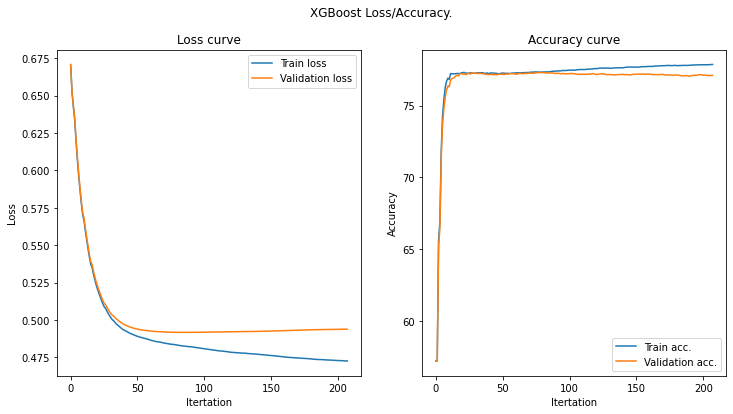

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7162957271855949
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ign

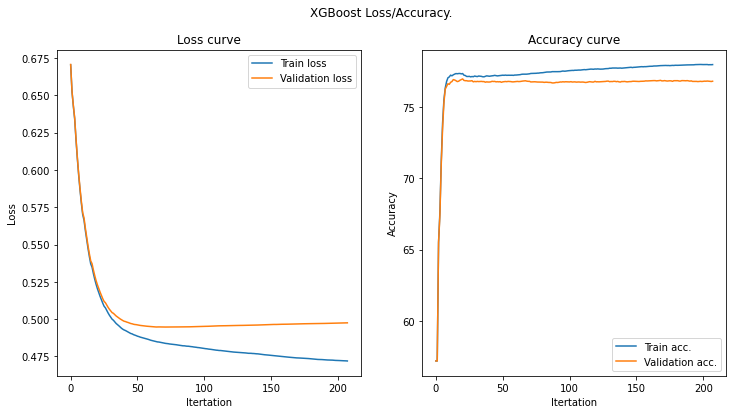

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7162957271855949
[LightGBM] [Warning] bagging_fraction is set=0.7657419044266381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7657419044266381
[LightGBM] [Warning] bagging_freq is set=8596, subsample_freq=0 will be ignored. Current value: bagging_freq=8596
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.7162957271855949, colsample_bytree=1.0 will be ign

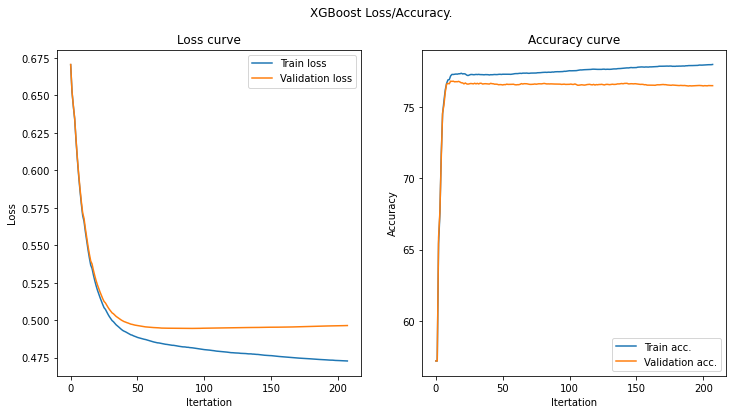

[I 2021-04-13 19:46:45,838] Trial 42 finished with value: 0.769075 and parameters: {'boosting': 'gbdt', 'n_estimators': 6675, 'learning_rate': 0.05756922248098063, 'max_depth': 49, 'num_leaves': 115, 'reg_alpha': 6.678001075468799, 'reg_lambda': 7.298663529651189, 'feature_fraction': 0.7162957271855949, 'min_child_samples': 77, 'bagging_freq': 8596, 'bagging_fraction': 0.7657419044266381, 'max_bin': 587}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769075
--------------------> Trial 43 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4630481400391929
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feat

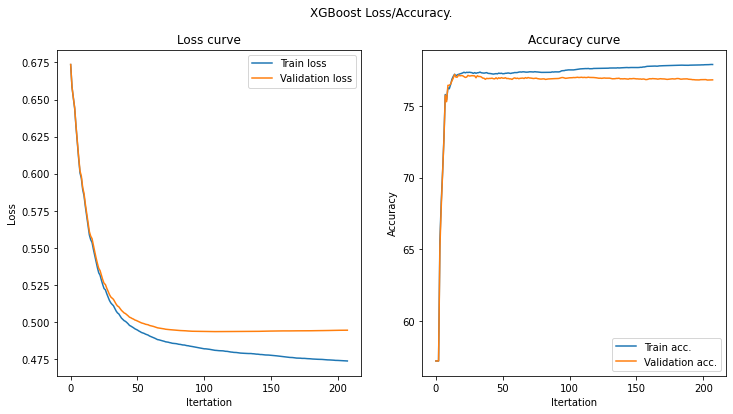

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4630481400391929
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored

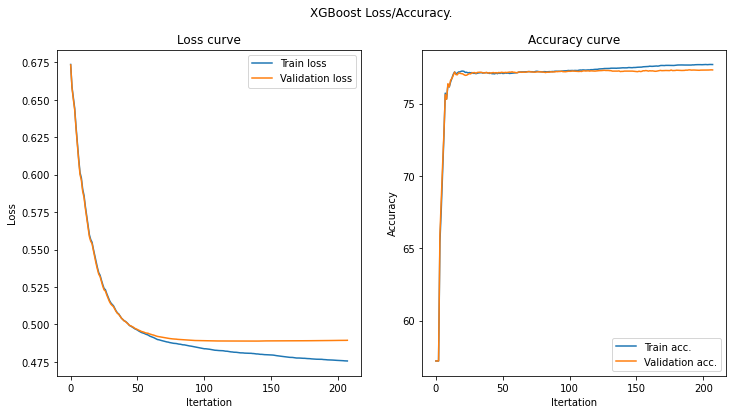

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4630481400391929
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored

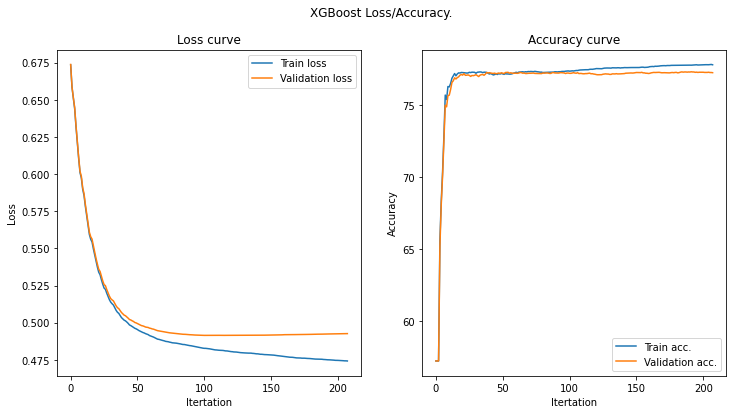

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4630481400391929
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored

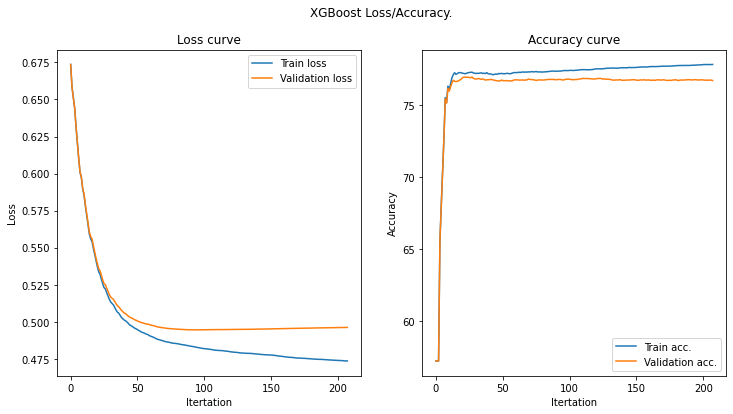

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4630481400391929
[LightGBM] [Warning] bagging_fraction is set=0.840979072829967, subsample=1.0 will be ignored. Current value: bagging_fraction=0.840979072829967
[LightGBM] [Warning] bagging_freq is set=1361, subsample_freq=0 will be ignored. Current value: bagging_freq=1361
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.4630481400391929, colsample_bytree=1.0 will be ignored

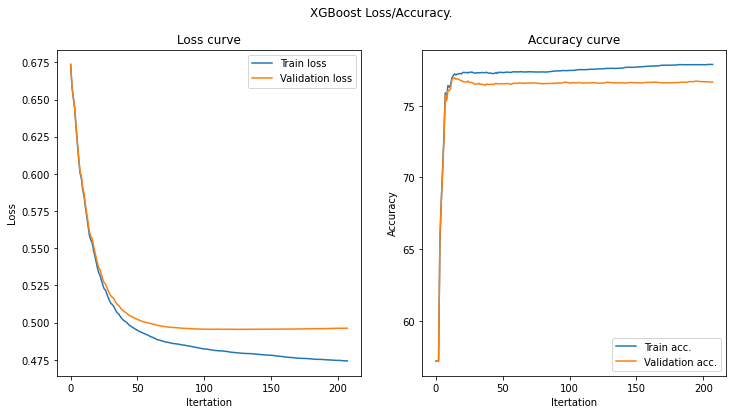

[I 2021-04-13 19:47:03,398] Trial 43 finished with value: 0.7697125 and parameters: {'boosting': 'gbdt', 'n_estimators': 12659, 'learning_rate': 0.048633766865204875, 'max_depth': 40, 'num_leaves': 109, 'reg_alpha': 4.063326671789745, 'reg_lambda': 9.270180380801536, 'feature_fraction': 0.4630481400391929, 'min_child_samples': 59, 'bagging_freq': 1361, 'bagging_fraction': 0.840979072829967, 'max_bin': 623}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7697125
--------------------> Trial 44 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6169691438305894
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning]

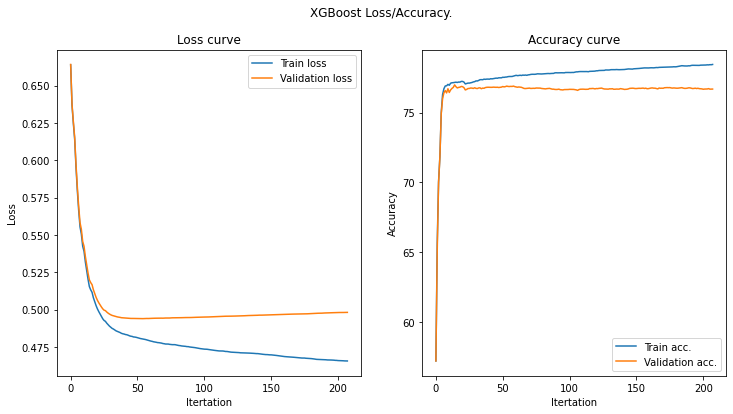

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6169691438305894
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ign

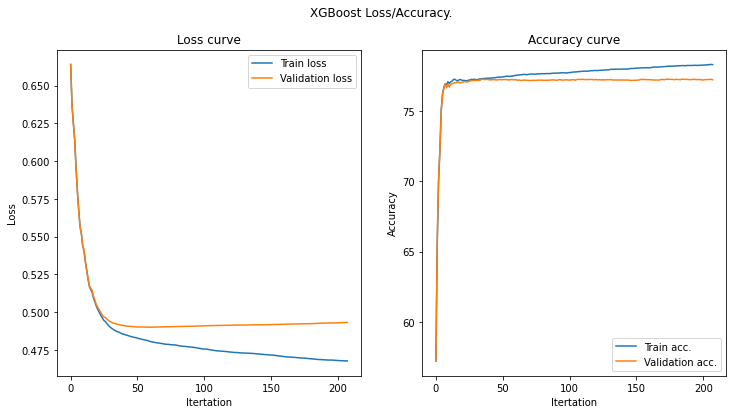

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6169691438305894
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ign

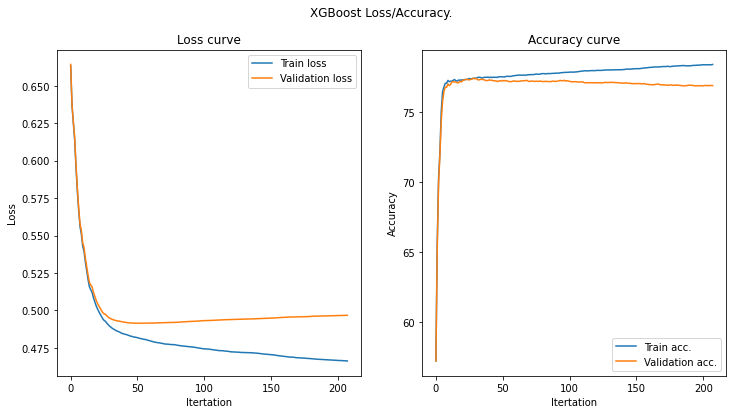

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6169691438305894
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ign

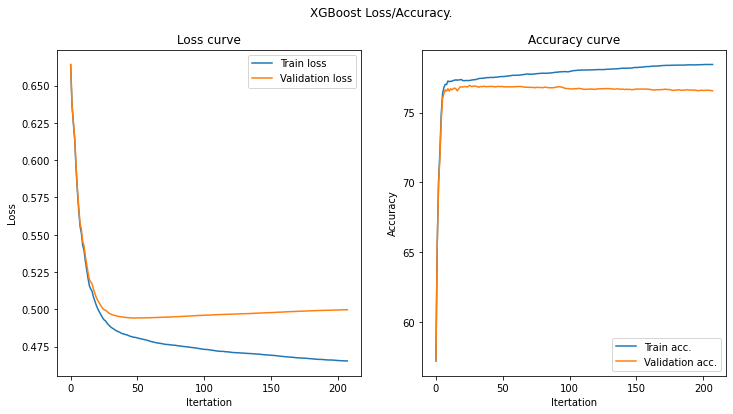

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6169691438305894
[LightGBM] [Warning] bagging_fraction is set=0.7023031089566855, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7023031089566855
[LightGBM] [Warning] bagging_freq is set=2403, subsample_freq=0 will be ignored. Current value: bagging_freq=2403
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6169691438305894, colsample_bytree=1.0 will be ign

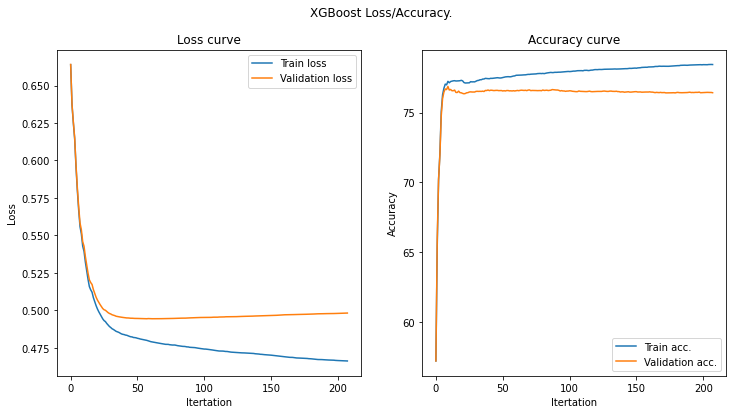

[I 2021-04-13 19:47:21,924] Trial 44 finished with value: 0.76865 and parameters: {'boosting': 'gbdt', 'n_estimators': 8754, 'learning_rate': 0.09126006070960832, 'max_depth': 77, 'num_leaves': 121, 'reg_alpha': 5.046331617823449, 'reg_lambda': 8.037928856093107, 'feature_fraction': 0.6169691438305894, 'min_child_samples': 3, 'bagging_freq': 2403, 'bagging_fraction': 0.7023031089566855, 'max_bin': 519}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.76865
--------------------> Trial 45 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3803573547660661
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] f

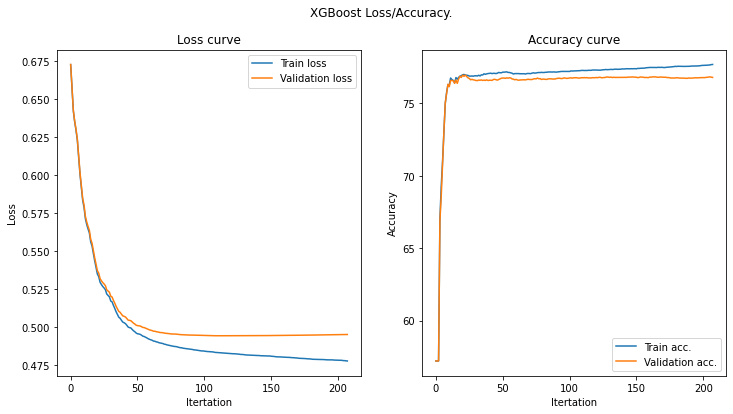

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3803573547660661
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ign

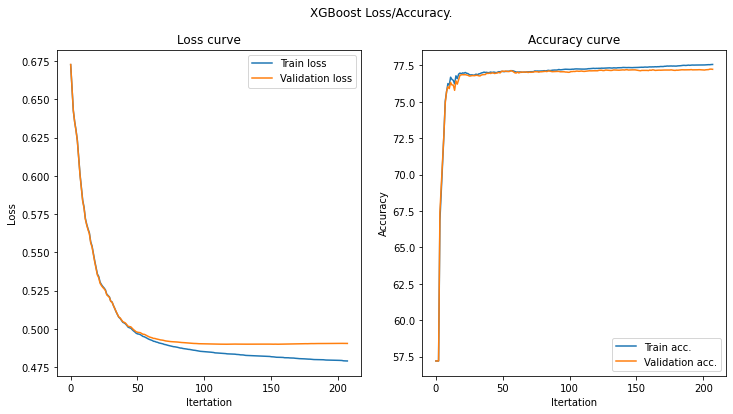

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3803573547660661
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ign

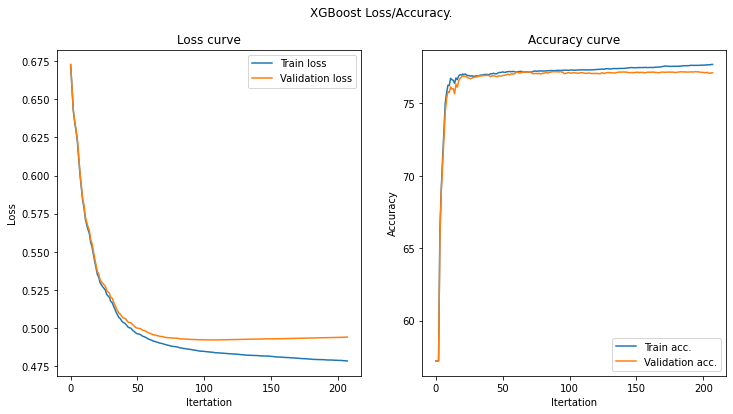

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3803573547660661
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ign

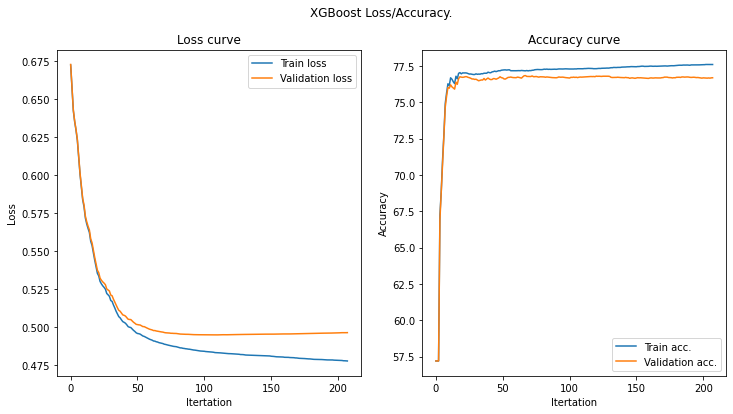

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.3803573547660661
[LightGBM] [Warning] bagging_fraction is set=0.6399353380341418, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6399353380341418
[LightGBM] [Warning] bagging_freq is set=5379, subsample_freq=0 will be ignored. Current value: bagging_freq=5379
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.3803573547660661, colsample_bytree=1.0 will be ign

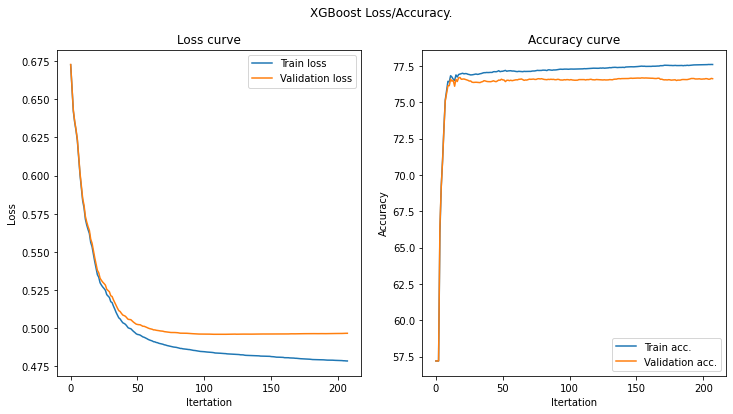

[I 2021-04-13 19:47:38,020] Trial 45 finished with value: 0.768425 and parameters: {'boosting': 'gbdt', 'n_estimators': 10104, 'learning_rate': 0.05373274848989361, 'max_depth': 68, 'num_leaves': 99, 'reg_alpha': 3.1289888684919984, 'reg_lambda': 8.042879360299775, 'feature_fraction': 0.3803573547660661, 'min_child_samples': 48, 'bagging_freq': 5379, 'bagging_fraction': 0.6399353380341418, 'max_bin': 328}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.768425
--------------------> Trial 46 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.21253576022119905
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning

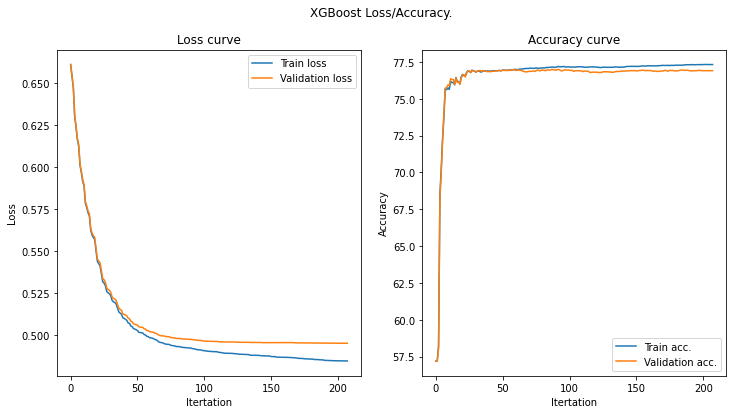

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.21253576022119905
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be 

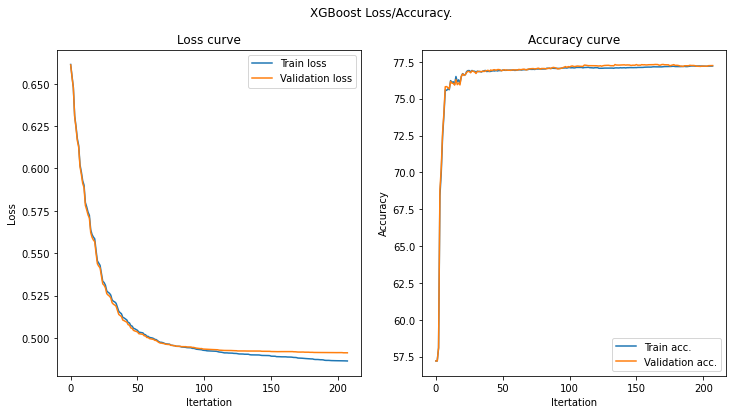

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.21253576022119905
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be 

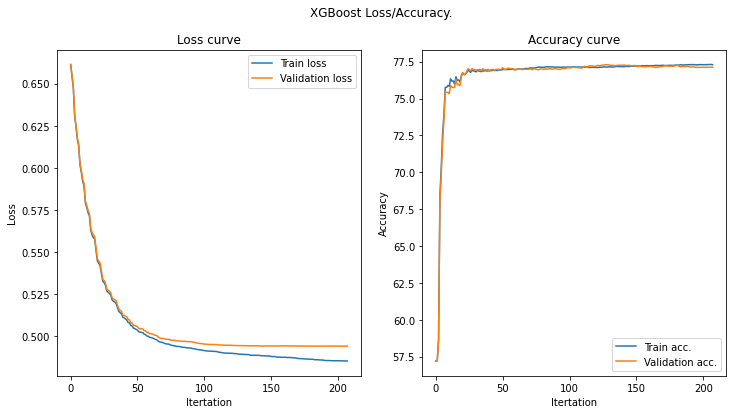

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.21253576022119905
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be 

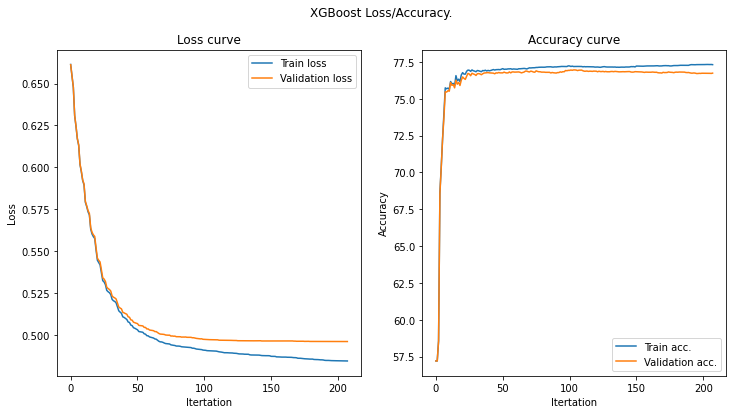

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.21253576022119905
[LightGBM] [Warning] bagging_fraction is set=0.7377410771827055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7377410771827055
[LightGBM] [Warning] bagging_freq is set=3419, subsample_freq=0 will be ignored. Current value: bagging_freq=3419
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.21253576022119905, colsample_bytree=1.0 will be 

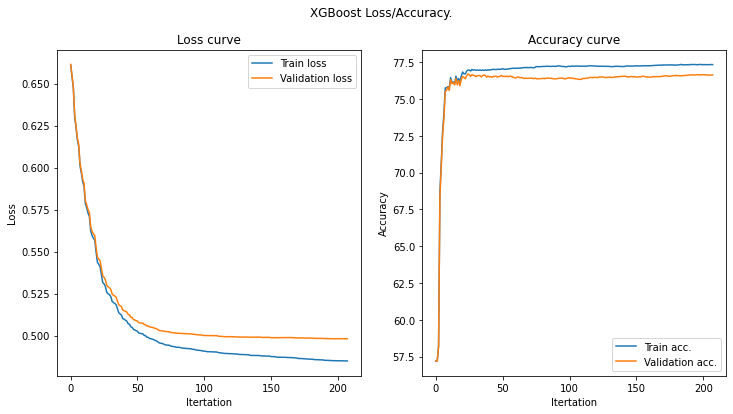

[I 2021-04-13 19:47:52,285] Trial 46 finished with value: 0.768925 and parameters: {'boosting': 'gbdt', 'n_estimators': 7086, 'learning_rate': 0.07217633241257765, 'max_depth': 64, 'num_leaves': 128, 'reg_alpha': 4.434691188308885, 'reg_lambda': 5.728001772384292, 'feature_fraction': 0.21253576022119905, 'min_child_samples': 17, 'bagging_freq': 3419, 'bagging_fraction': 0.7377410771827055, 'max_bin': 432}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.768925
--------------------> Trial 47 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6421581272617021
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] 

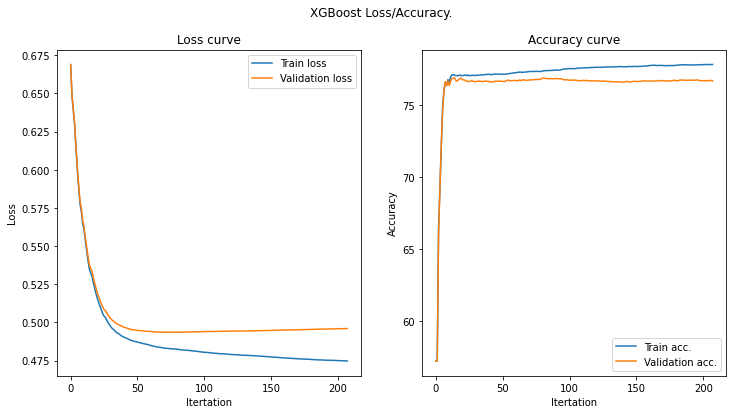

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6421581272617021
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ign

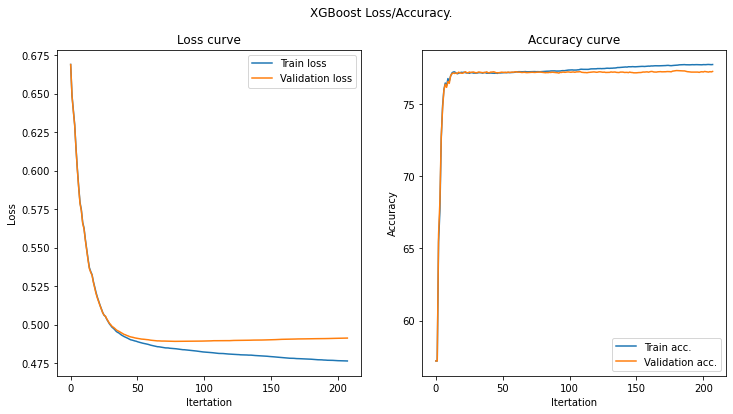

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6421581272617021
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ign

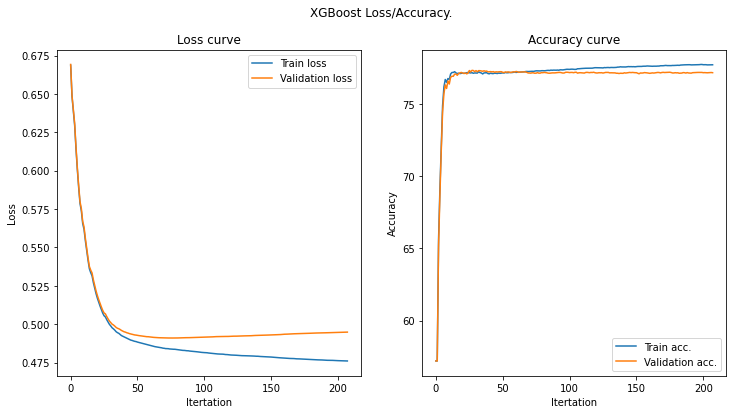

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6421581272617021
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ign

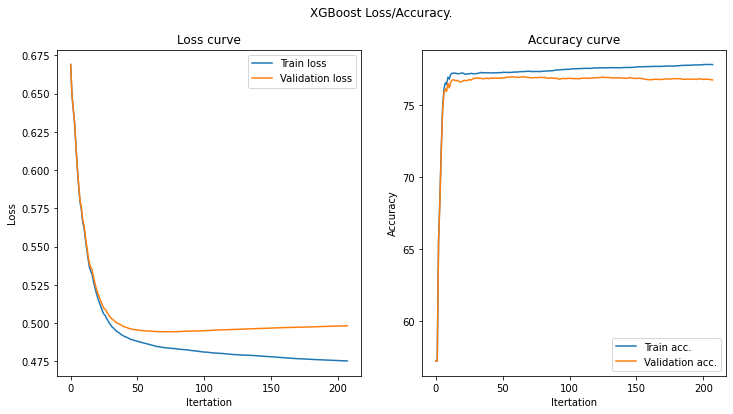

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6421581272617021
[LightGBM] [Warning] bagging_fraction is set=0.5515426319801495, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5515426319801495
[LightGBM] [Warning] bagging_freq is set=6996, subsample_freq=0 will be ignored. Current value: bagging_freq=6996
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6421581272617021, colsample_bytree=1.0 will be ign

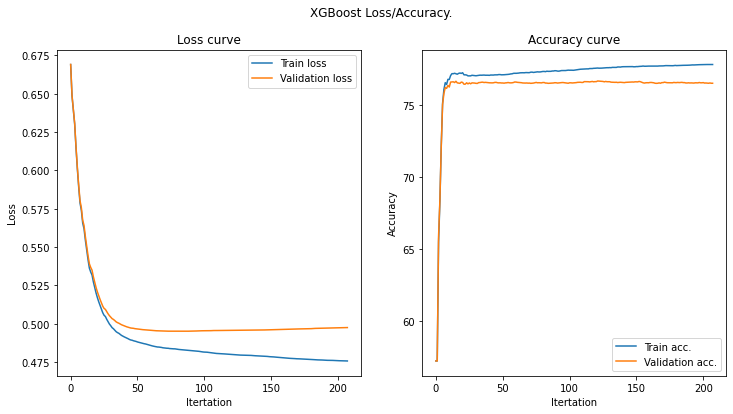

[I 2021-04-13 19:48:08,944] Trial 47 finished with value: 0.769 and parameters: {'boosting': 'gbdt', 'n_estimators': 14194, 'learning_rate': 0.06627578795149094, 'max_depth': 57, 'num_leaves': 91, 'reg_alpha': 5.3658357953914715, 'reg_lambda': 5.127658200516195, 'feature_fraction': 0.6421581272617021, 'min_child_samples': 34, 'bagging_freq': 6996, 'bagging_fraction': 0.5515426319801495, 'max_bin': 542}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769
--------------------> Trial 48 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5906580690570308
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] fea

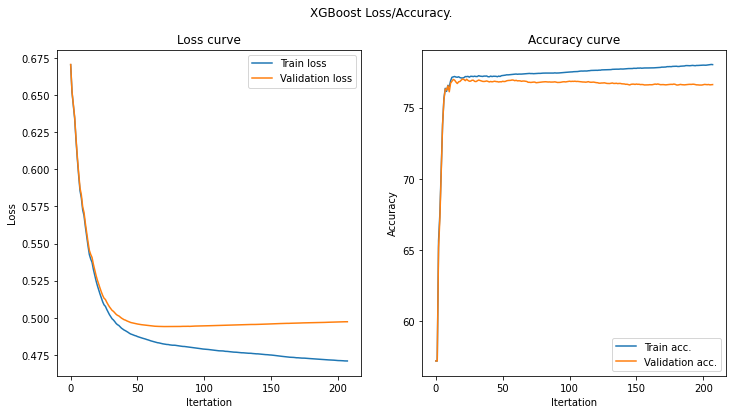

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5906580690570308
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ign

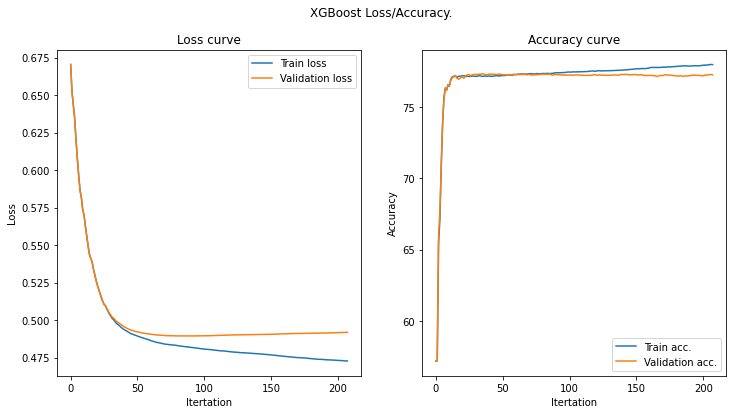

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5906580690570308
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ign

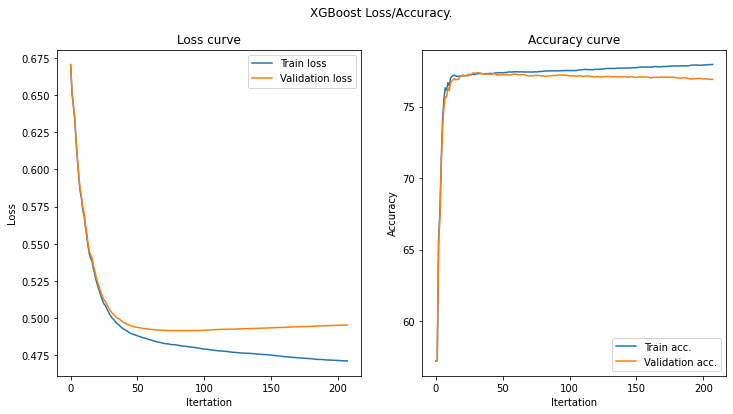

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5906580690570308
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ign

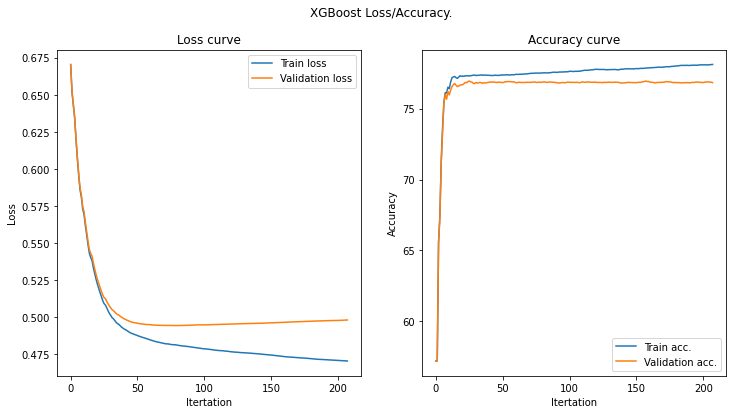

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5906580690570308
[LightGBM] [Warning] bagging_fraction is set=0.6900527315651497, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6900527315651497
[LightGBM] [Warning] bagging_freq is set=6195, subsample_freq=0 will be ignored. Current value: bagging_freq=6195
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.5906580690570308, colsample_bytree=1.0 will be ign

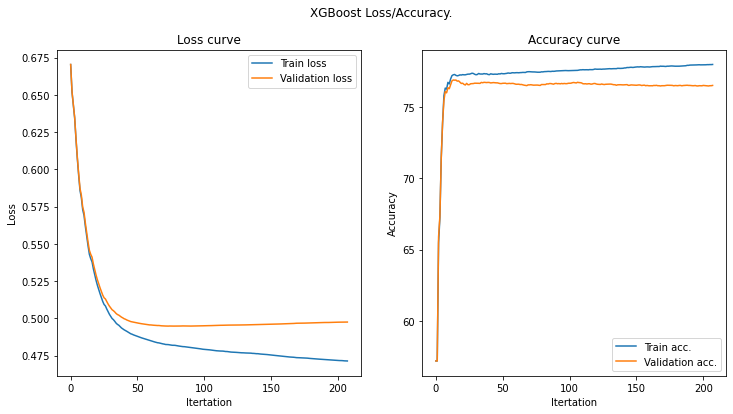

[I 2021-04-13 19:48:28,075] Trial 48 finished with value: 0.769525 and parameters: {'boosting': 'gbdt', 'n_estimators': 5531, 'learning_rate': 0.05916819499498139, 'max_depth': 35, 'num_leaves': 112, 'reg_alpha': 2.1499934270279115, 'reg_lambda': 9.875391124490971, 'feature_fraction': 0.5906580690570308, 'min_child_samples': 116, 'bagging_freq': 6195, 'bagging_fraction': 0.6900527315651497, 'max_bin': 384}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.769525
--------------------> Trial 49 <--------------------
--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5494743180561122
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_

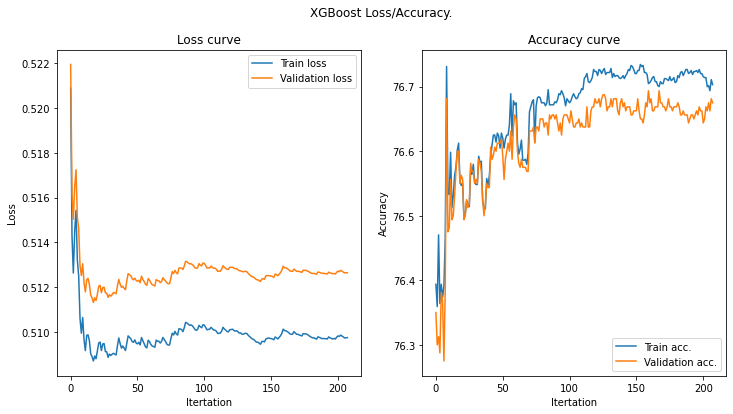

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5494743180561122
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Cu

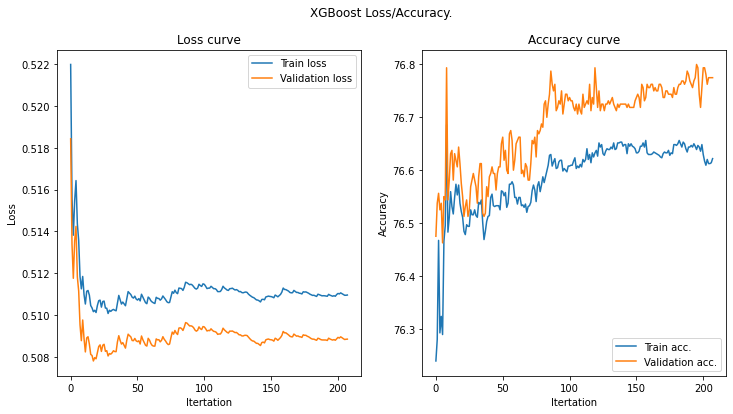

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5494743180561122
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Cu

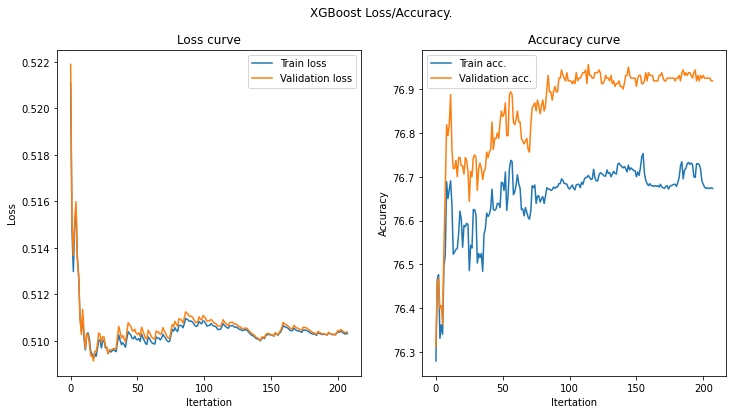

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5494743180561122
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Cu

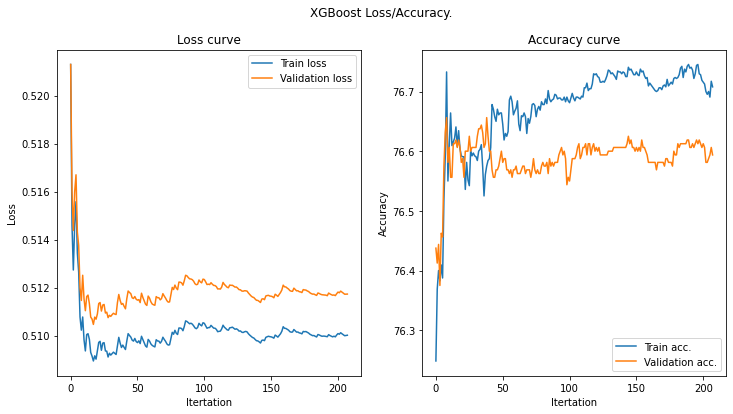

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5494743180561122
[LightGBM] [Warning] bagging_fraction is set=0.8604561400048523, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8604561400048523
[LightGBM] [Warning] bagging_freq is set=9243, subsample_freq=0 will be ignored. Current value: bagging_freq=9243
[LightGBM] [Warning] boosting is set=rf, boosting_type=gbdt will be ignored. Current value: boosting=rf
[LightGBM] [Warning] feature_fraction is set=0.5494743180561122, colsample_bytree=1.0 will be ignored. Cu

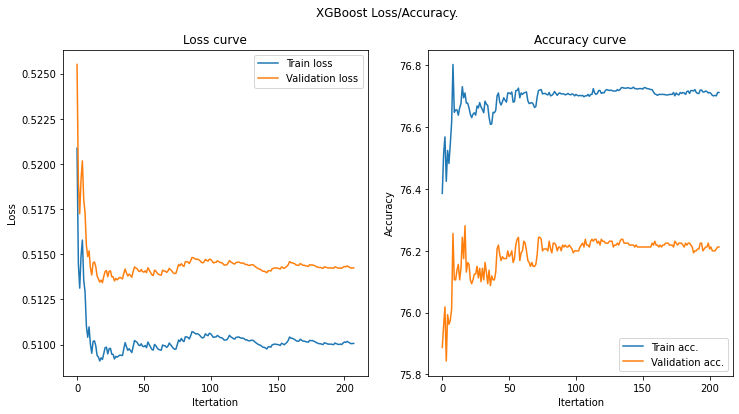

[I 2021-04-13 19:48:42,172] Trial 49 finished with value: 0.7663 and parameters: {'boosting': 'rf', 'n_estimators': 798, 'learning_rate': 0.042576648215952, 'max_depth': 23, 'num_leaves': 96, 'reg_alpha': 3.548163655258641, 'reg_lambda': 7.217726298878981, 'feature_fraction': 0.5494743180561122, 'min_child_samples': 299, 'bagging_freq': 9243, 'bagging_fraction': 0.8604561400048523, 'max_bin': 677}. Best is trial 0 with value: 0.7699625.


OOF ACCURACY: 0.7663
Accuracy: 0.7699625
Best hyperparameters: {'boosting': 'gbdt', 'n_estimators': 9376, 'learning_rate': 0.046736354175367235, 'max_depth': 54, 'num_leaves': 106, 'reg_alpha': 3.846833481689629, 'reg_lambda': 5.814231409330497, 'feature_fraction': 0.6477546229339732, 'min_child_samples': 235, 'bagging_freq': 2622, 'bagging_fraction': 0.7721683858465518, 'max_bin': 453}


In [20]:
study=optuna.create_study(study_name="LightGBM set 1 Optimization", direction='maximize')
study.optimize(objective, n_trials=50)

trial = study.best_trial
print('Accuracy: {}'.format(trial.value))

print("Best hyperparameters: {}".format(trial.params))

<h2 style="background-color:azure; text-align:center; font-size:200%">LightGBM set1 tuned model</h2>

In [27]:
para = {
        'verbosity': 1,
        'random_state': SEED,
        'n_jobs': -1,
        'is_unbalance': True,
        'bagging_seed': SEED,
        'feature_fraction_seed': SEED,
        'objective': 'binary',
        'boosting': 'gbdt', 
        'n_estimators': 9376, 
        'learning_rate': 0.046736354175367235, 
        'max_depth': 54, 
        'num_leaves': 106, 
        'reg_alpha': 3.846833481689629, 
        'reg_lambda': 5.814231409330497, 
        'feature_fraction': 0.6477546229339732, 
        'min_child_samples': 235, 
        'bagging_freq': 2622, 
        'bagging_fraction': 0.7721683858465518, 
        'max_bin': 453
}

--> Fold 1
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

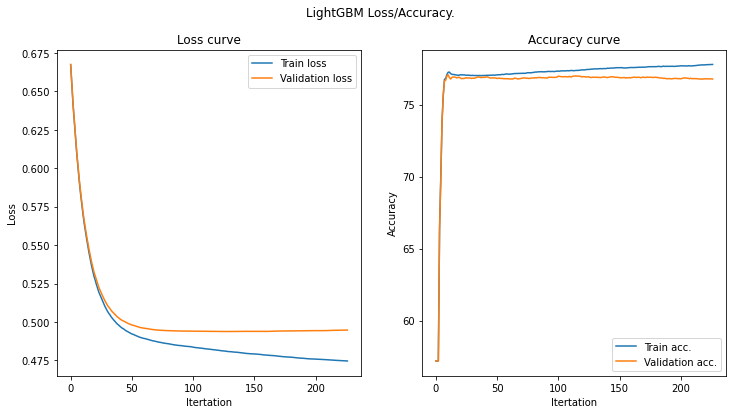

--> Fold 2
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

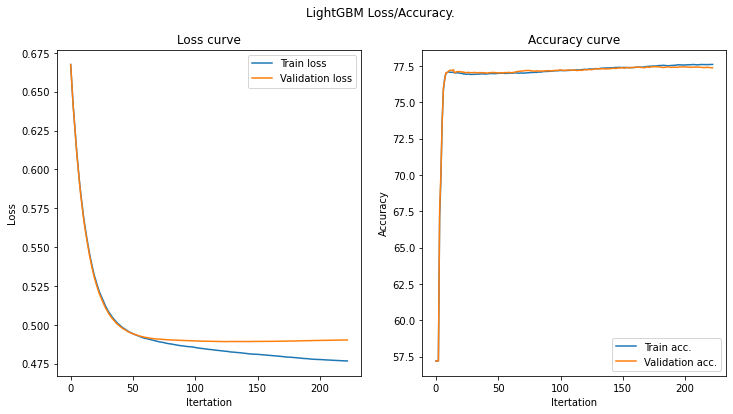

--> Fold 3
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

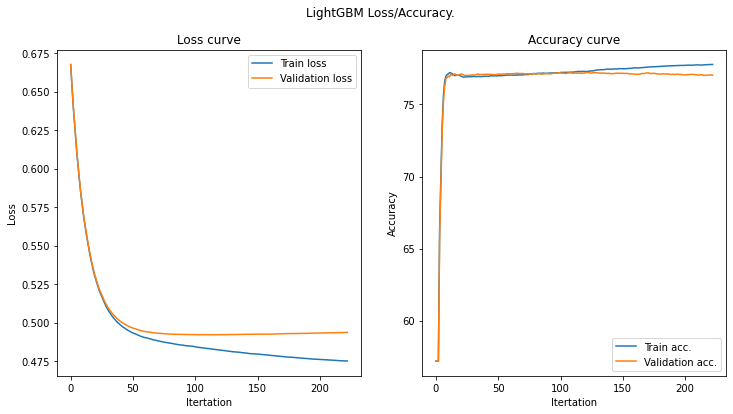

--> Fold 4
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

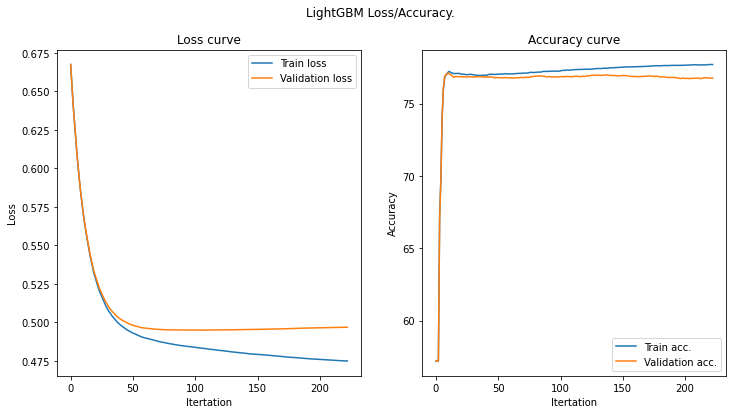

--> Fold 5
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6477546229339732
[LightGBM] [Warning] bagging_fraction is set=0.7721683858465518, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7721683858465518
[LightGBM] [Warning] bagging_freq is set=2622, subsample_freq=0 will be ignored. Current value: bagging_freq=2622
[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt
[LightGBM] [Warning] feature_fraction is set=0.6477546229339732, colsample_bytree=1.0 will be ign

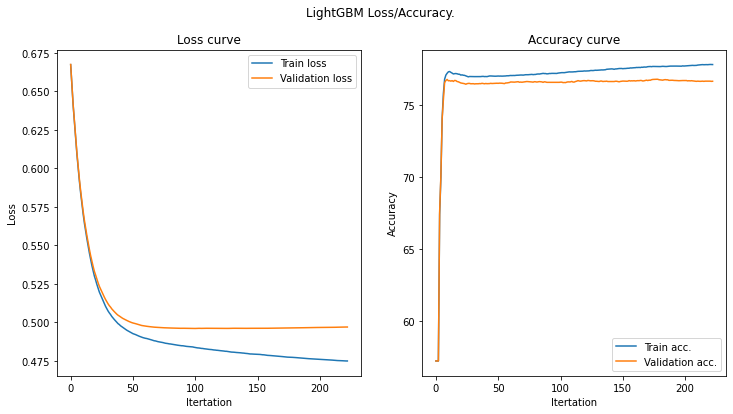

OOF ACCURACY Train: 0.7699625 Test: 0.7663


In [28]:
early_stopping_round = lightgbm.early_stopping(100, first_metric_only=True, verbose=True)

lg_train_preds = np.zeros(len(y_train),)
lg_test_preds = np.zeros(len(y_test),)
lg_test = np.zeros(len(test1),)
for fold, (train_ind, val_ind) in enumerate(kf.split(x_train, y_train)):
    print("--> Fold {}".format(fold + 1))
    
    xtrain, xval = x_train.iloc[train_ind], x_train.iloc[val_ind]
    ytrain, yval = y_train.iloc[train_ind], y_train.iloc[val_ind]
    
    lgbm = LGBMClassifier(**para)
        
    model =  lgbm.fit(xtrain, ytrain, eval_set=[(xtrain,ytrain), (xval,yval)], categorical_feature=None,
                      eval_metric = ['binary_logloss', 'binary_error'], verbose=-1, callbacks=[early_stopping_round])
    pred_train = model.predict_proba(xtrain, num_iteration=model.best_iteration_)[:,1]
    pred_val = model.predict_proba(xval, num_iteration=model.best_iteration_)[:,1]
    lg_train_preds[val_ind] = pred_val
    lg_test_preds += (model.predict_proba(x_test, num_iteration=model.best_iteration_)[:,1])/folds
    lg_test += (model.predict_proba(test1, num_iteration=model.best_iteration_)[:,1])/folds
    score1 = accuracy_score(ytrain, np.where(pred_train<=0.5, 0, 1))
    score2 = accuracy_score(yval, np.where(pred_val<=0.5, 0, 1))
    print('Fold {} ACCURACY Train: {} Validation: {}'.format(fold+1, score1, score2))

    results = model.evals_result_
    df=pd.DataFrame({
                    "train_ll":results["training"]["binary_logloss"],
                    "validation_ll":results["valid_1"]["binary_logloss"],
                    "train_acc":results["training"]["binary_error"],
                    "test_acc":results["valid_1"]["binary_error"],

    })
    df['train_acc']=(1-df['train_acc'])*100.0
    df['test_acc']=(1-df['test_acc'])*100.0
#         print(df.head())

    fig, ax = plt.subplots(ncols=2, figsize=(12,6))
    sns.lineplot(data=df, x=df.index, y="train_ll", ax=ax[0], label="Train loss")
    sns.lineplot(data=df, x=df.index, y="validation_ll", ax=ax[0], label="Validation loss")
    sns.lineplot(data=df, x=df.index, y="train_acc", ax=ax[1], label="Train acc.")
    sns.lineplot(data=df, x=df.index, y="test_acc", ax=ax[1], label="Validation acc.")
    ax[0].set_title("Loss curve")
    ax[1].set_title("Accuracy curve")
    ax[0].set_ylabel("Loss")
    ax[0].set_xlabel("Itertation")
    ax[1].set_ylabel("Accuracy")
    ax[1].set_xlabel("Itertation")
    fig.suptitle("LightGBM Loss/Accuracy.")
    plt.show()
    
acc1 = accuracy_score(y_train, np.where(lg_train_preds<=0.5, 0, 1))
acc2 = accuracy_score(y_test, np.where(lg_test_preds<=0.5, 0, 1))

print('OOF ACCURACY Train: {} Test: {}'.format(acc1, acc2))

score_train=pd.read_csv('../input/score-apr21/score_train.csv')
score_test=pd.read_csv('../input/score-apr21/score_test.csv')

score_train['lg']=np.concatenate([lg_train_preds,lg_test_preds])
score_test['lg']=lg_test

In [29]:
score_train.head()

,xg,rf,lg,cb
0,0.893169,NaN,0.565894,NaN
1,0.760047,NaN,0.529189,NaN
2,0.787606,NaN,0.927774,NaN
3,0.555690,NaN,0.661506,NaN
4,0.294982,NaN,0.058438,NaN


In [30]:
score_test.head()

,xg,rf,lg,cb
0,0.165310,NaN,0.160377,NaN
1,0.607289,NaN,0.611933,NaN
2,0.935854,NaN,0.931592,NaN
3,0.256100,NaN,0.222783,NaN
4,0.813994,NaN,0.787073,NaN


In [31]:
score_train.to_csv('./score_train.csv',index=False)
score_test.to_csv('./score_test.csv',index=False)

In [32]:
test_=pd.read_csv('../input/tabular-playground-series-apr-2021/test.csv')
df=pd.DataFrame()
df['PassengerId']=test_['PassengerId'].values
df['Survived']=score_test['lg']
df['Survived']=df['Survived'].apply(lambda x:0 if x<=0.5 else 1)
df.to_csv('./lg_tuned.csv',index=False)

<h2 style="background-color:azure; text-align:center; font-size:200%">LightGBM set2</h2>